In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNetCV
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

In [2]:
file_path="D:/BE-project/datasets/GDSC_DATASET.csv"

In [3]:
df=pd.read_csv(file_path)

In [4]:
df=df.dropna(subset=['DRUG_NAME', 'LN_IC50', 'AUC', 'GDSC Tissue descriptor 2'])


In [5]:
# Simulate gene expression data (replace with real genes if you have)
np.random.seed(42)
gene_expr_all = pd.DataFrame(np.random.rand(len(df), 1000), columns=[f"Gene_{i}" for i in range(1000)])

In [6]:
# Store final predicted IC50 values
all_predictions = []

# Unique drugs
unique_drugs = df['DRUG_NAME'].unique()

In [7]:
for drug in unique_drugs:
    sub_df = df[df['DRUG_NAME'] == drug].dropna()
    if len(sub_df) < 30:
        continue  # skip small samples

    sub_df = sub_df.reset_index(drop=True)
    gene_expr = gene_expr_all.iloc[:len(sub_df)].copy()
    gene_expr['IC50'] = sub_df['LN_IC50'].values


In [8]:
# Feature pre-selection using Pearson correlation
selected_genes = []

for gene in gene_expr.columns[:-1]:
    _, p = pearsonr(gene_expr[gene], gene_expr["IC50"])
    if p < 0.05:
        selected_genes.append(gene)

    # Skip drug if no significant genes
    if not selected_genes:
        continue

# Final features and labels
X = gene_expr[selected_genes]
y = gene_expr["IC50"]



In [9]:
 # Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train ElasticNet model
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
model = ElasticNetCV(l1_ratio=0.5, cv=5)
model.fit(X_train, y_train)

# Predict on full data
predicted_ic50 = model.predict(X_scaled)

# Add prediction to dataframe
pred_df = sub_df.copy()
pred_df['Predicted_IC50'] = predicted_ic50
pred_df['Selected_Genes'] = len(selected_genes)
all_predictions.append(pred_df)

In [10]:
# Combine all predictions
final_df = pd.concat(all_predictions)

# Group by drug and cancer type, take mean of predicted IC50
grouped = final_df.groupby(['DRUG_NAME', 'GDSC Tissue descriptor 2'])['Predicted_IC50'].mean().reset_index()

# Find most sensitive cancer types (lowest IC50 per drug)
top_by_drug = (
    grouped.sort_values(['DRUG_NAME', 'Predicted_IC50'])
    .groupby('DRUG_NAME')
    .head(50)
    .reset_index(drop=True)
)

# Show results
print("\n📊 Top Cancer Types Per Drug Based on Predicted IC50 (ElasticNet):")
print(top_by_drug)

In [11]:
for drug in unique_drugs:
    sub_df = df[df['DRUG_NAME'] == drug].dropna()
    if len(sub_df) < 30:
        continue  # skip small samples

    sub_df = sub_df.reset_index(drop=True)
    gene_expr = gene_expr_all.iloc[:len(sub_df)].copy()
    gene_expr['IC50'] = sub_df['LN_IC50'].values

    # Feature pre-selection using Pearson correlation
    selected_genes = []
    for gene in gene_expr.columns[:-1]:
        _, p = pearsonr(gene_expr[gene], gene_expr["IC50"])
        if p < 0.05:
            selected_genes.append(gene)

    if not selected_genes:
        continue

    X = gene_expr[selected_genes]
    y = gene_expr["IC50"]

    # Normalize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Train ElasticNet model
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
    model = ElasticNetCV(l1_ratio=0.5, cv=5)
    model.fit(X_train, y_train)

    # Predict on full data
    predicted_ic50 = model.predict(X_scaled)

    # Add prediction to dataframe
    pred_df = sub_df.copy()
    pred_df['Predicted_IC50'] = predicted_ic50
    pred_df['Selected_Genes'] = len(selected_genes)
    all_predictions.append(pred_df)

# Combine all predictions
final_df = pd.concat(all_predictions)

# Group by drug and cancer type, take mean of predicted IC50
grouped = final_df.groupby(['DRUG_NAME', 'GDSC Tissue descriptor 2'])['Predicted_IC50'].mean().reset_index()

# Find most sensitive cancer types (lowest IC50 per drug)
top_by_drug = (
    grouped.sort_values(['DRUG_NAME', 'Predicted_IC50'])
    .groupby('DRUG_NAME')
    .head(3)
    .reset_index(drop=True)
)

# Show results
print("\n📊 Top Cancer Types Per Drug Based on Predicted IC50 (ElasticNet):")
print(top_by_drug)


📊 Top Cancer Types Per Drug Based on Predicted IC50 (ElasticNet):
                 DRUG_NAME       GDSC Tissue descriptor 2  Predicted_IC50
0           5-Fluorouracil                       leukemia        3.196297
1           5-Fluorouracil        lymphoid_neoplasm other        3.690234
2           5-Fluorouracil                B_cell_lymphoma        3.829864
3            5-azacytidine                       leukemia        1.937479
4            5-azacytidine  haematopoietic_neoplasm other        2.031551
..                     ...                            ...             ...
742  ascorbate (vitamin C)                       leukemia        9.355629
743  ascorbate (vitamin C)                medulloblastoma        9.670994
744            glutathione                       leukemia        8.327694
745            glutathione  haematopoietic_neoplasm other        8.744523
746            glutathione                T_cell_leukemia        8.745200

[747 rows x 3 columns]


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


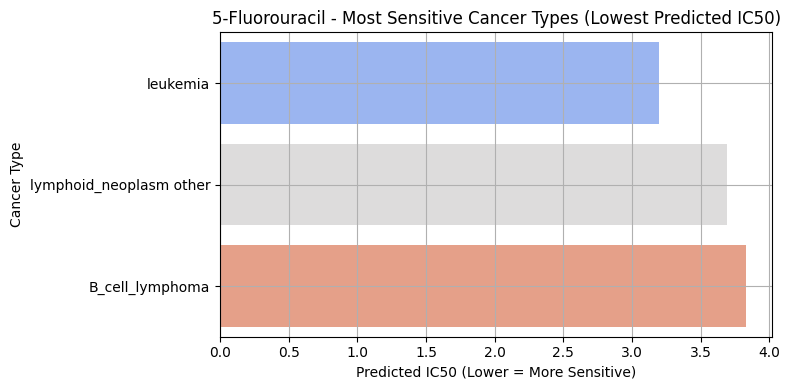

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


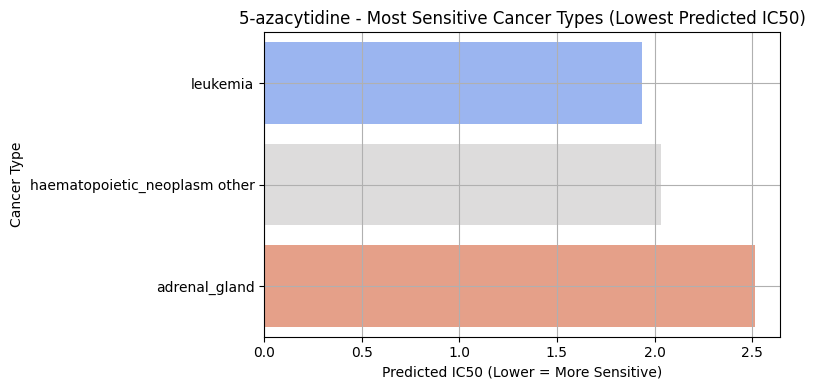

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


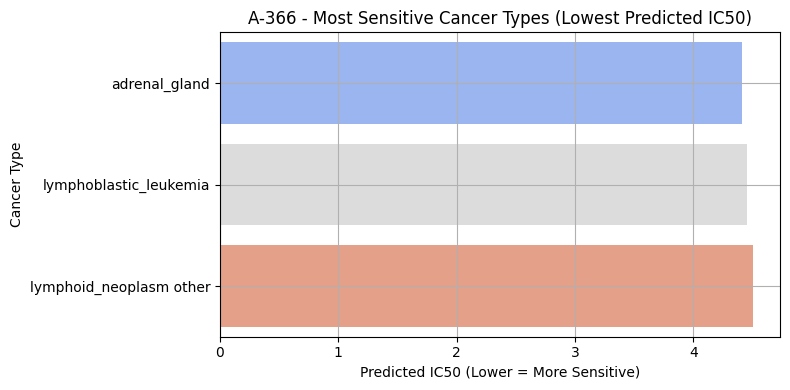

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


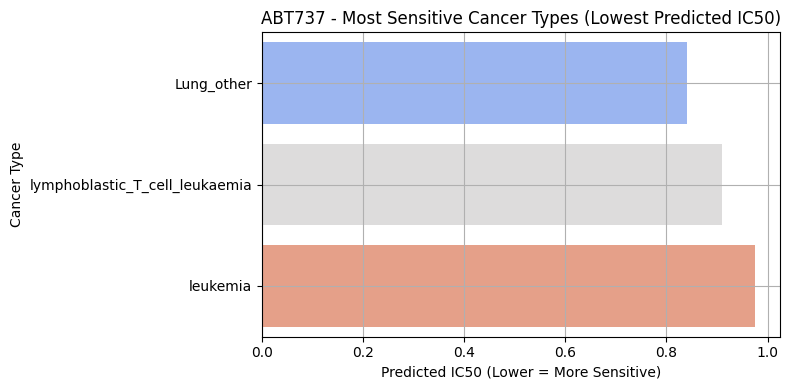

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


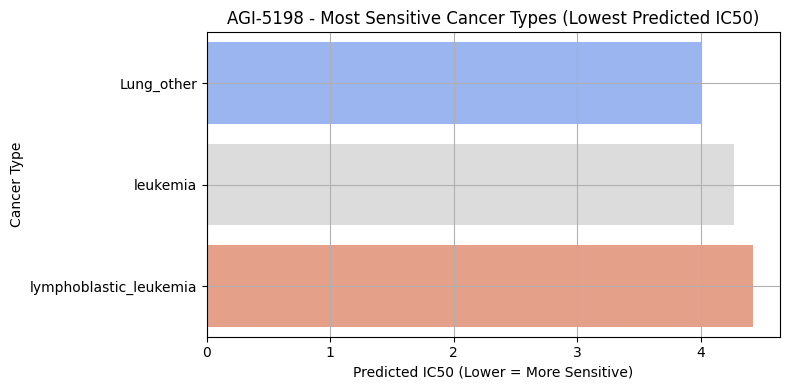

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


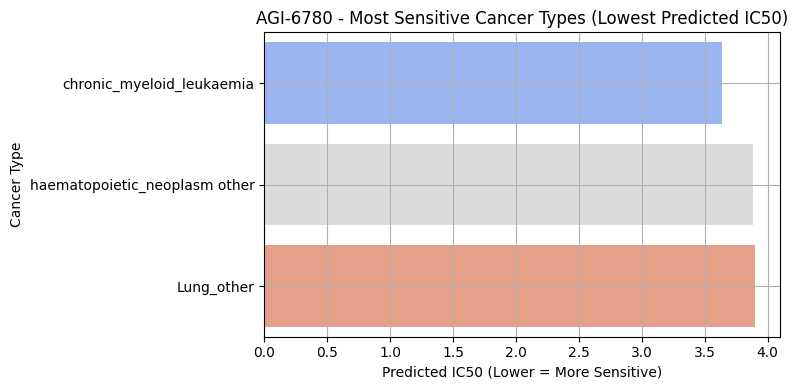

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


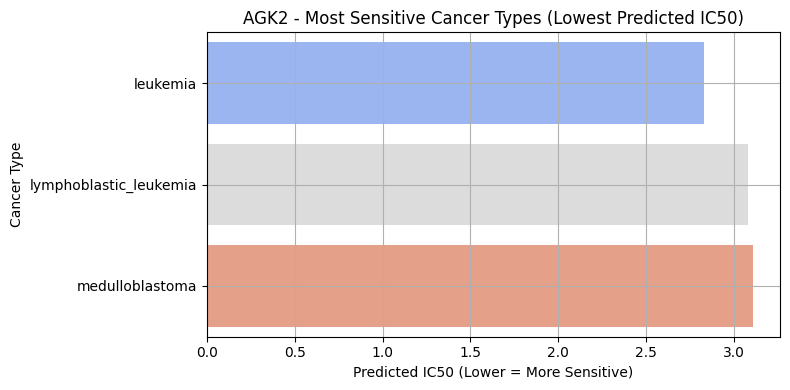

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


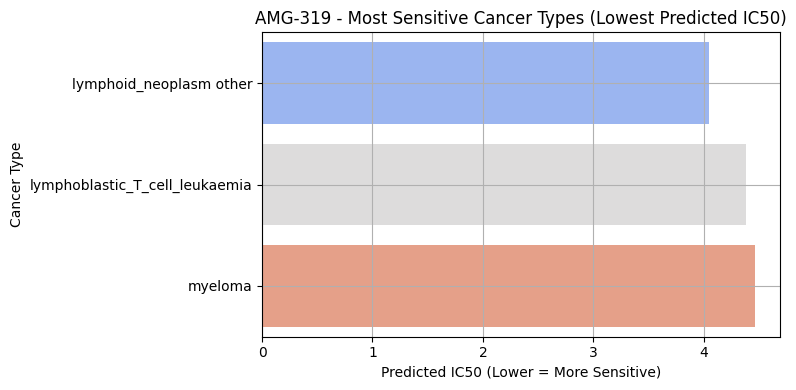

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


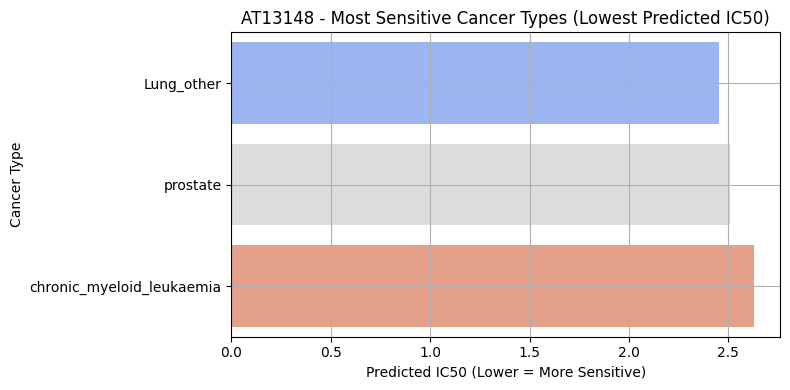

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


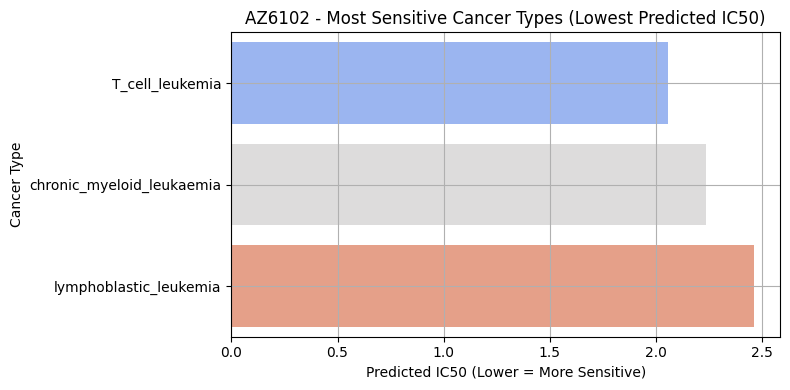

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


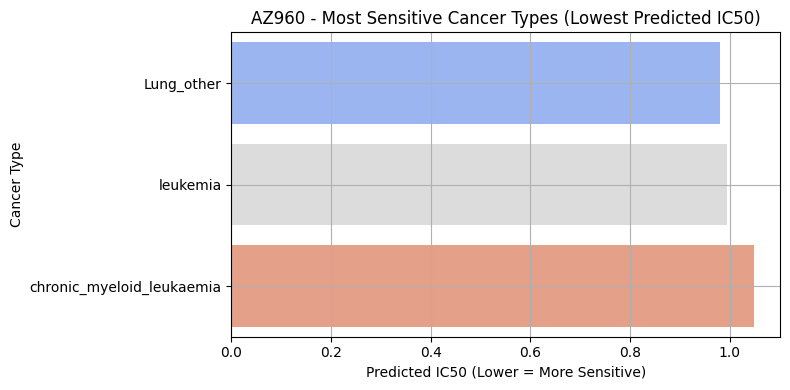

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


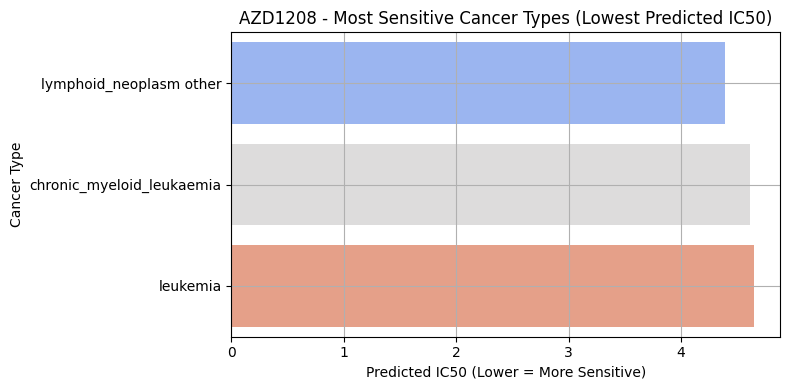

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


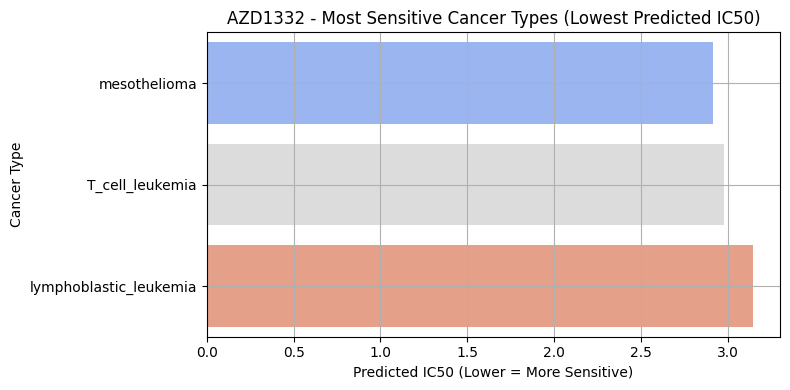

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


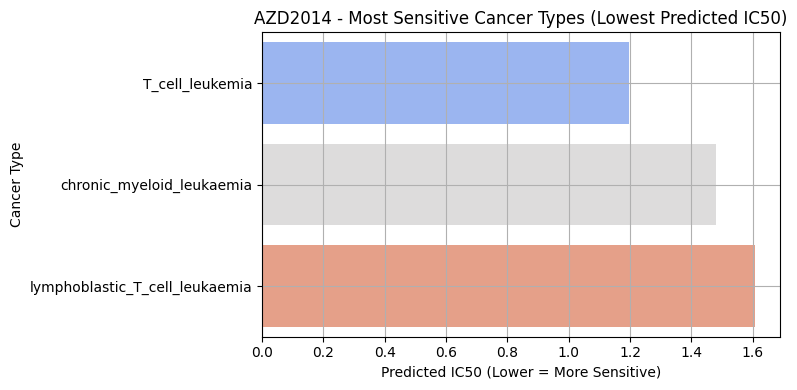

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


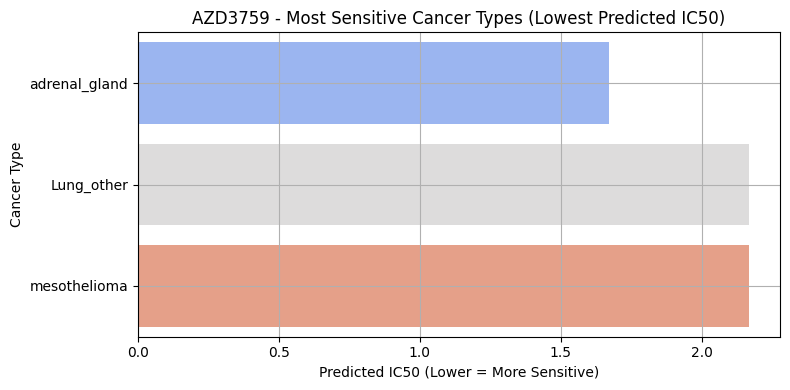

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


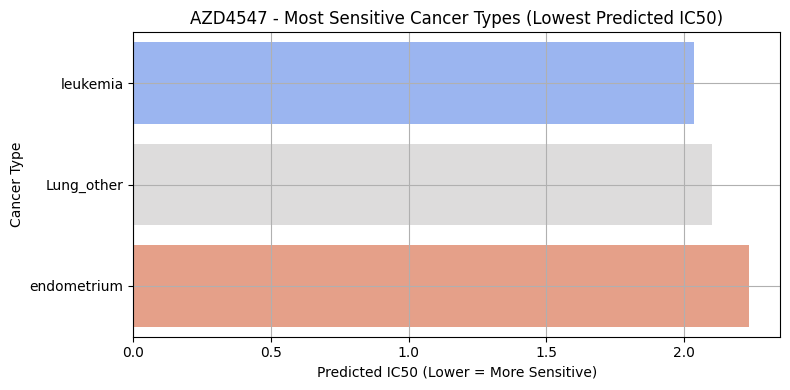

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


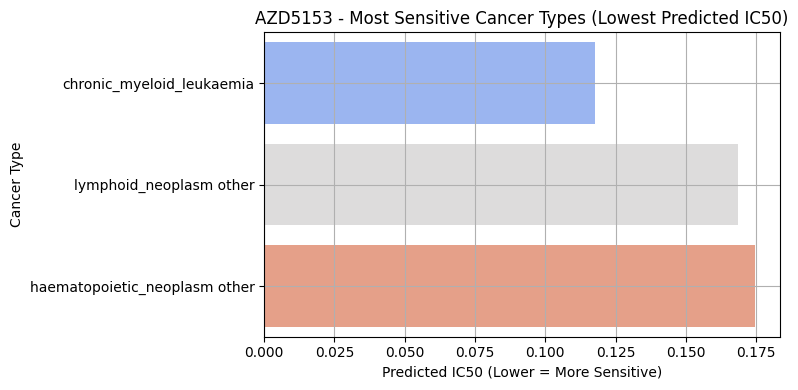

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


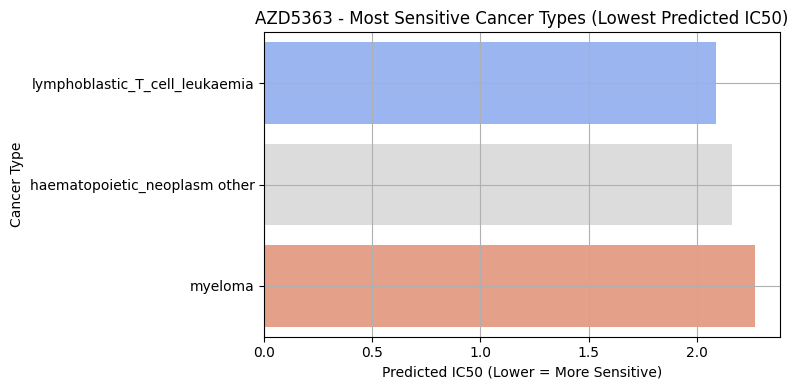

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


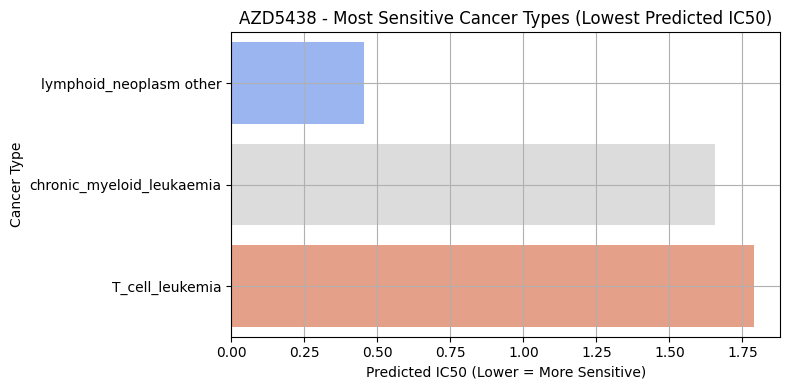

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


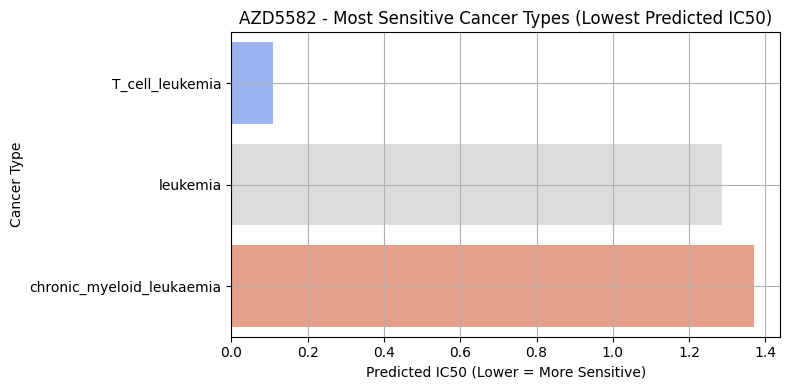

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


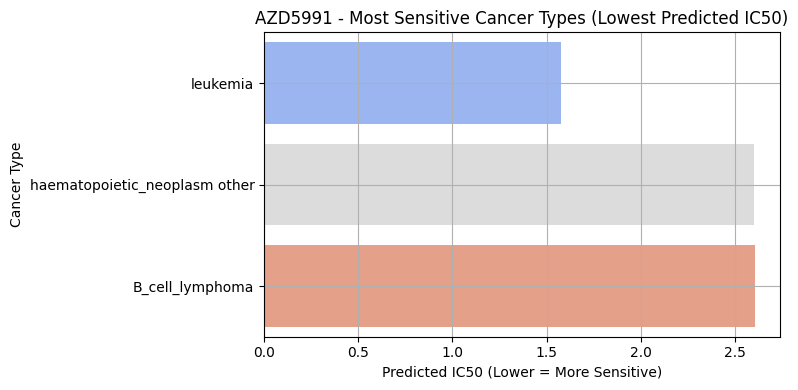

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


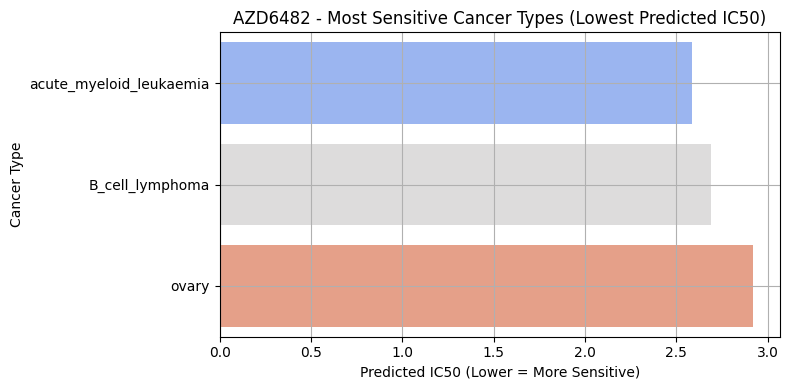

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


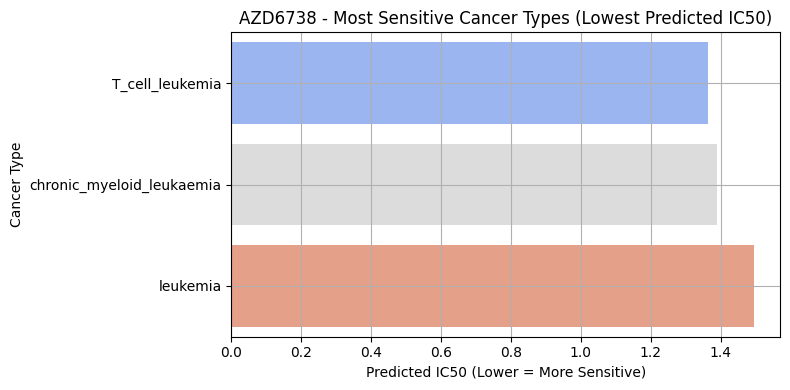

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


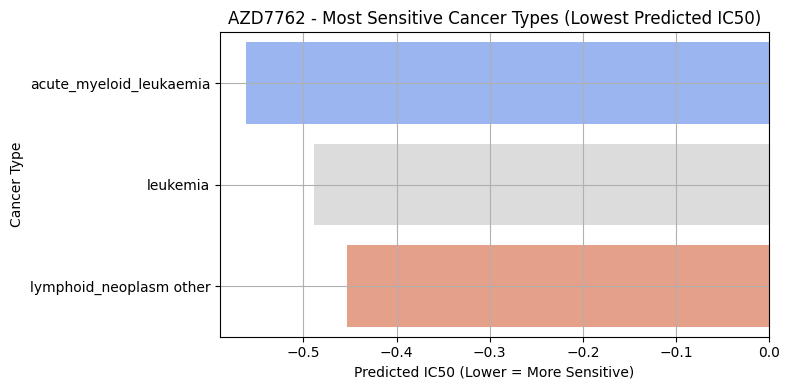

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


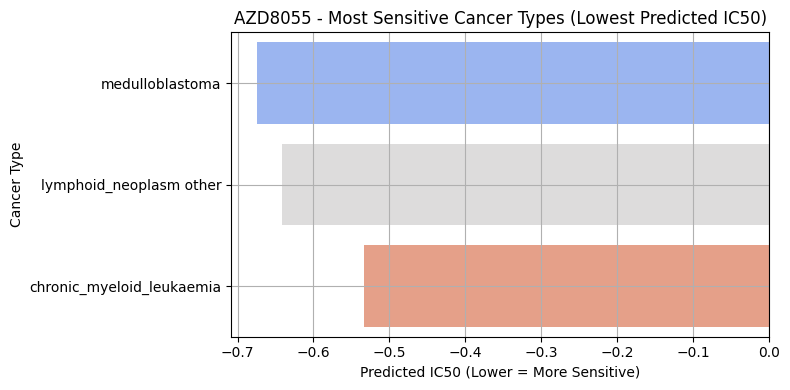

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


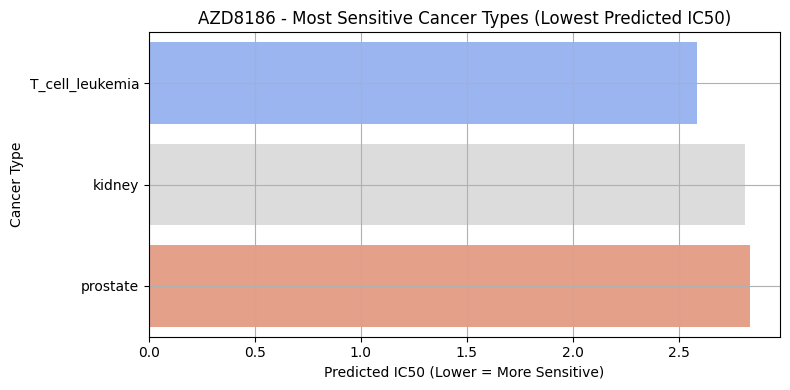

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


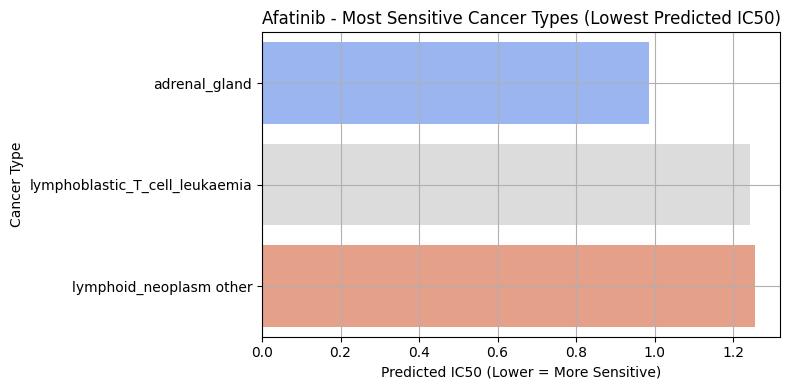

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


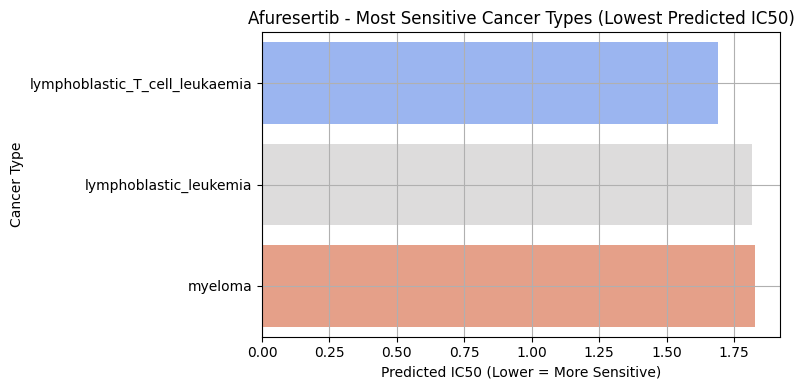

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


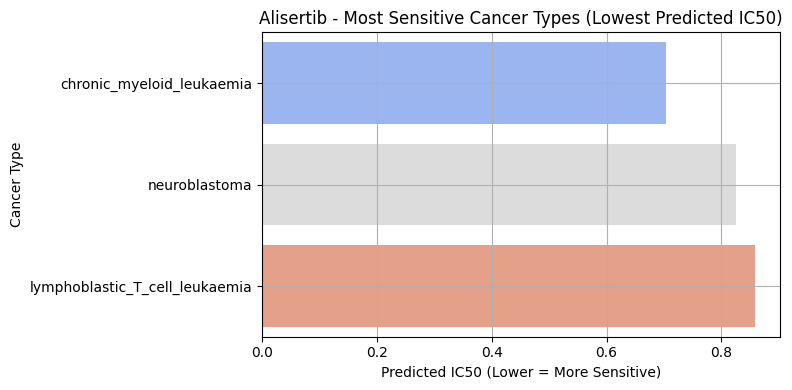

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


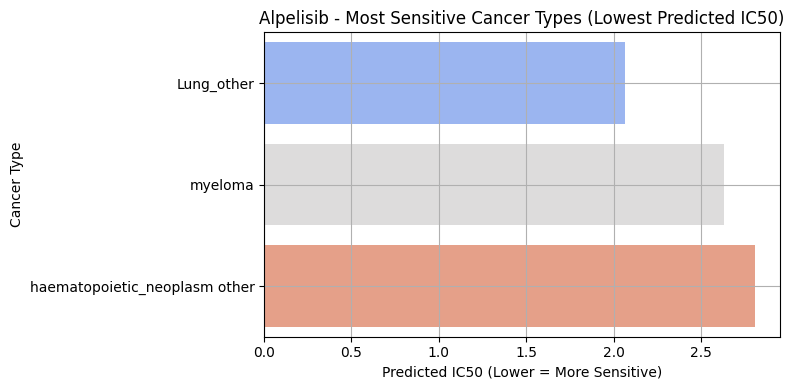

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


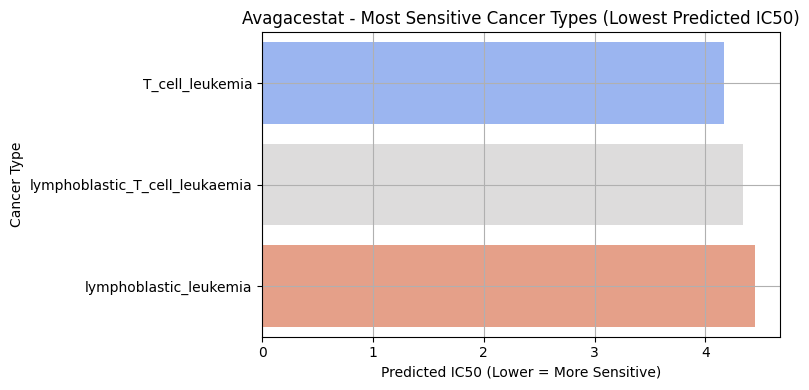

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


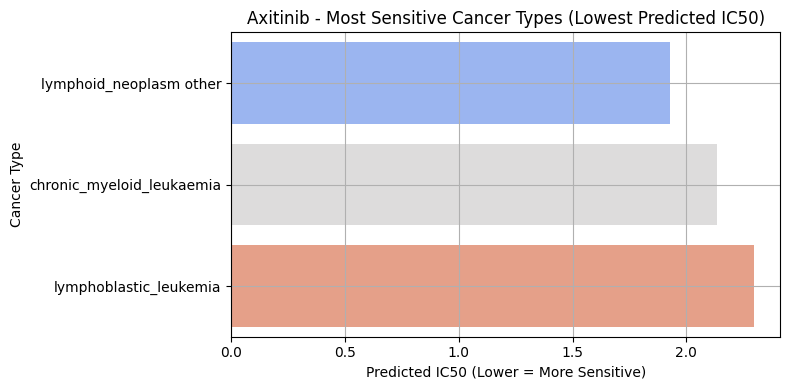

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


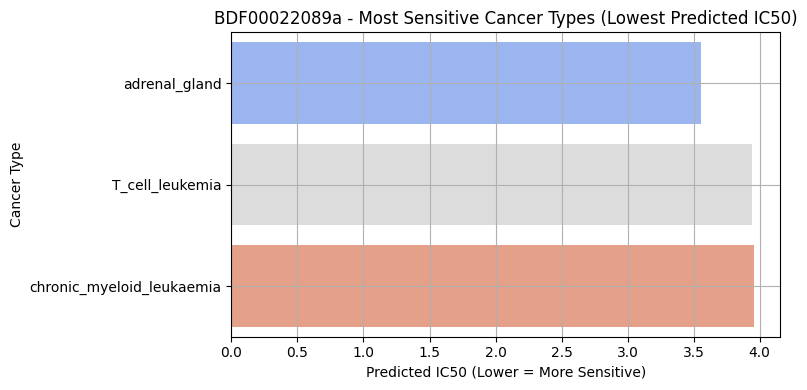

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


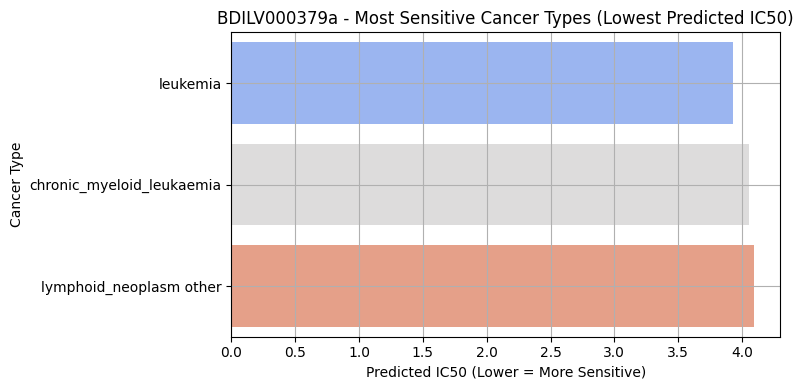

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


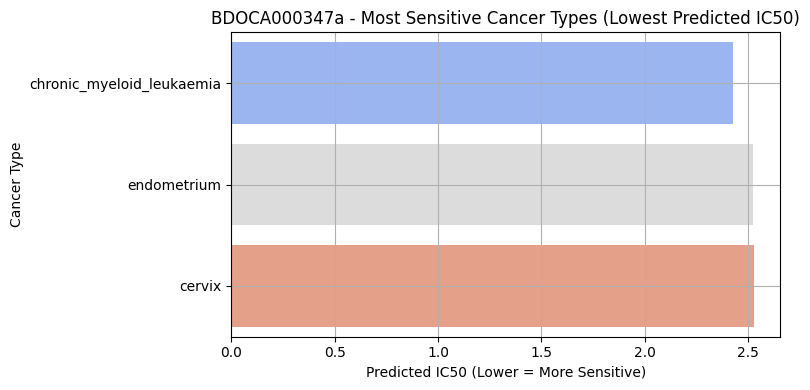

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


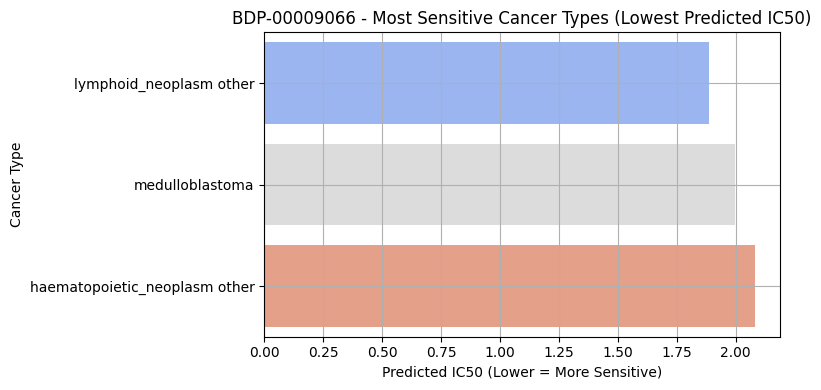

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


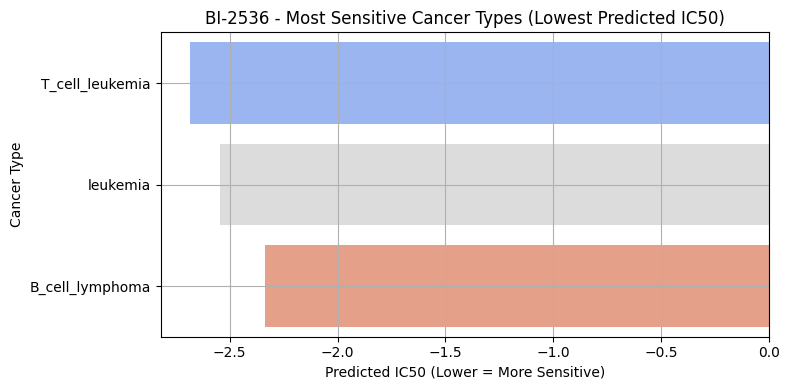

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


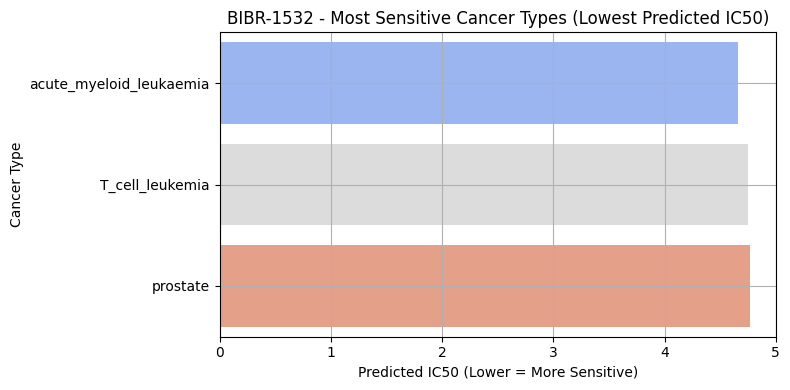

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


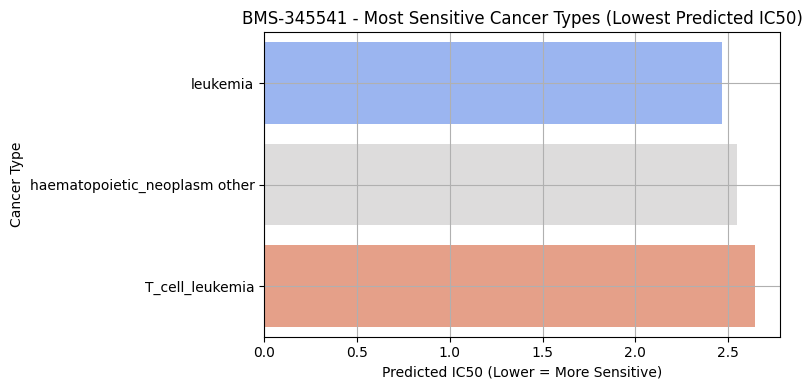

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


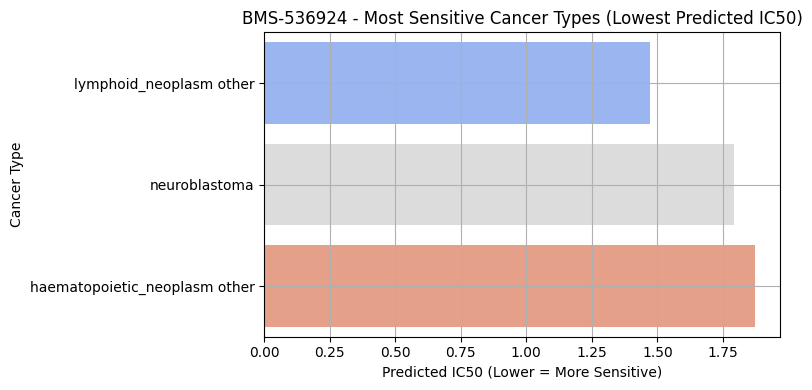

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


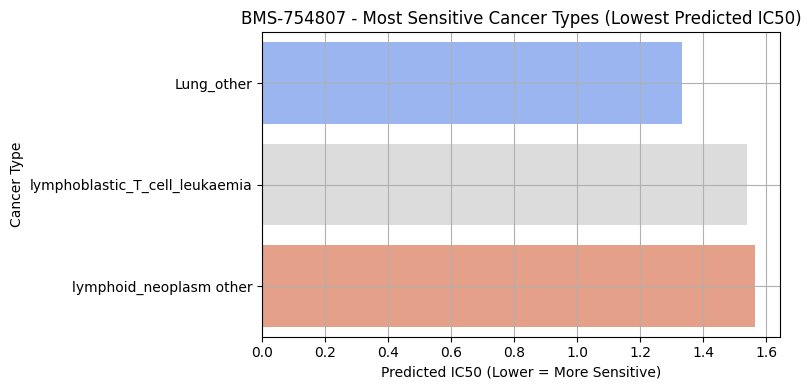

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


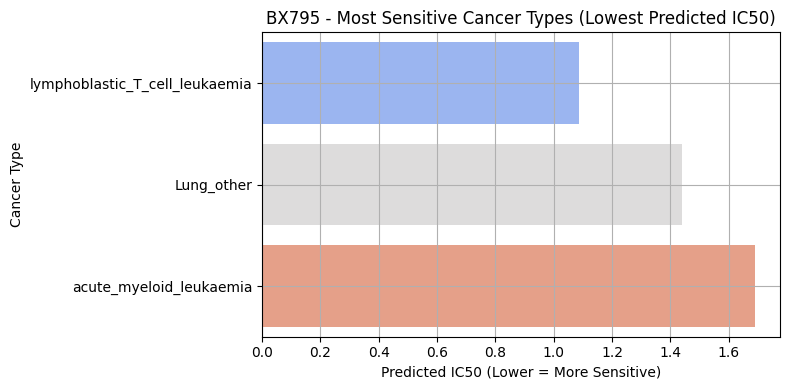

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


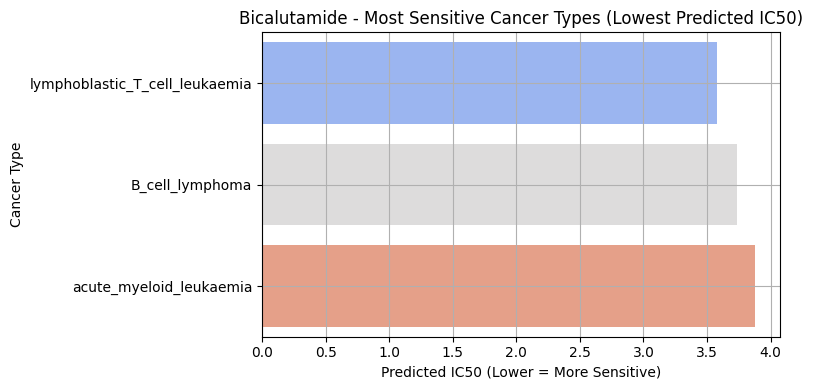

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


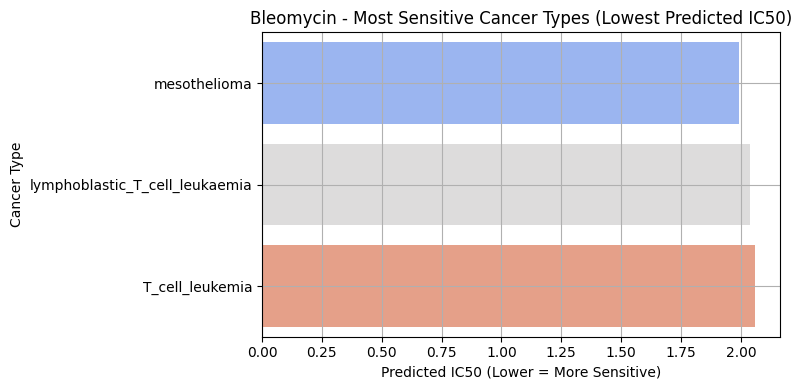

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


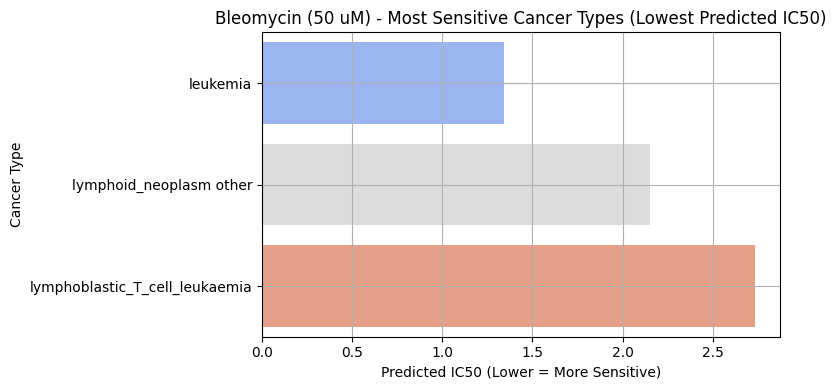

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


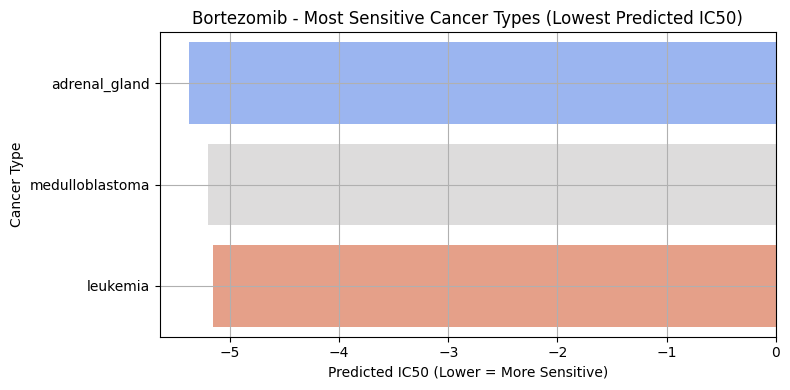

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


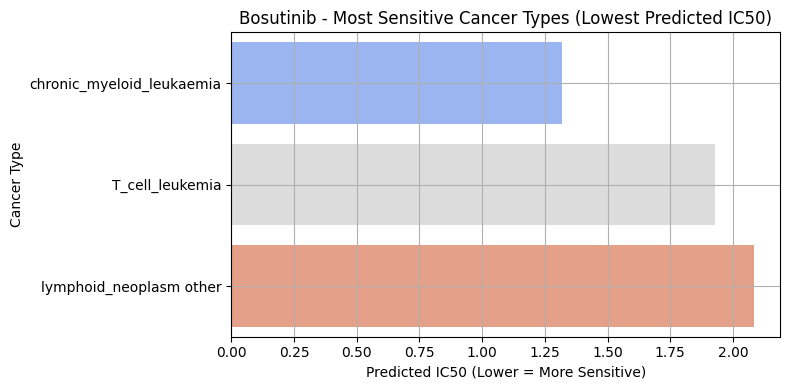

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


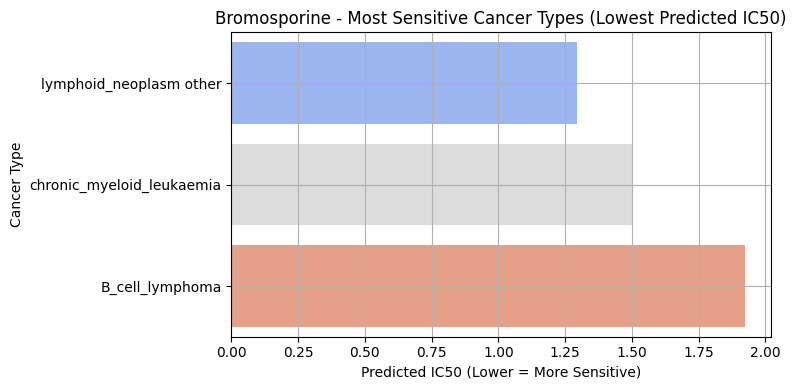

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


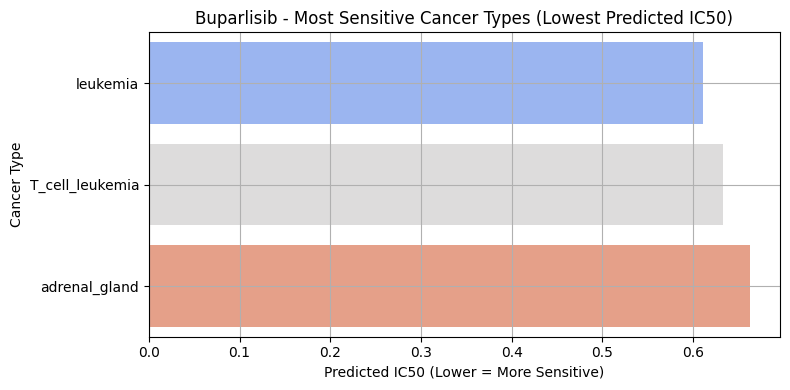

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


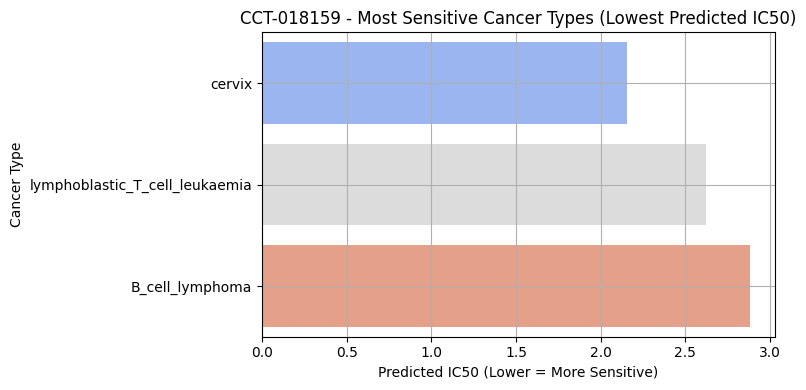

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


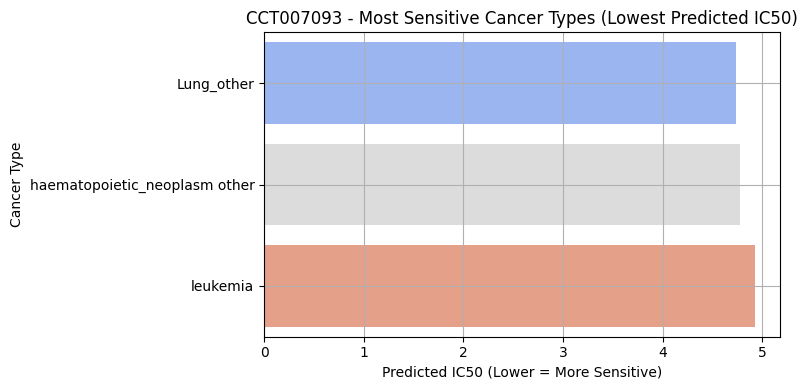

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


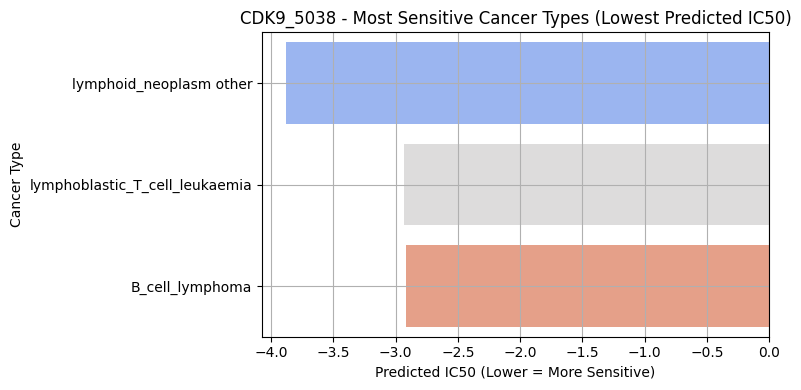

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


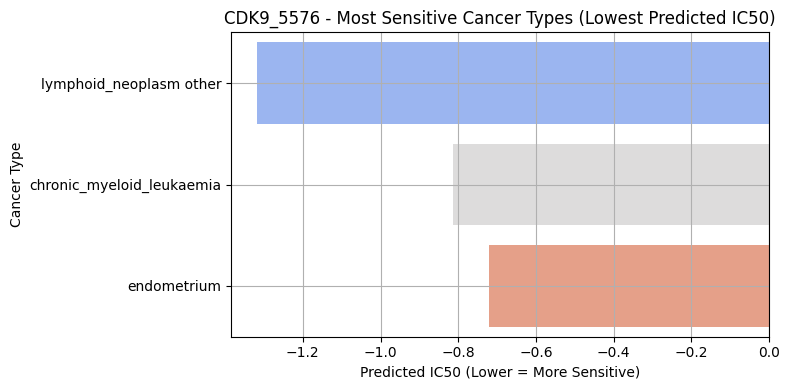

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


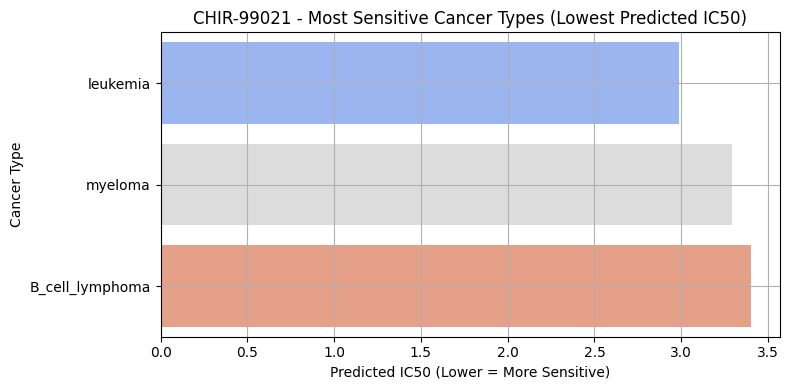

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


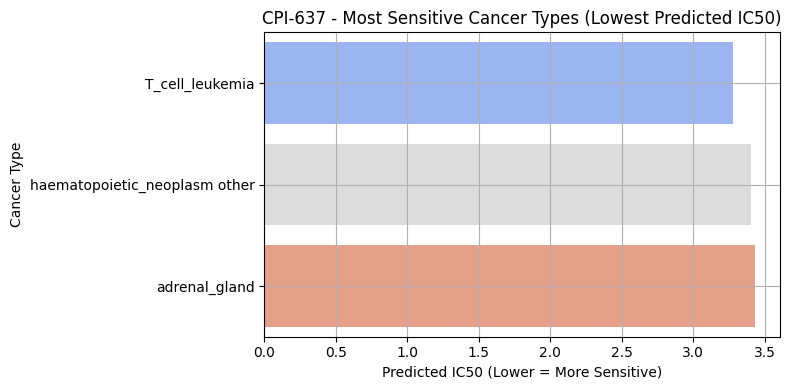

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


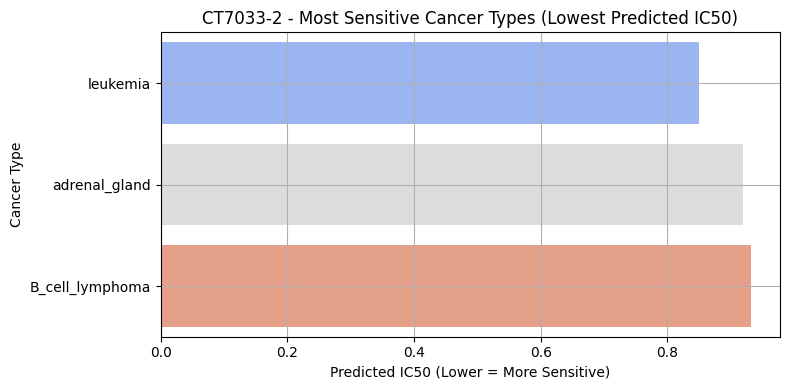

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


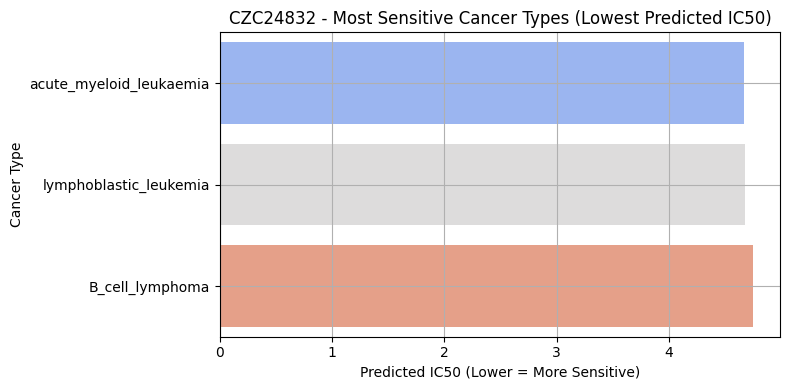

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


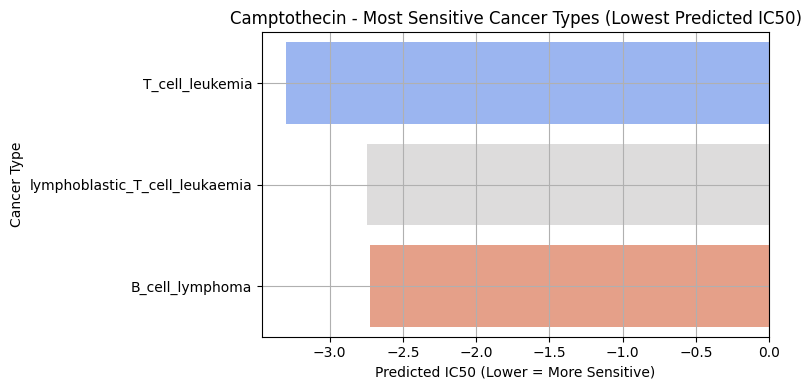

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


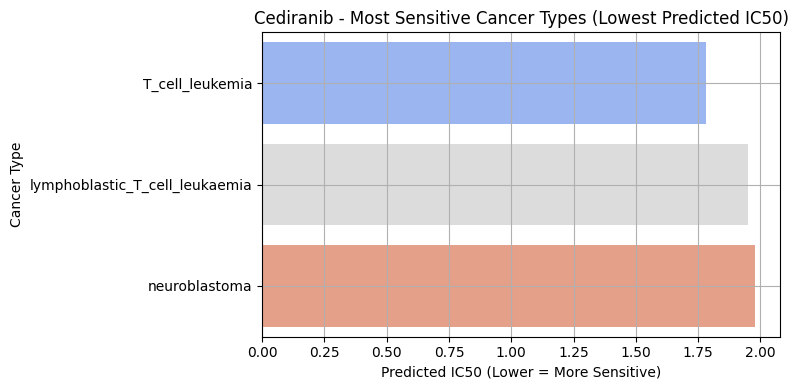

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


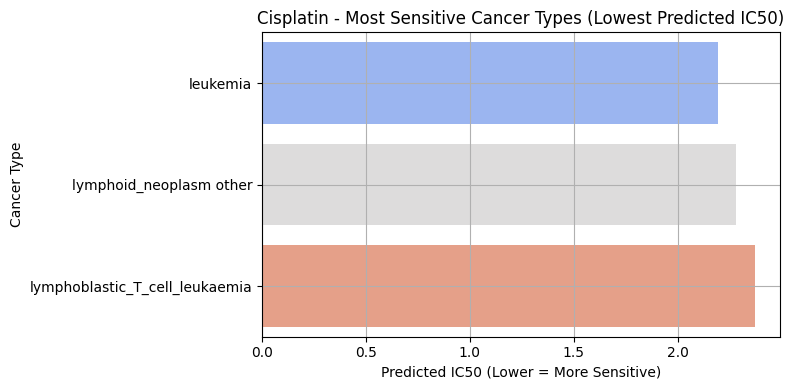

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


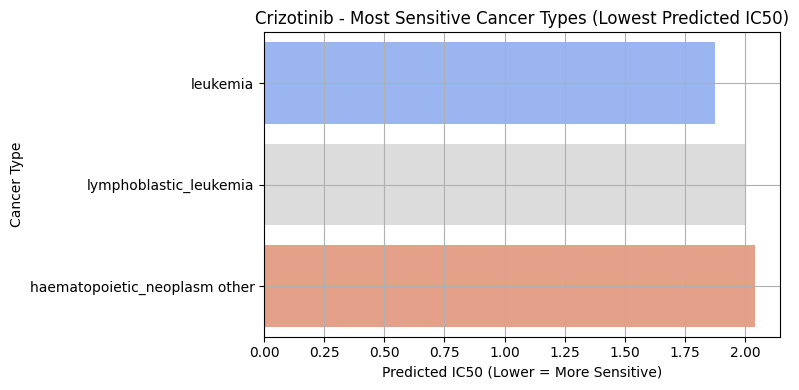

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


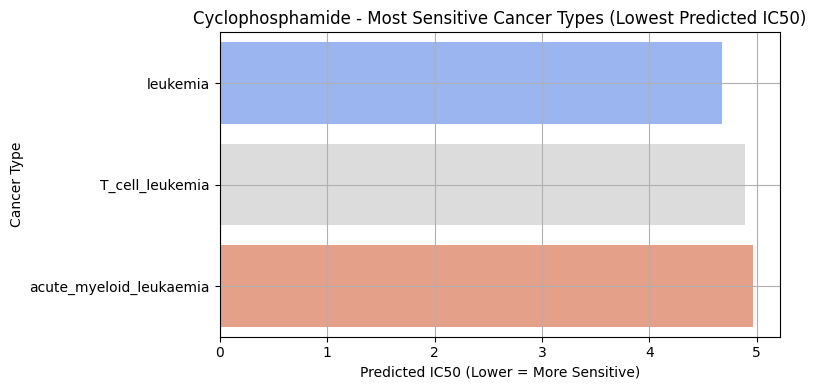

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


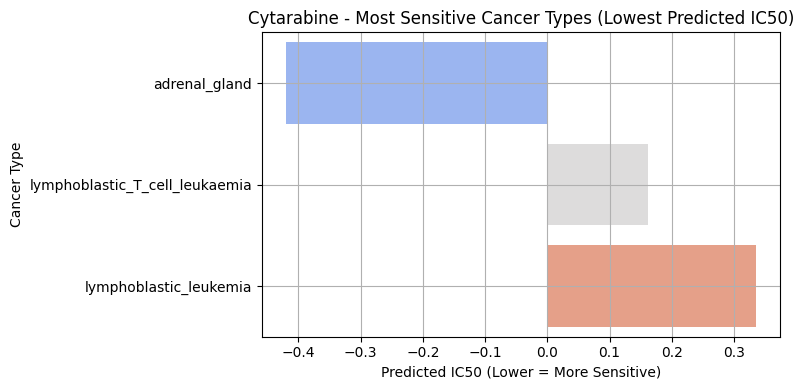

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


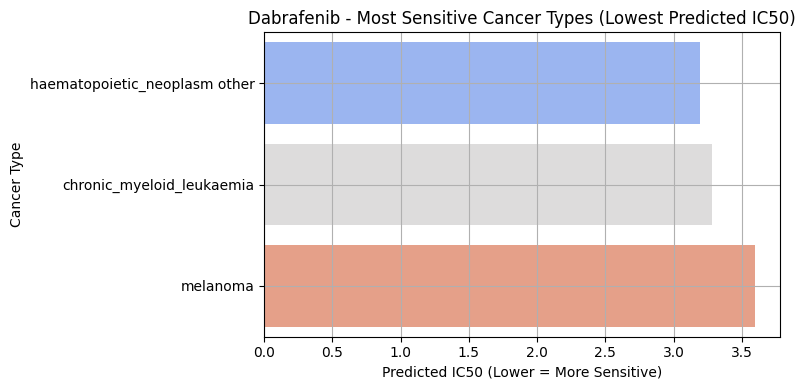

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


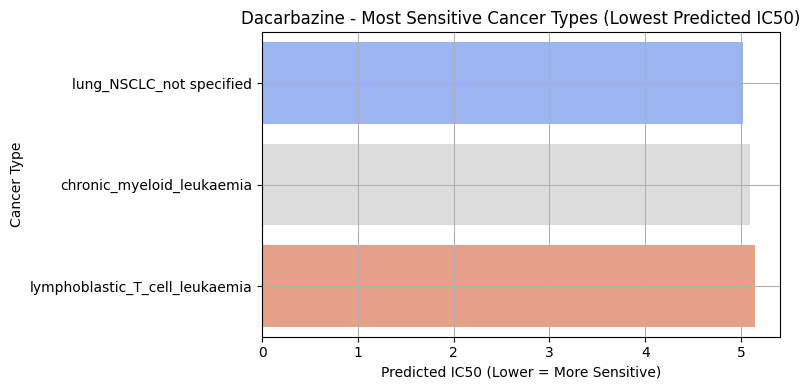

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


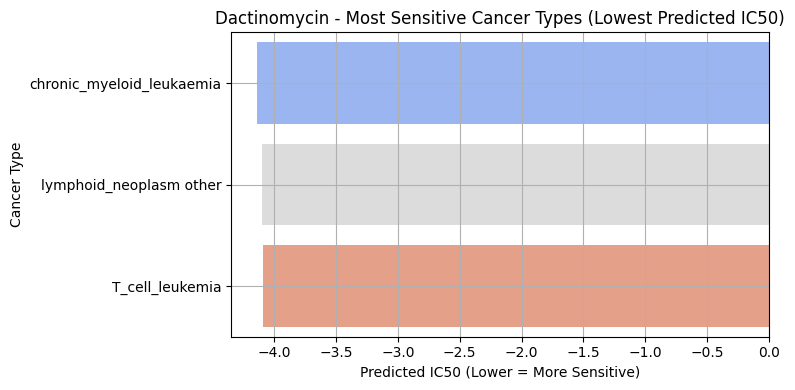

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


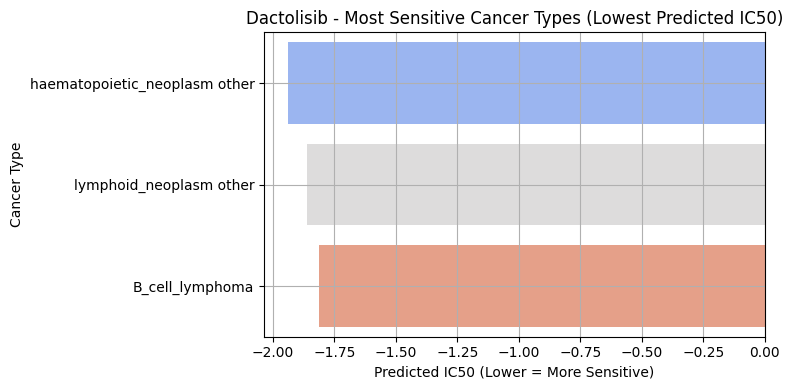

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


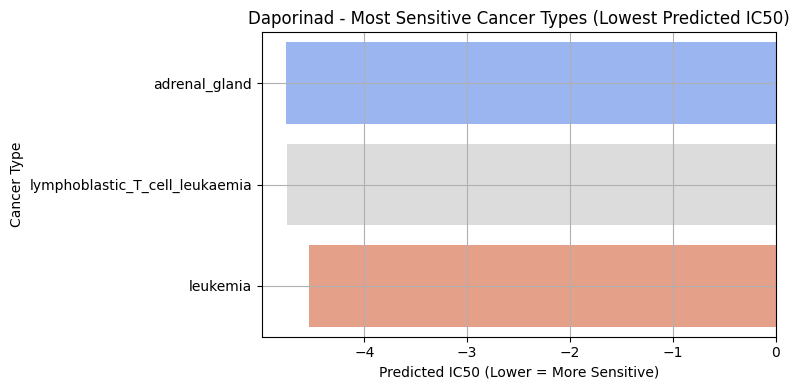

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


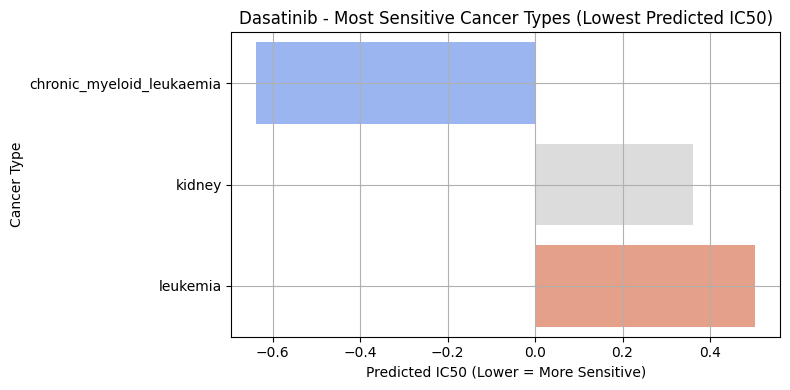

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


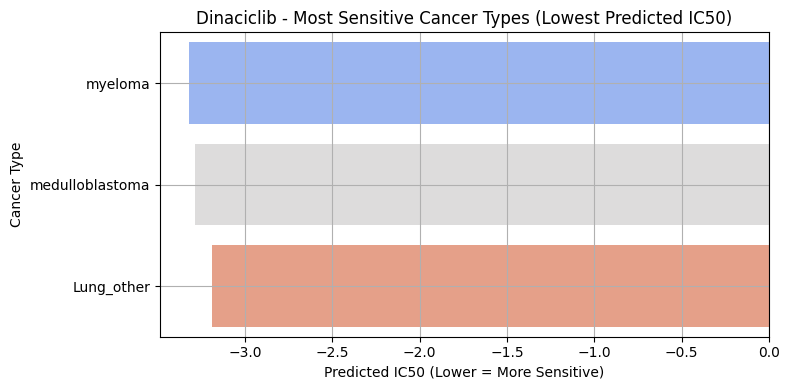

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


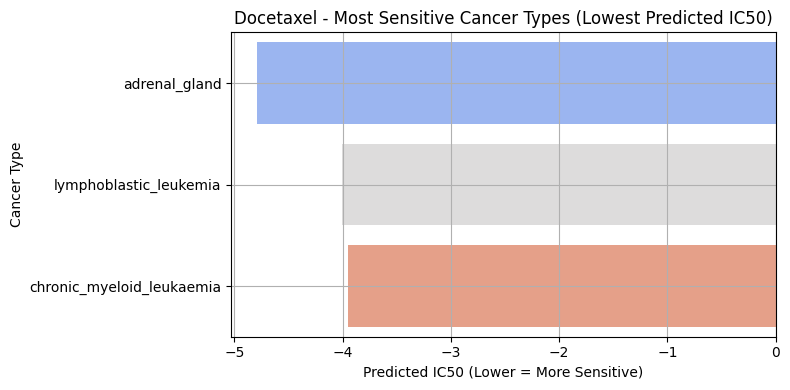

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


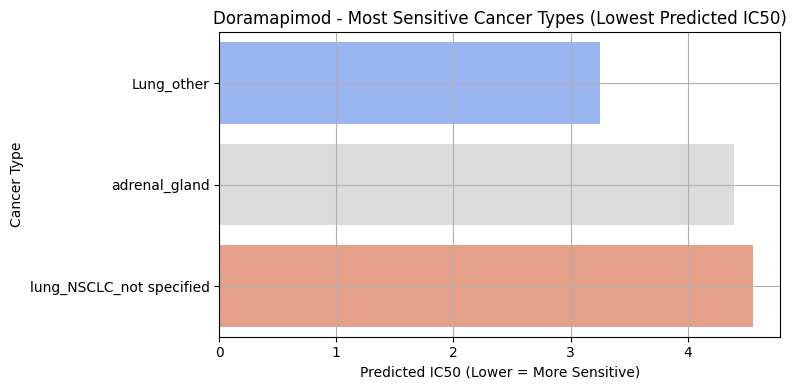

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


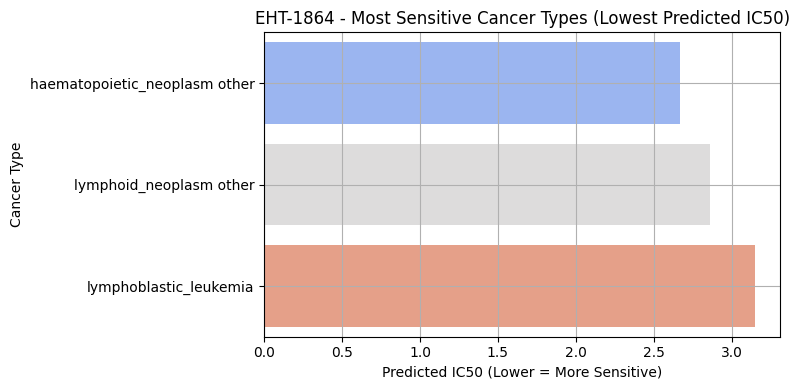

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


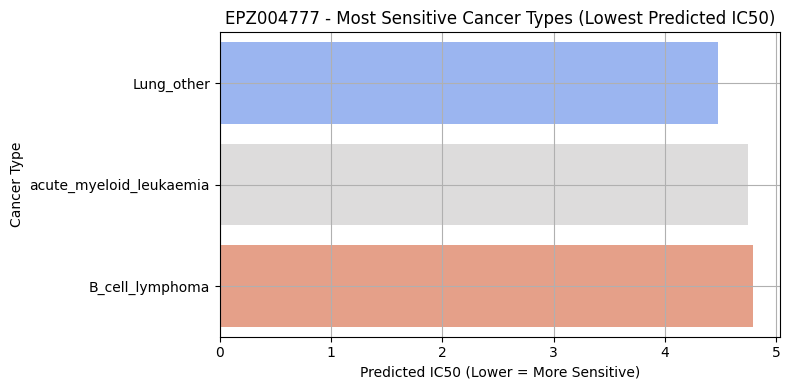

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


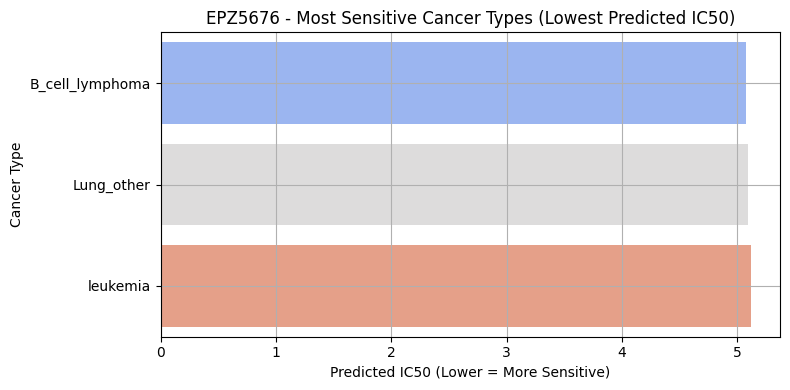

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


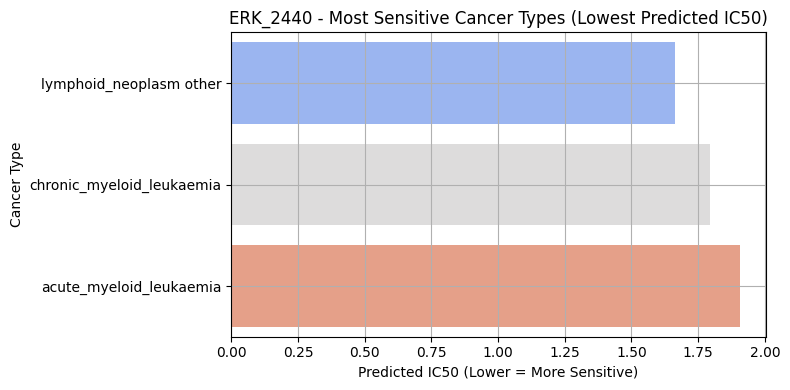

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


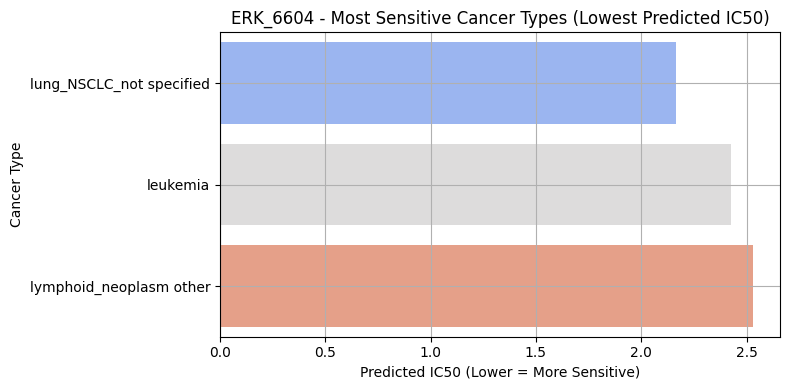

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


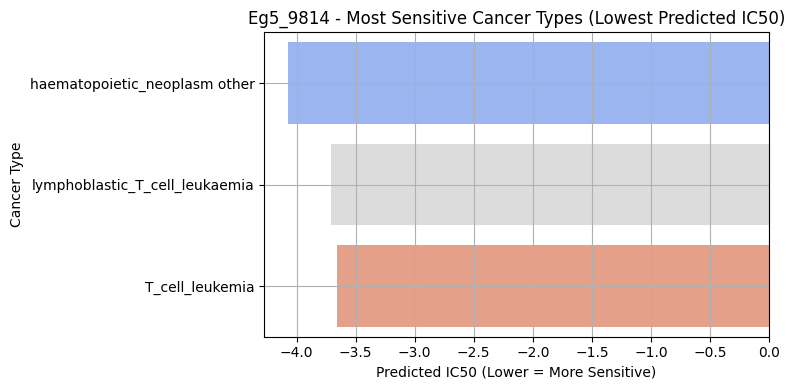

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


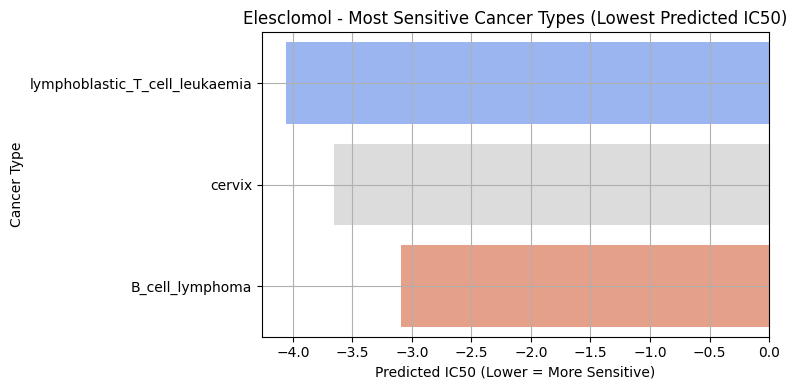

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


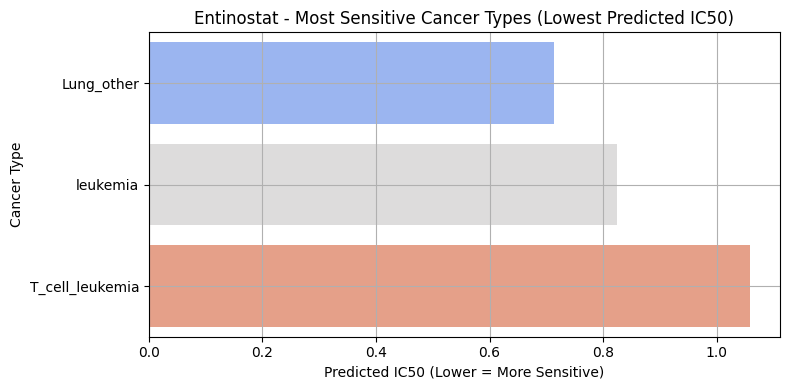

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


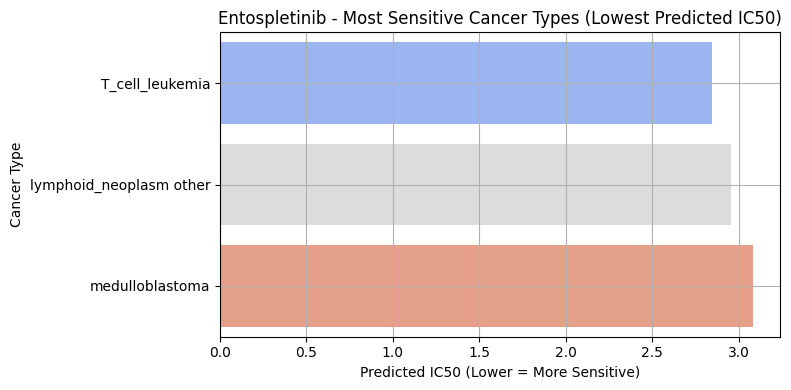

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


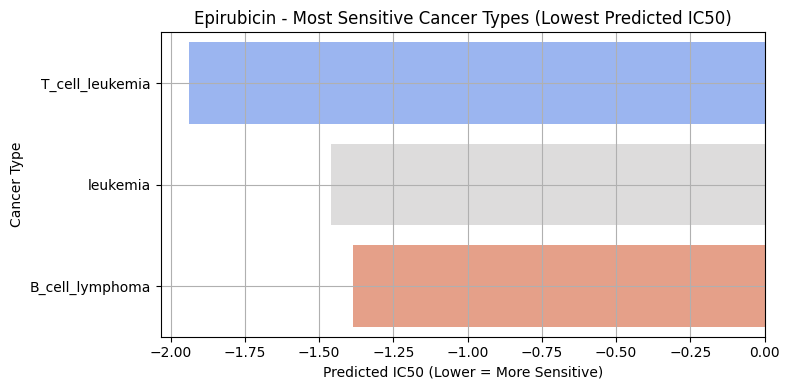

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


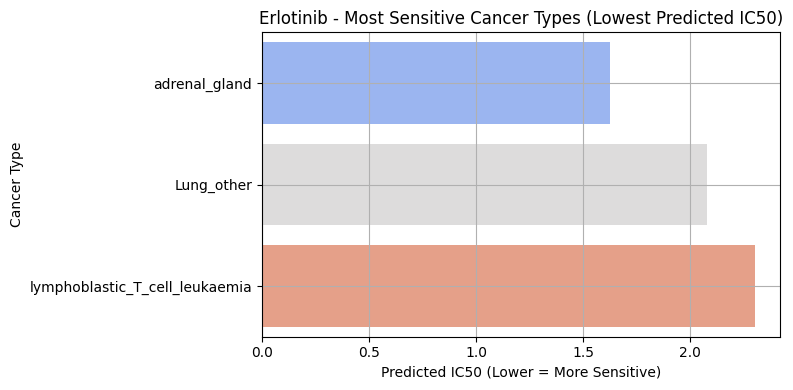

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


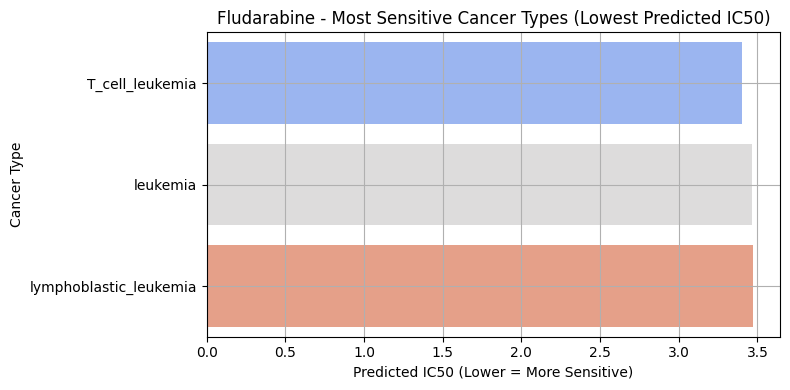

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


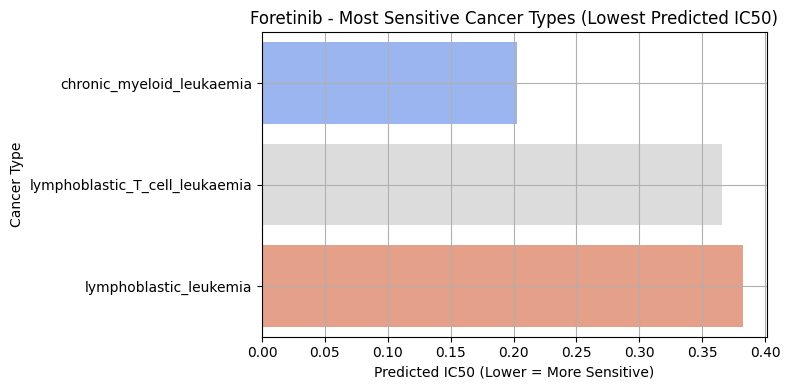

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


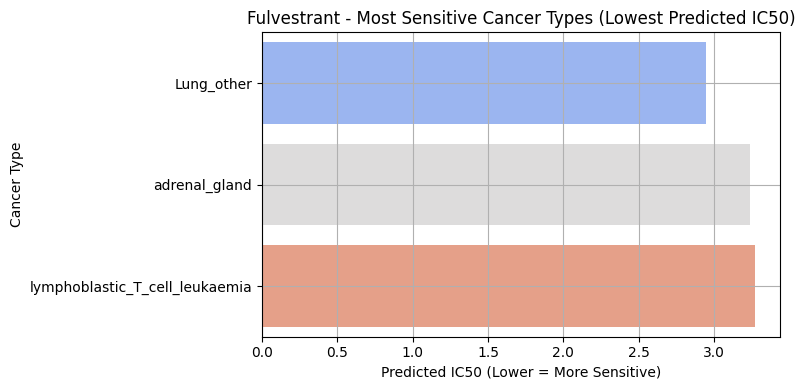

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


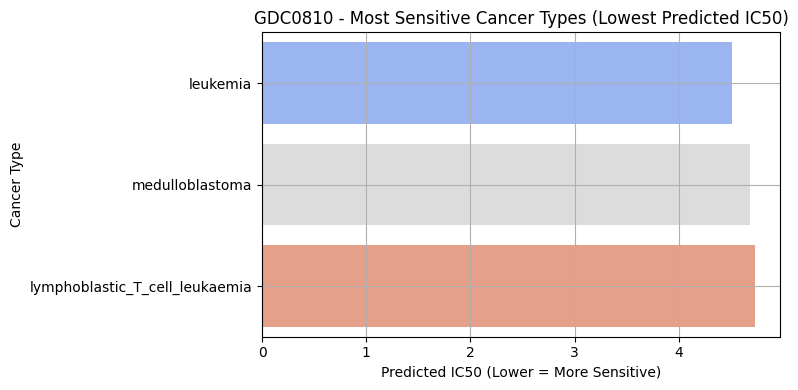

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


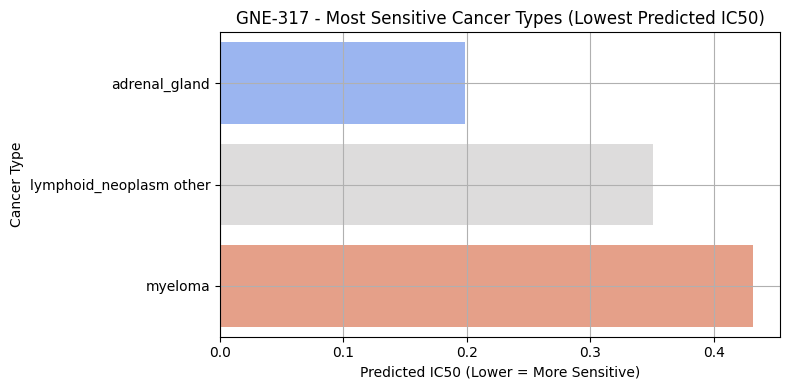

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


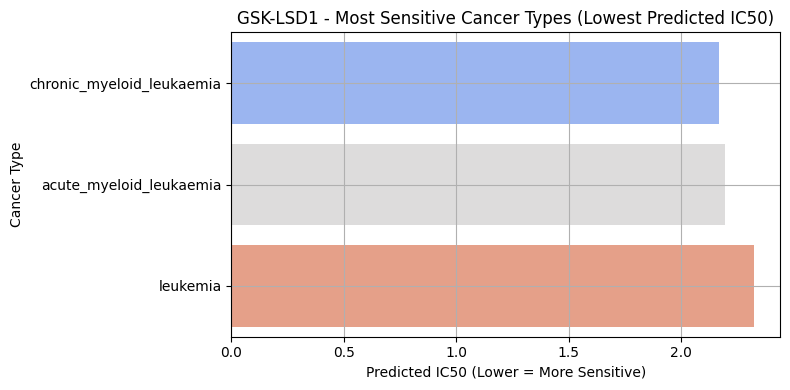

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


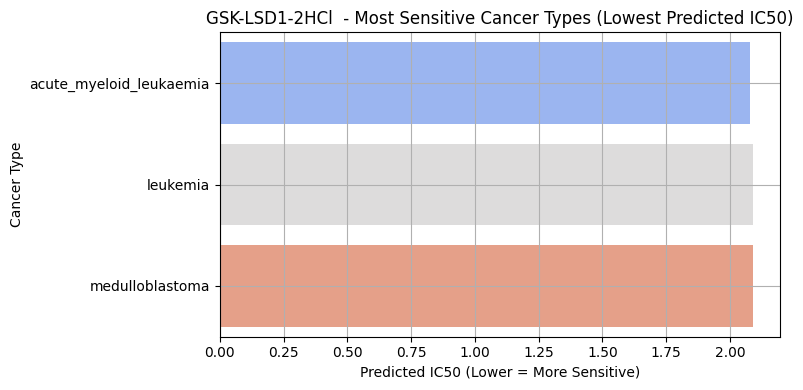

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


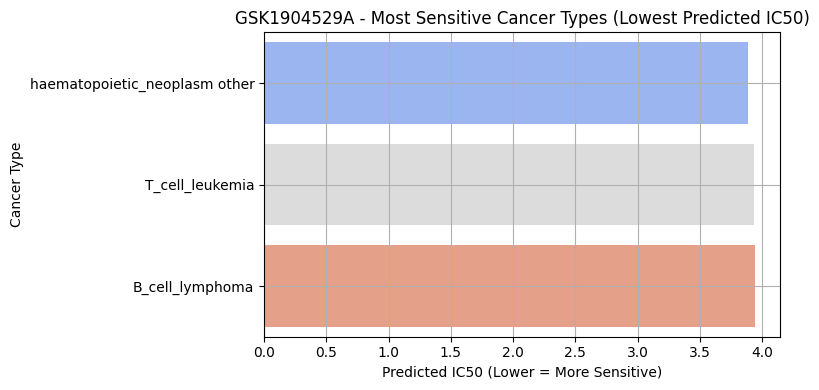

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


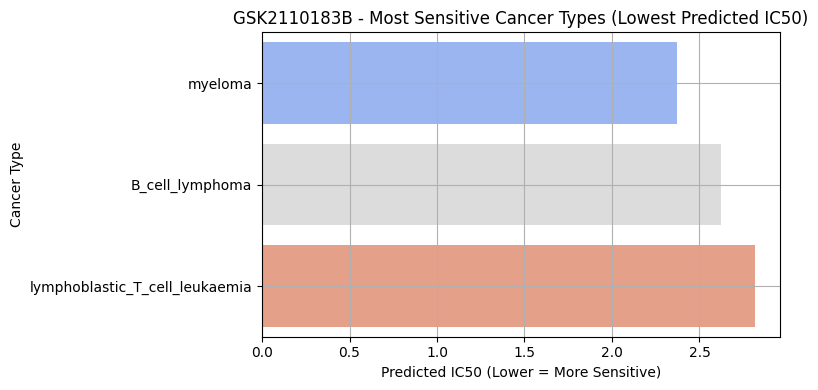

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


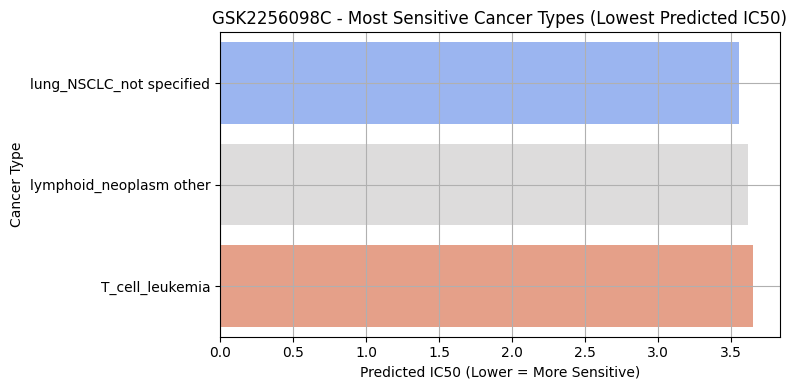

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


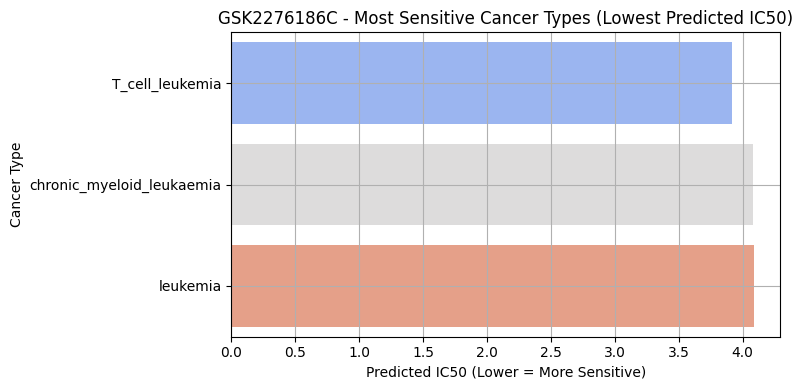

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


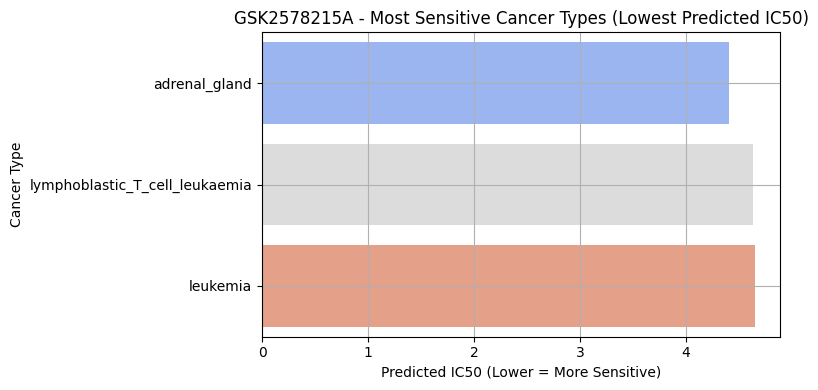

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


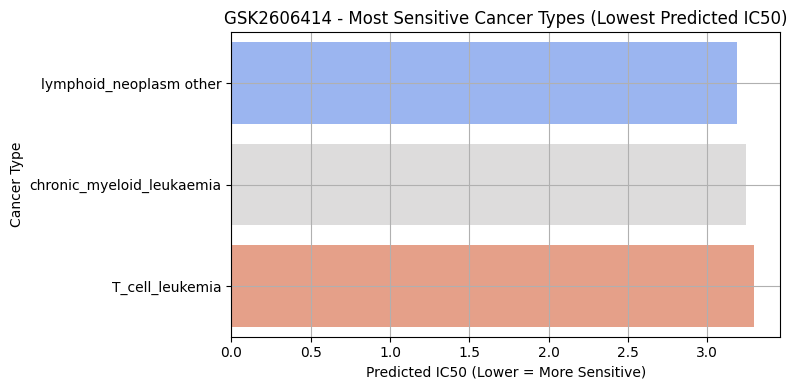

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


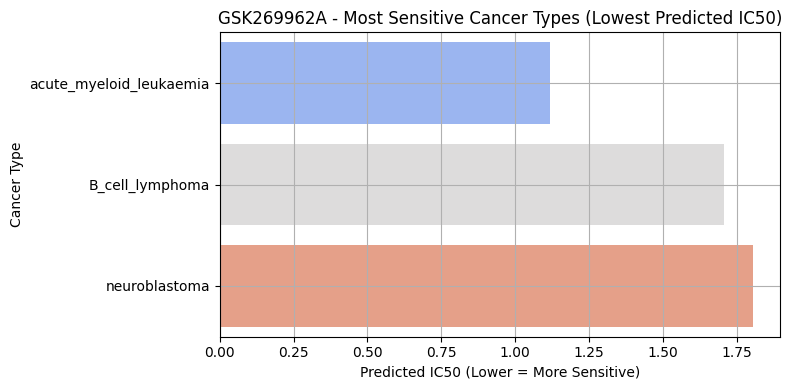

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


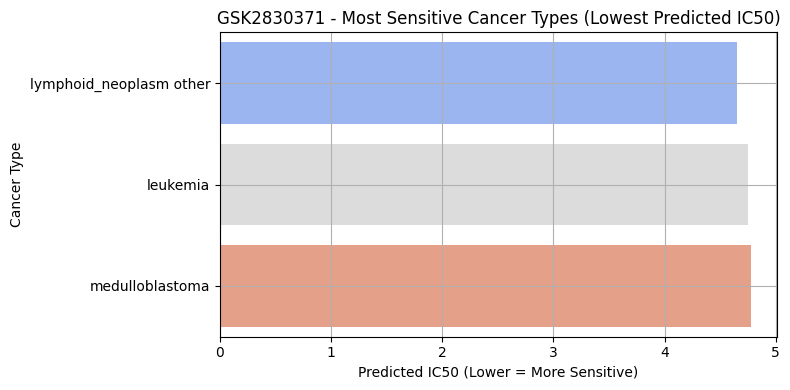

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


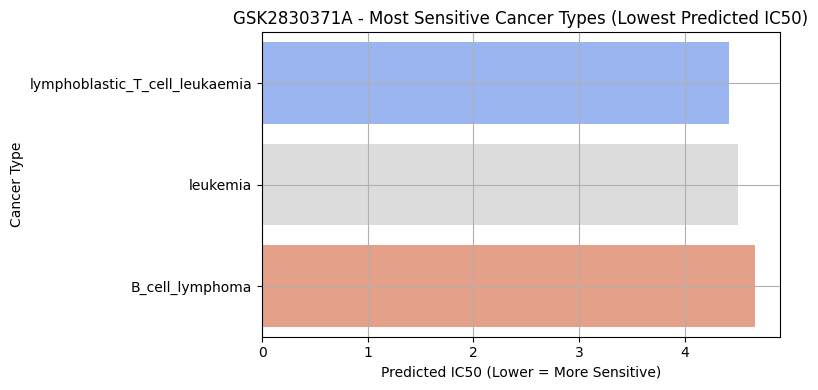

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


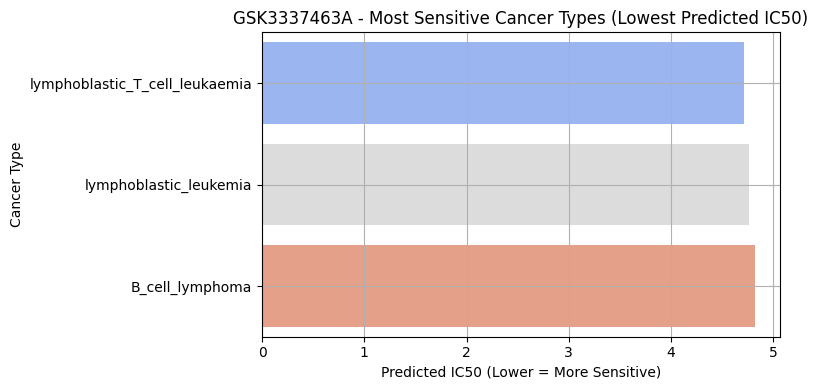

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


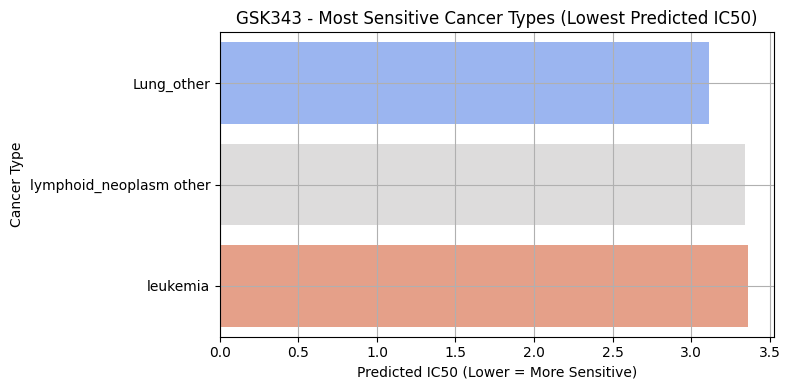

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


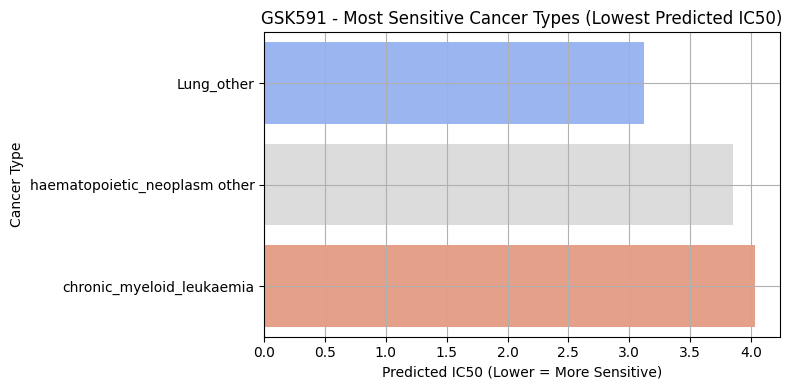

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


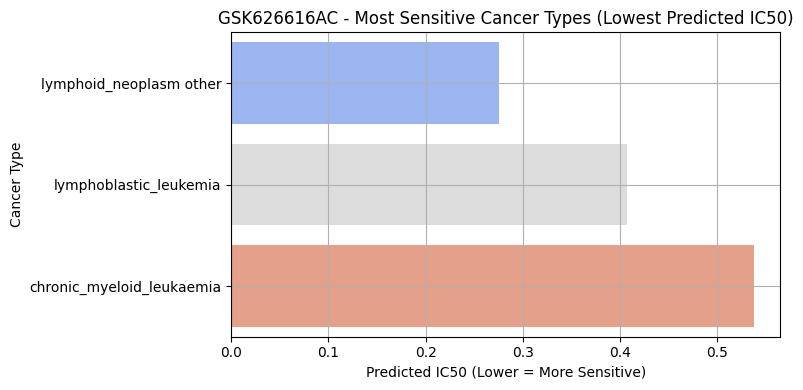

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


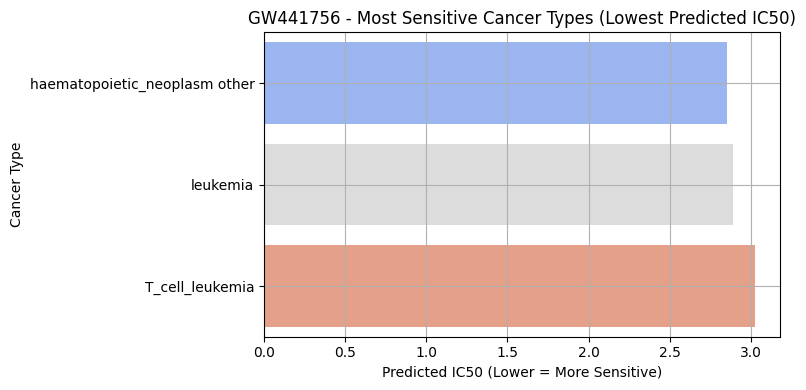

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


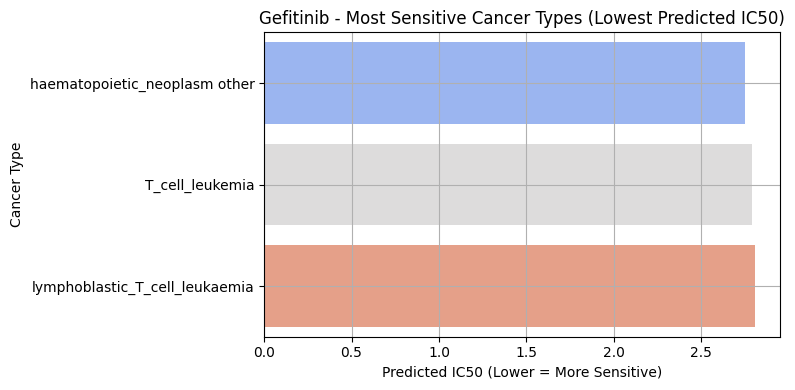

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


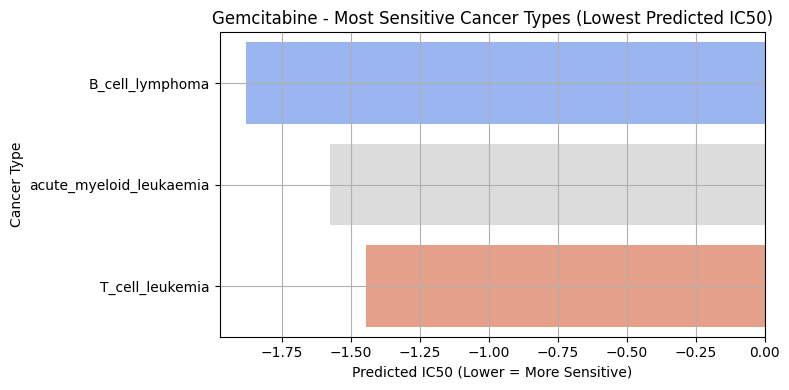

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


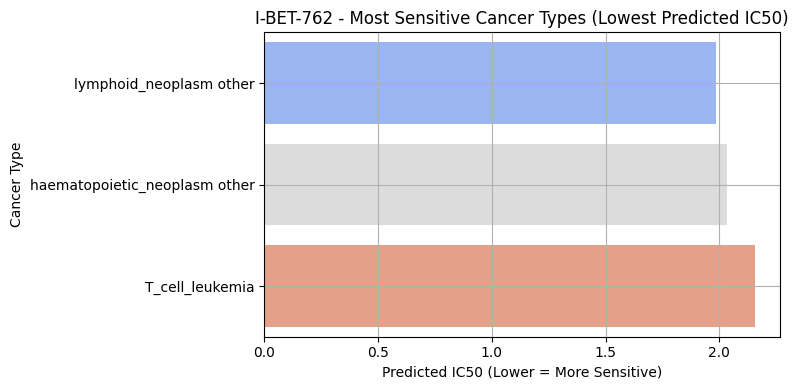

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


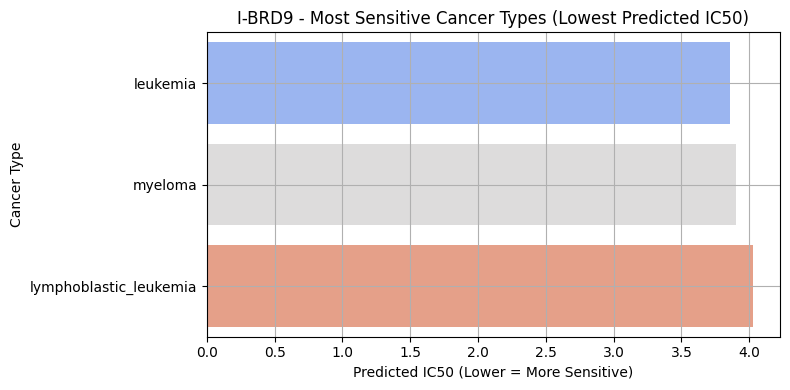

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


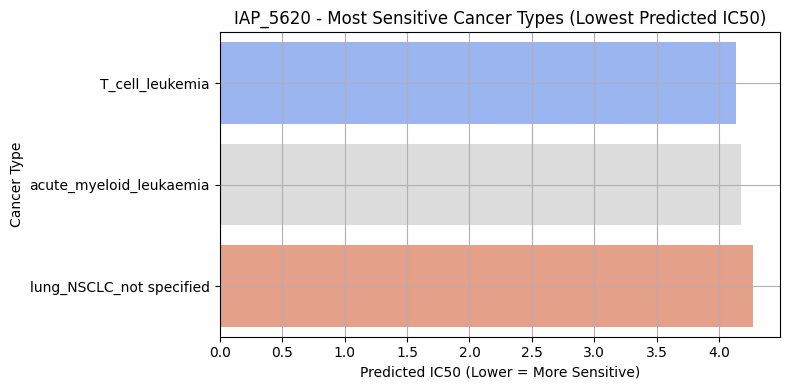

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


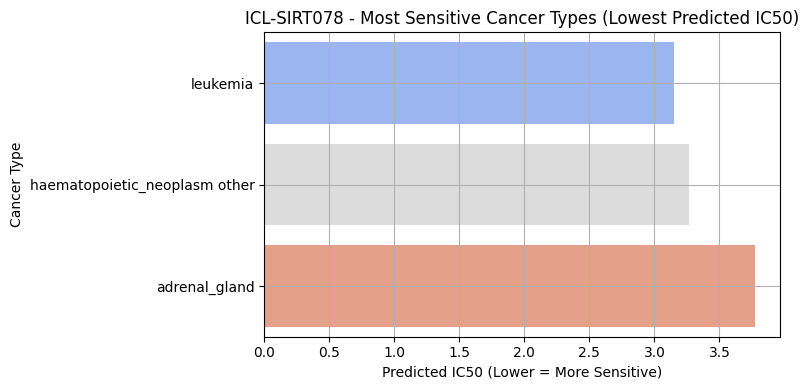

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


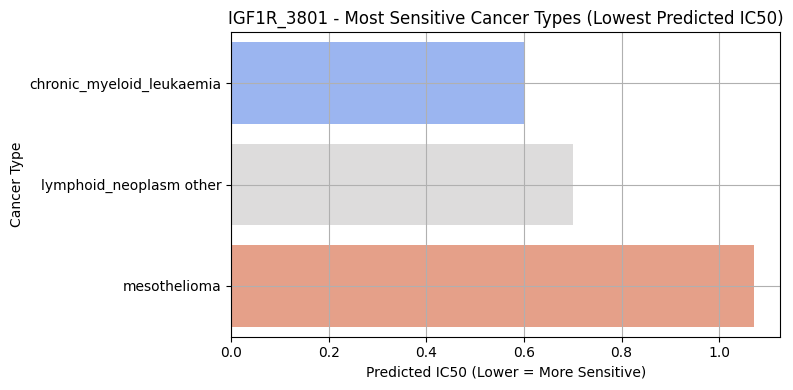

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


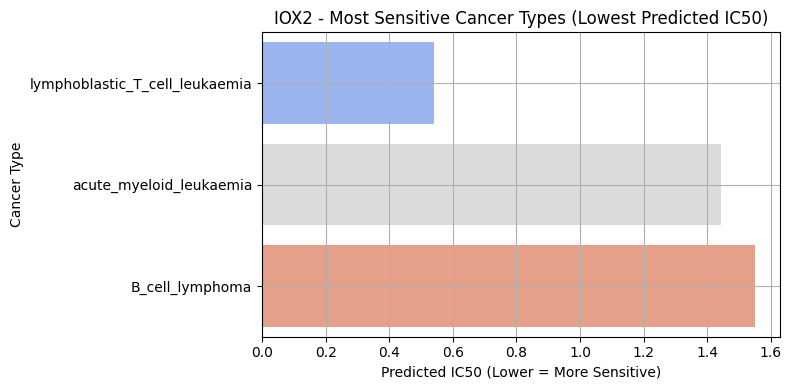

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


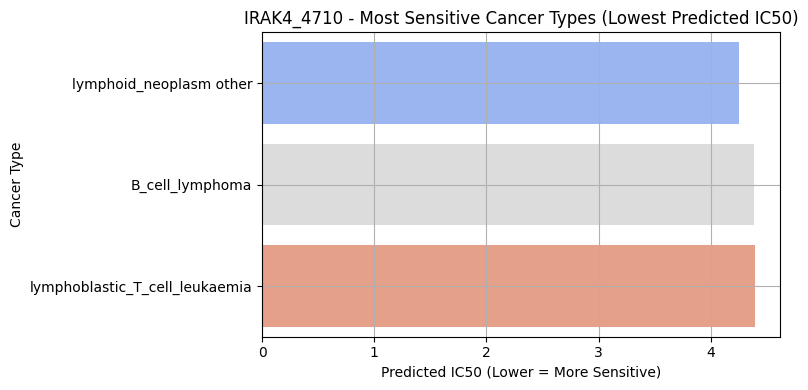

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


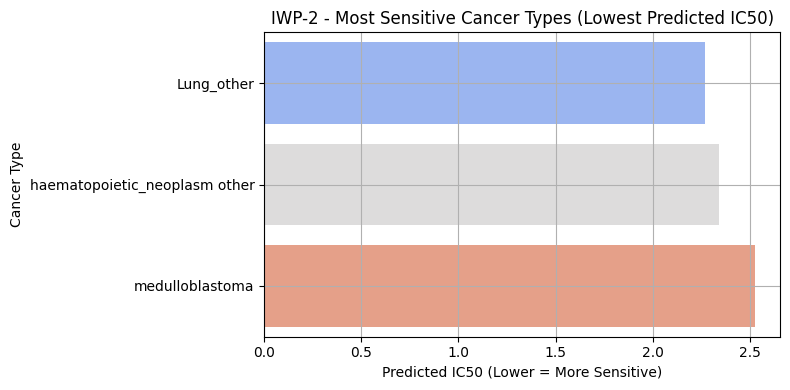

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


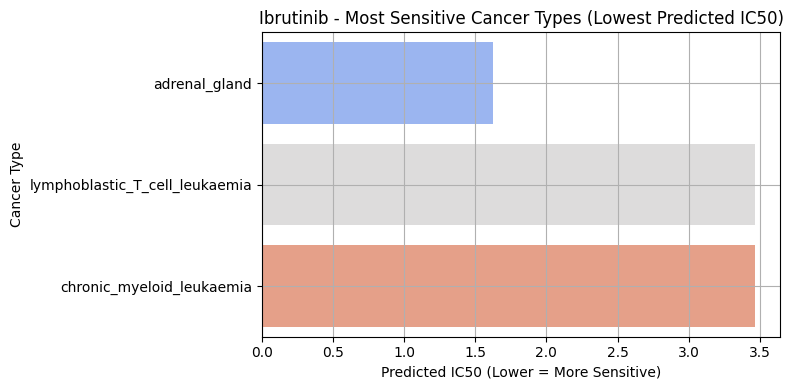

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


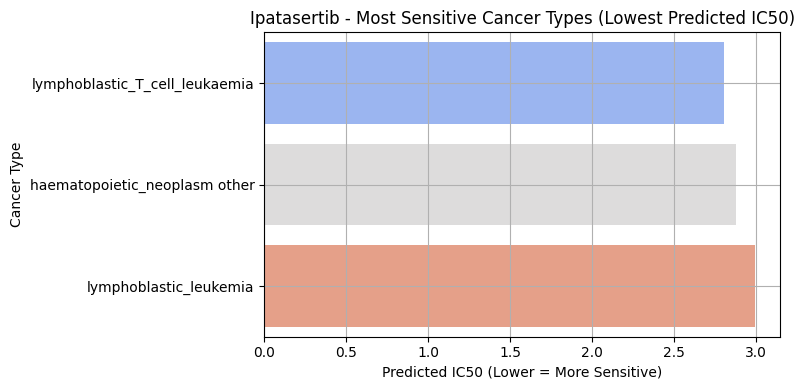

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


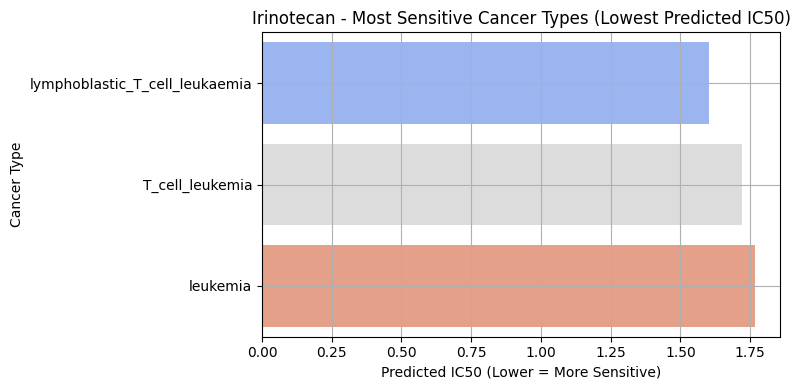

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


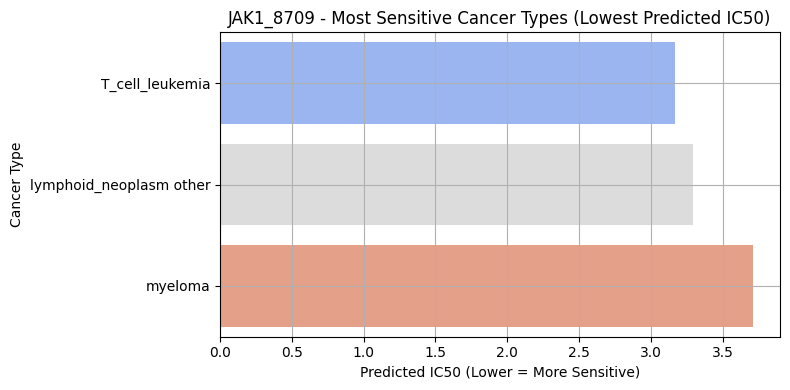

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


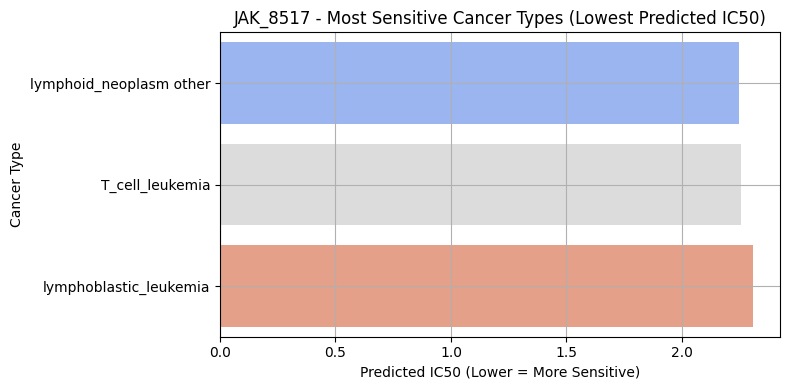

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


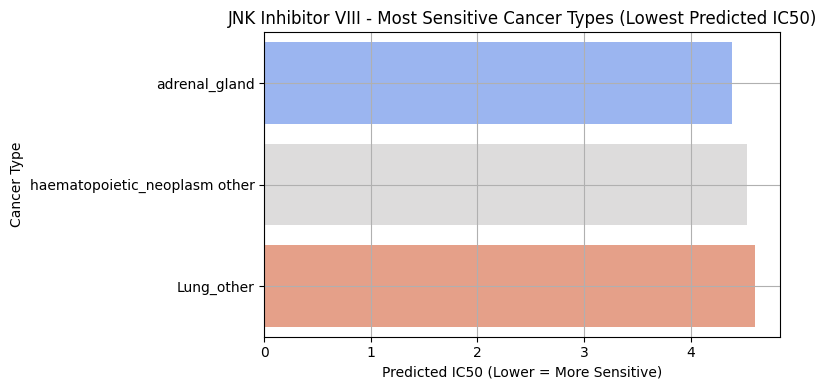

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


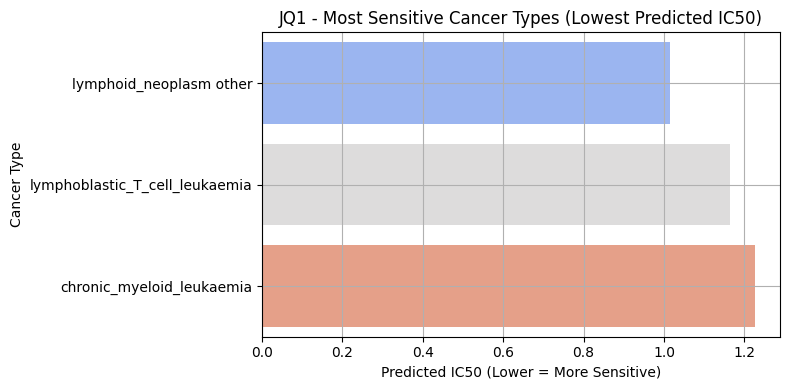

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


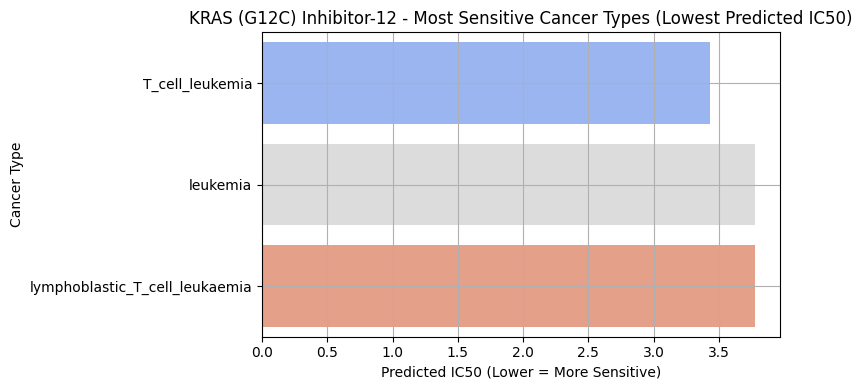

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


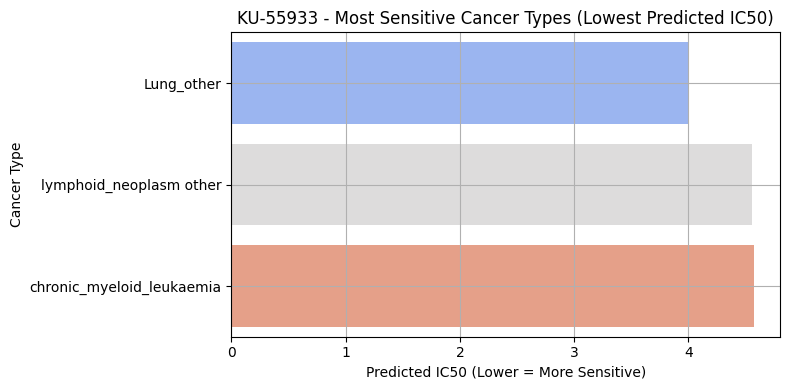

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


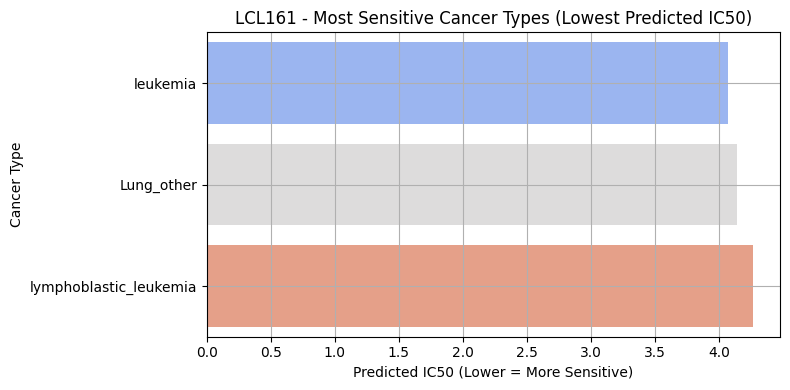

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


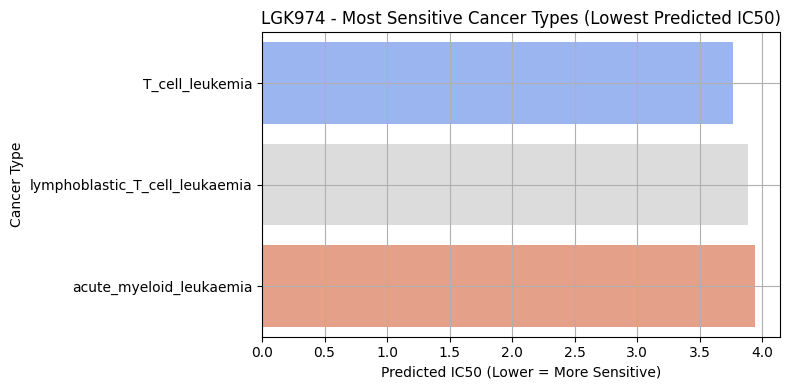

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


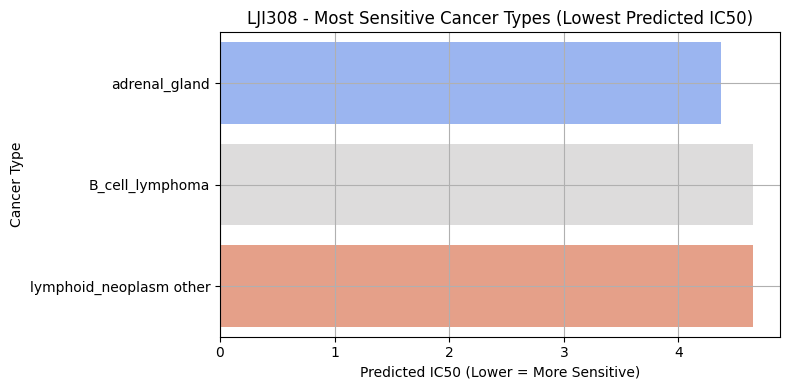

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


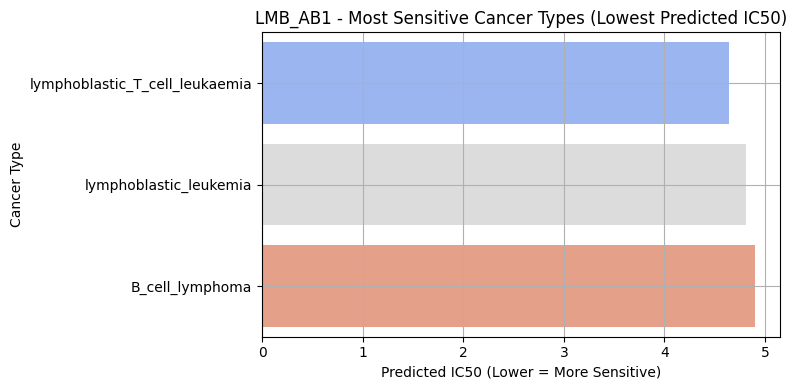

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


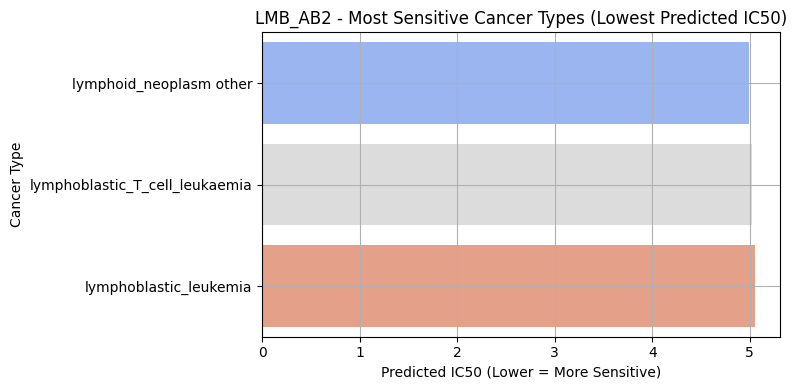

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


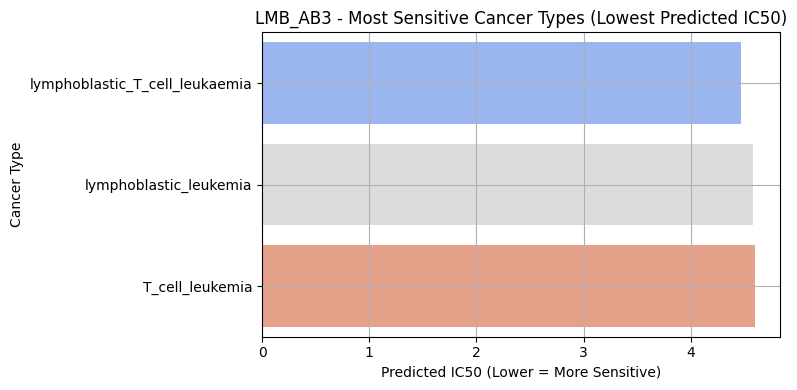

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


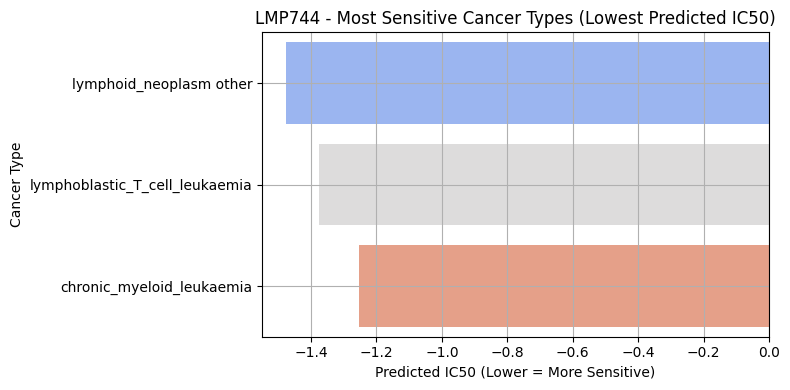

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


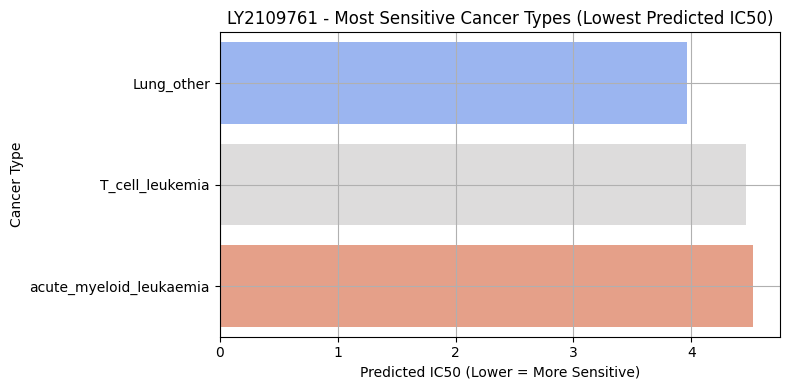

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


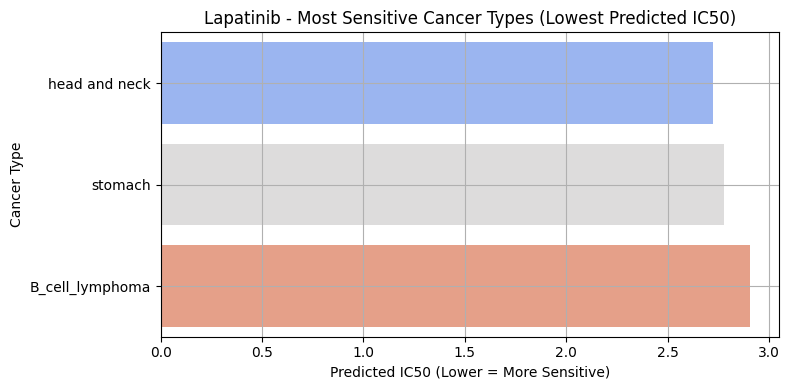

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


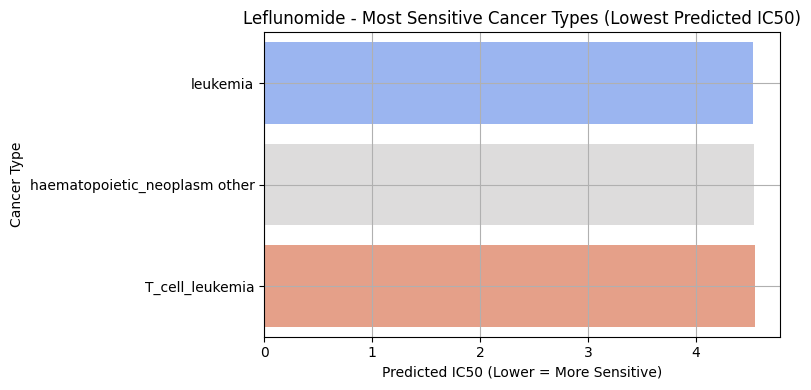

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


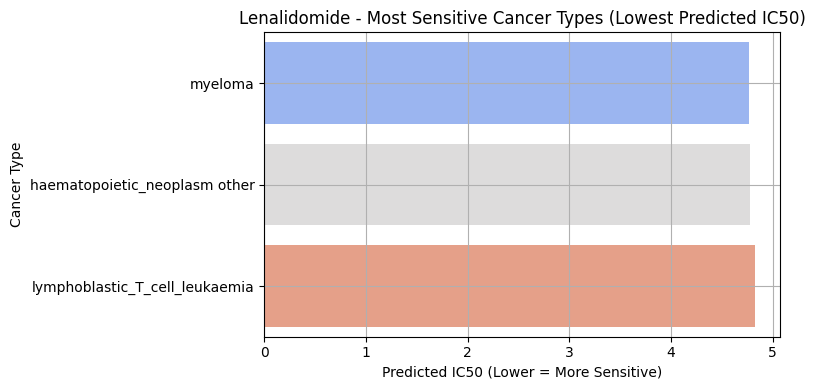

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


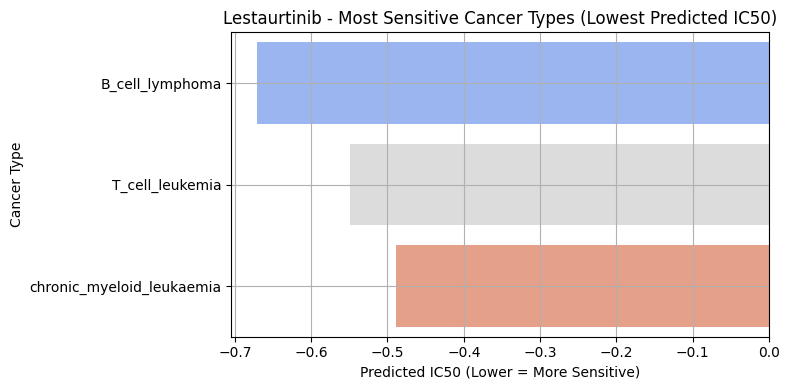

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


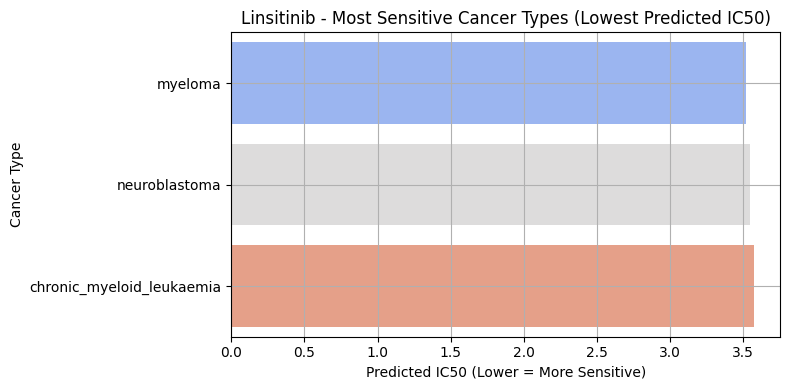

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


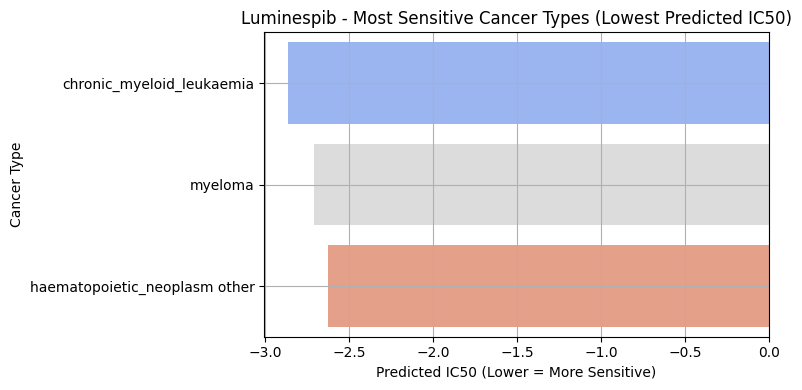

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


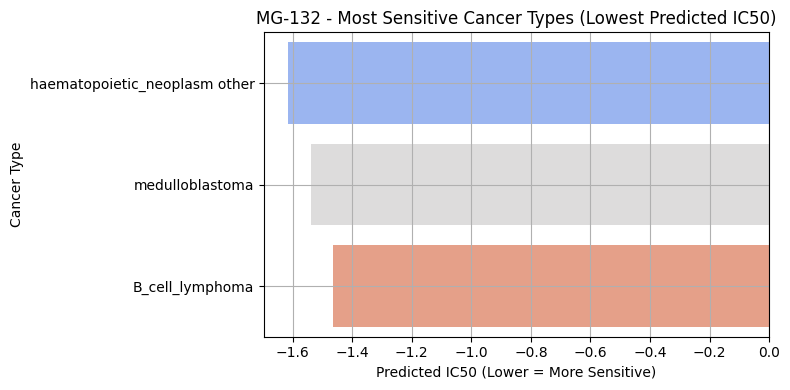

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


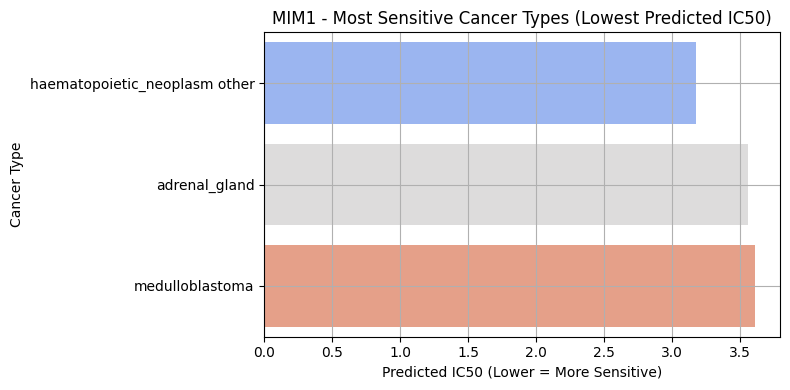

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


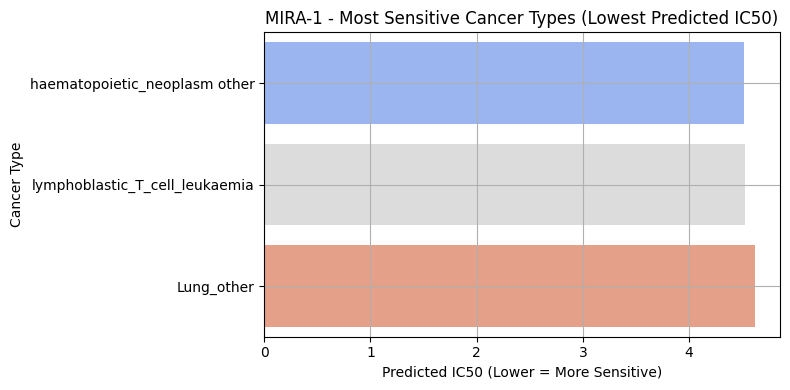

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


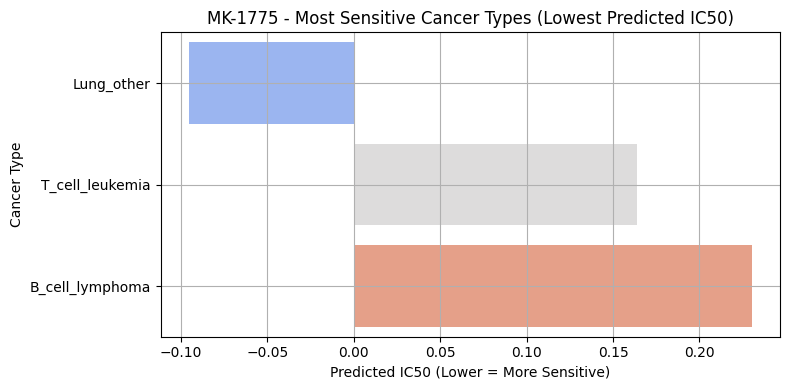

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


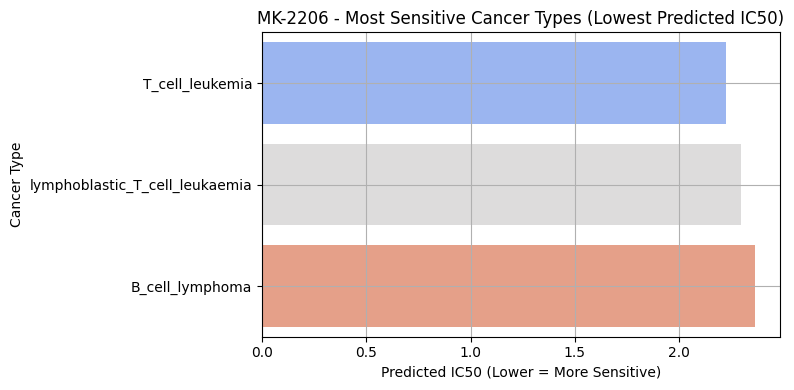

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


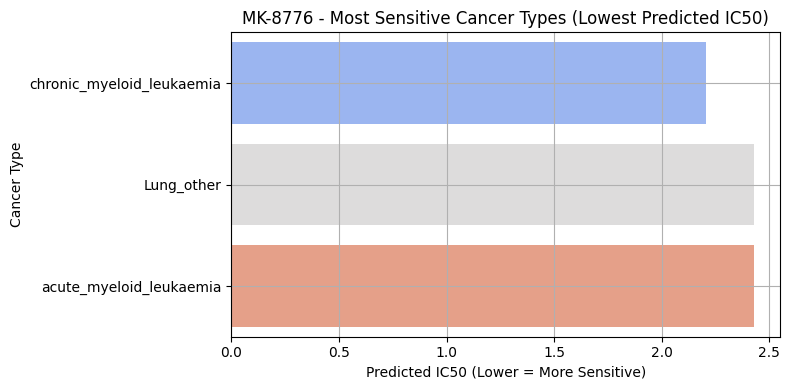

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


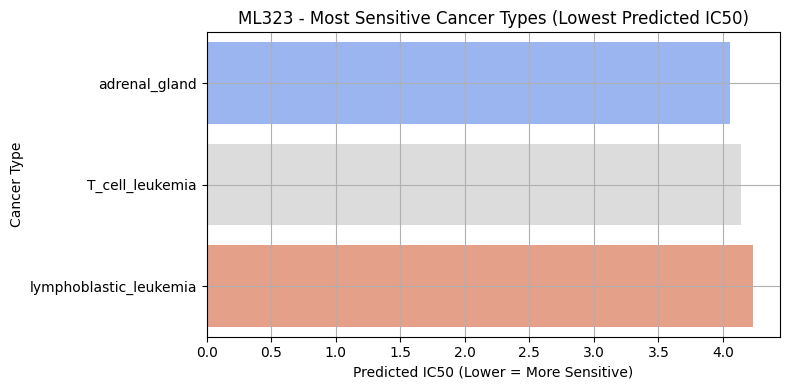

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


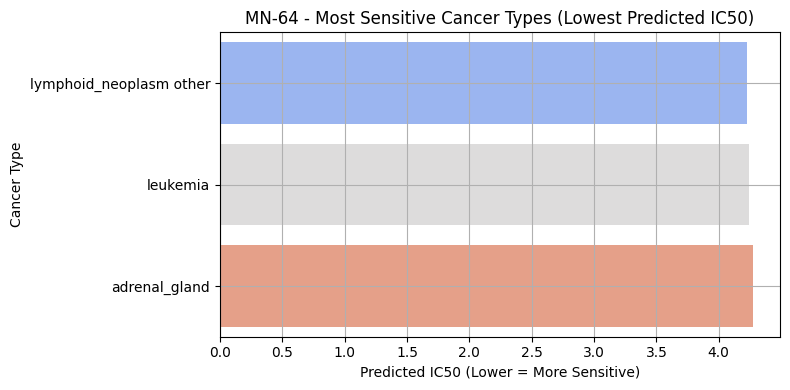

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


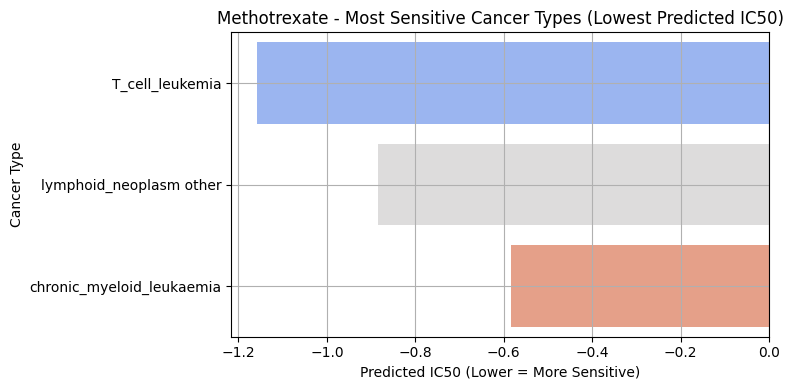

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


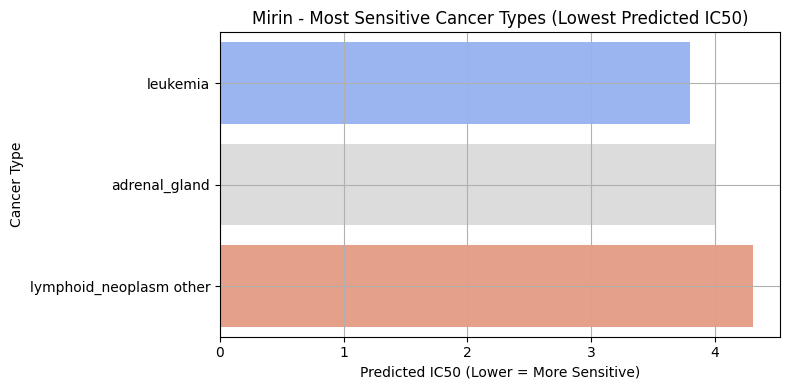

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


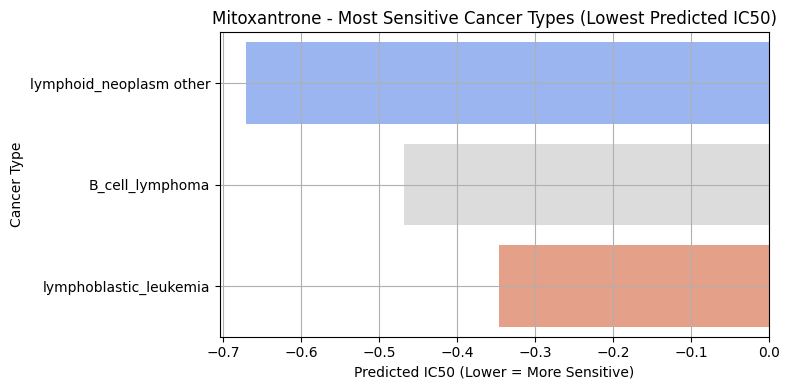

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


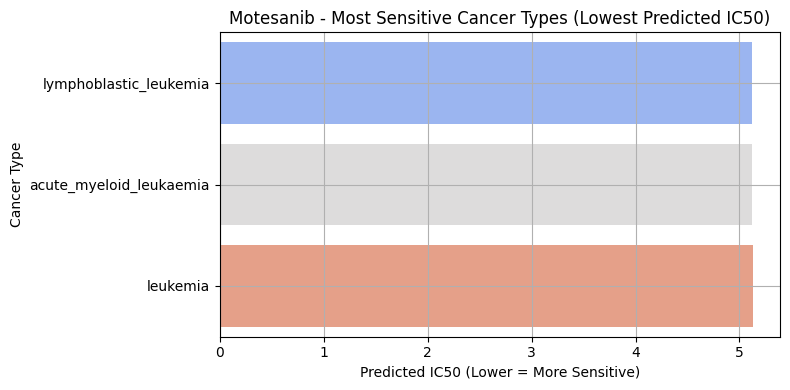

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


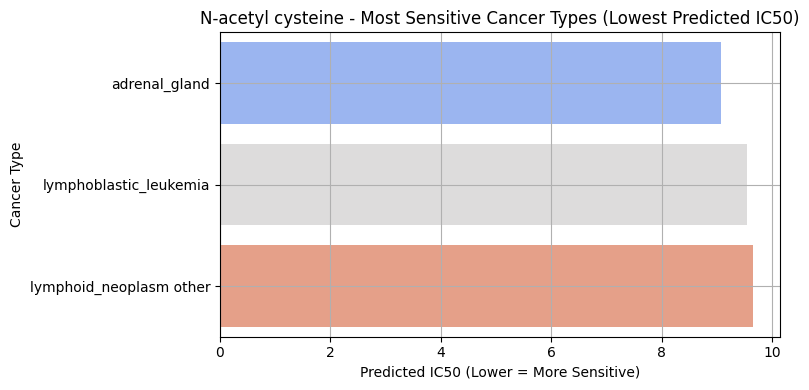

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


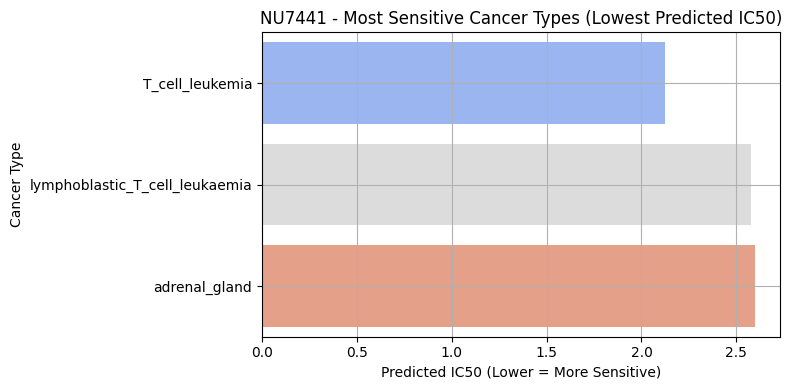

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


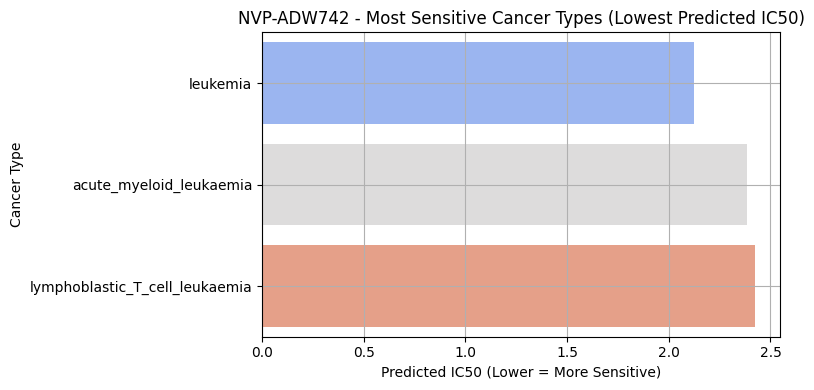

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


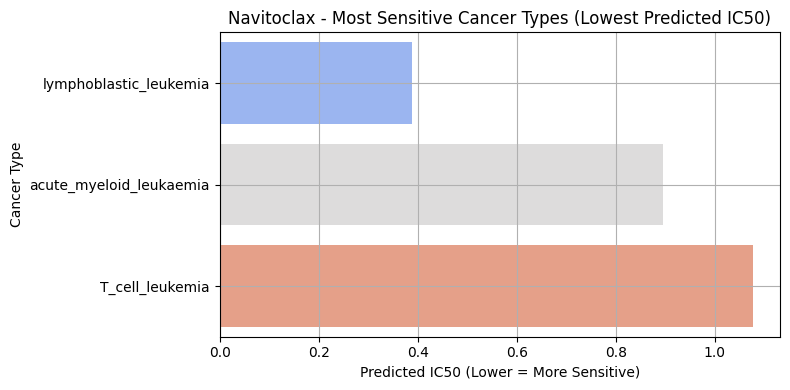

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


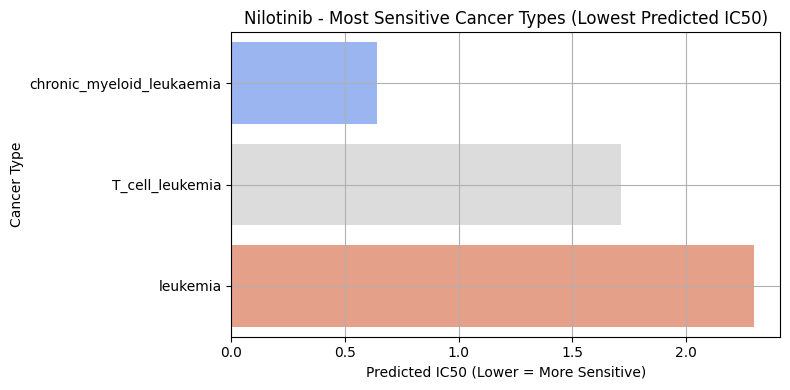

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


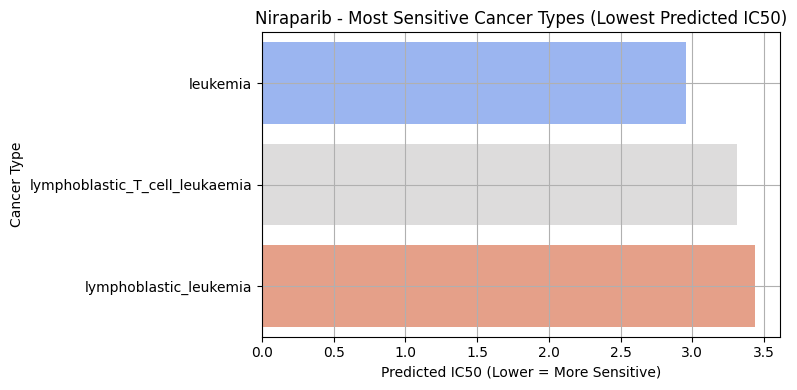

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


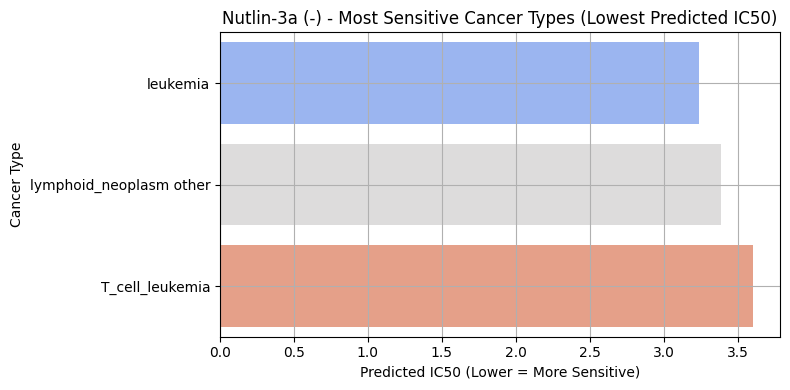

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


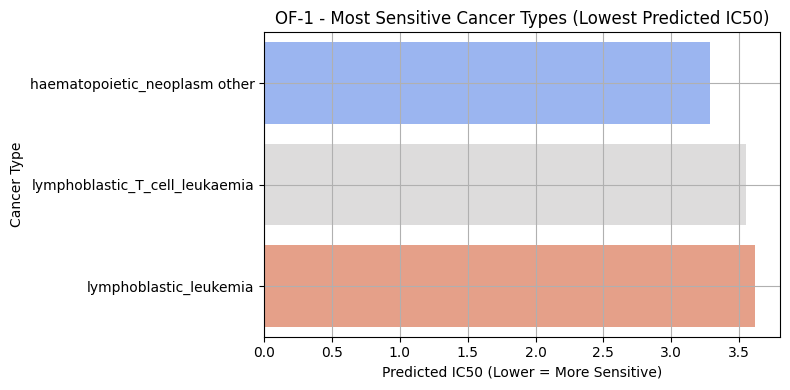

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


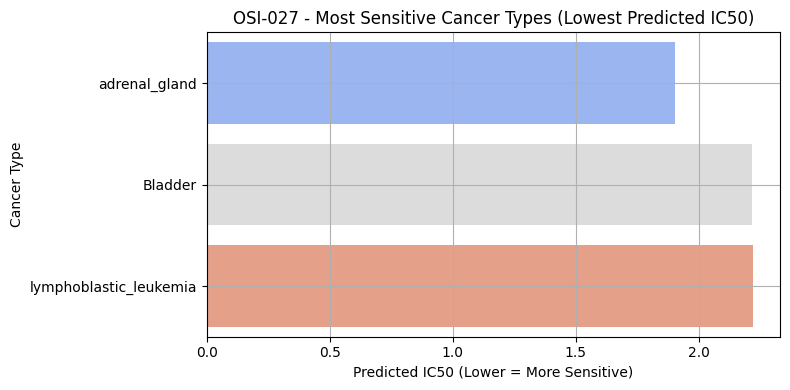

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


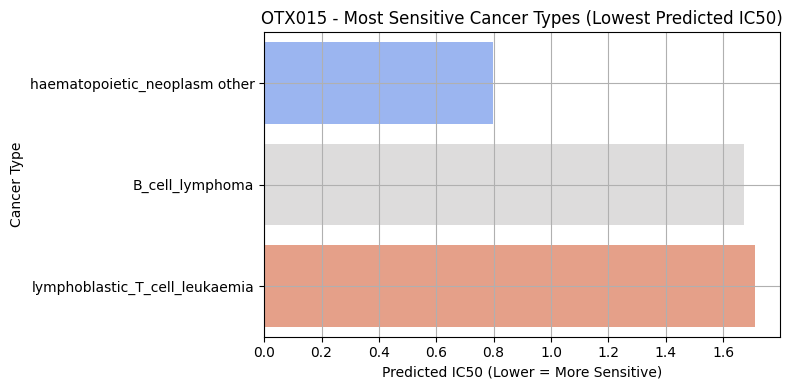

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


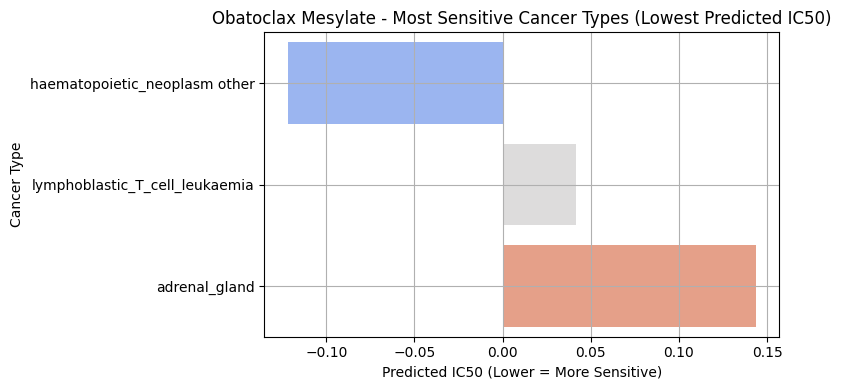

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


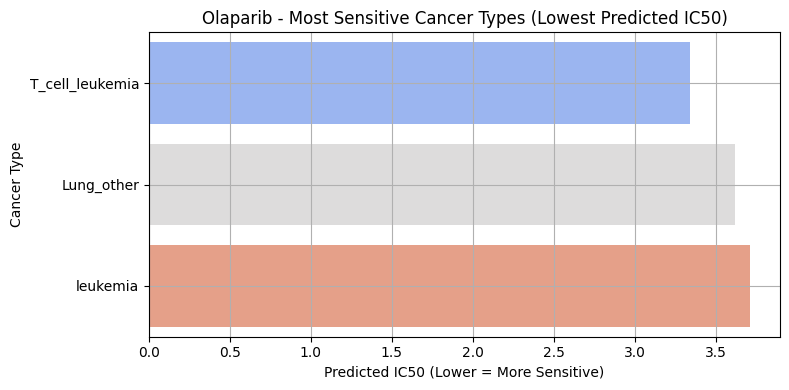

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


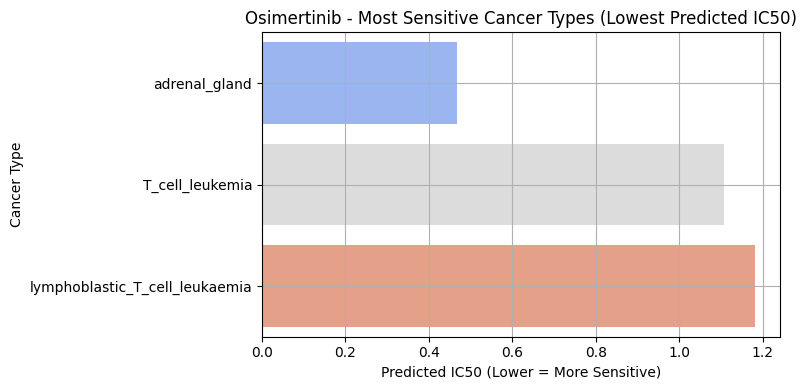

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


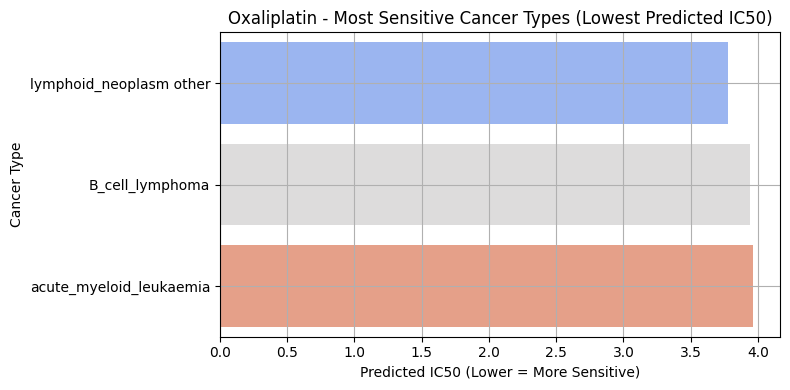

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


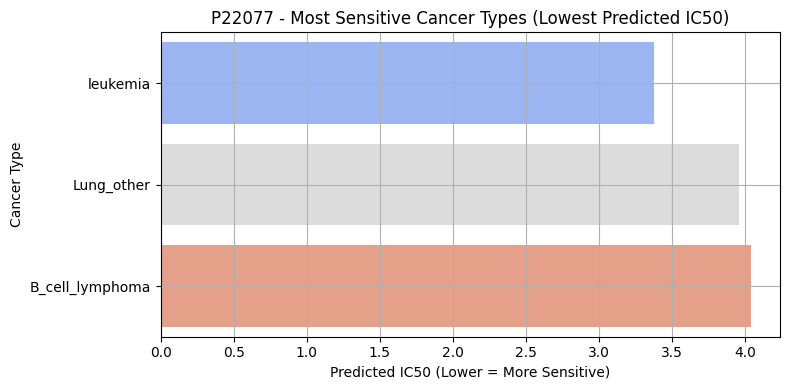

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


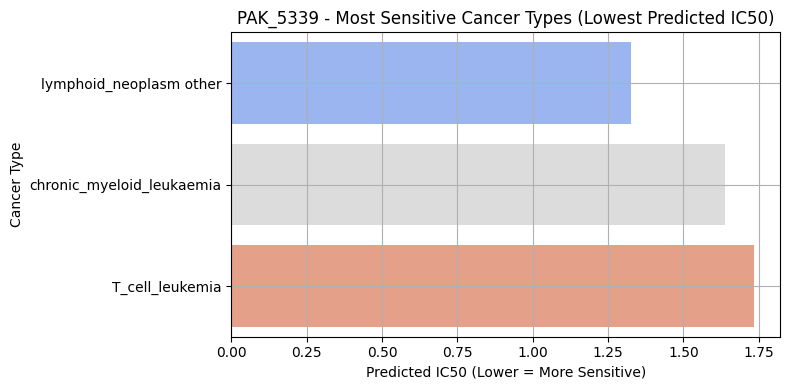

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


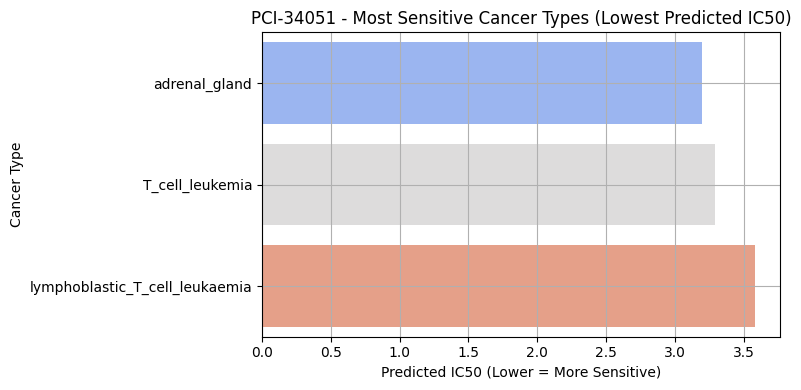

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


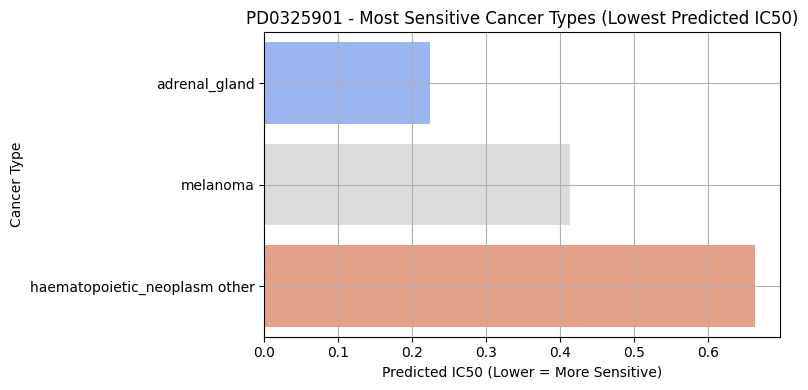

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


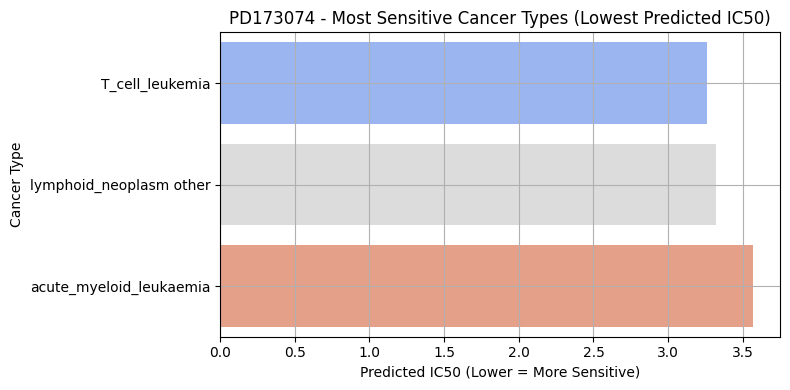

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


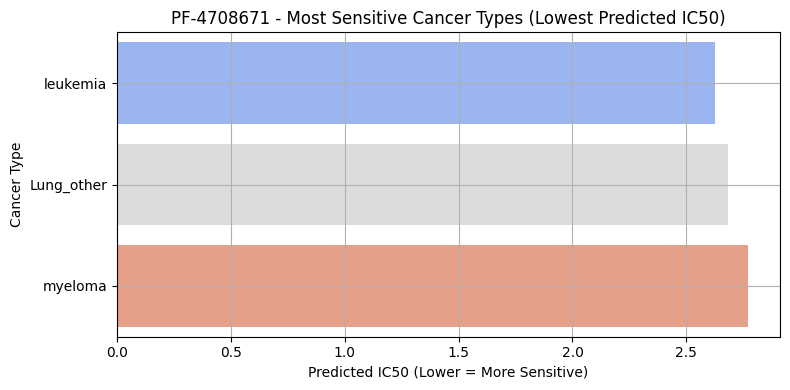

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


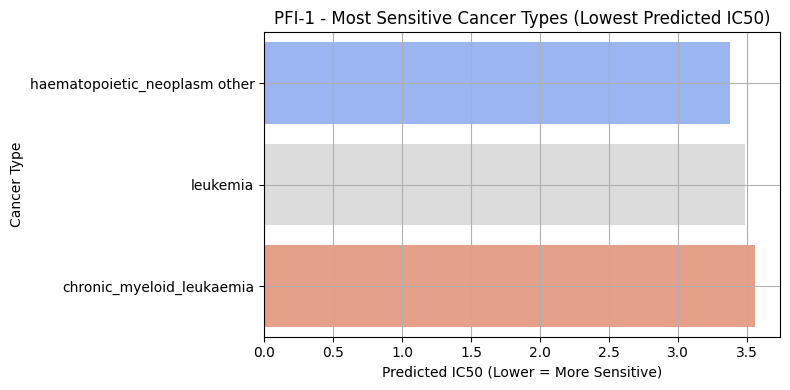

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


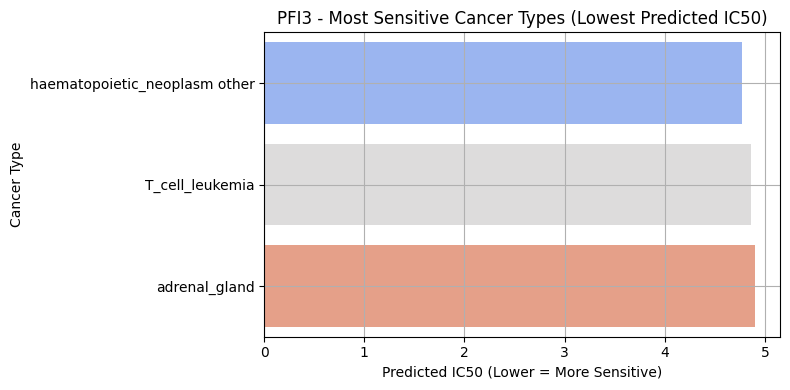

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


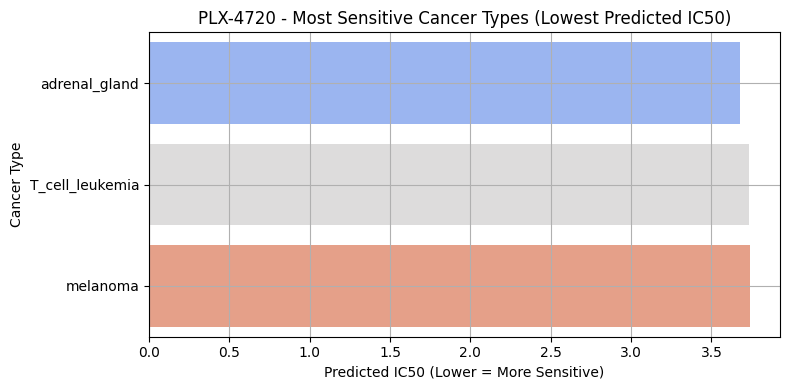

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


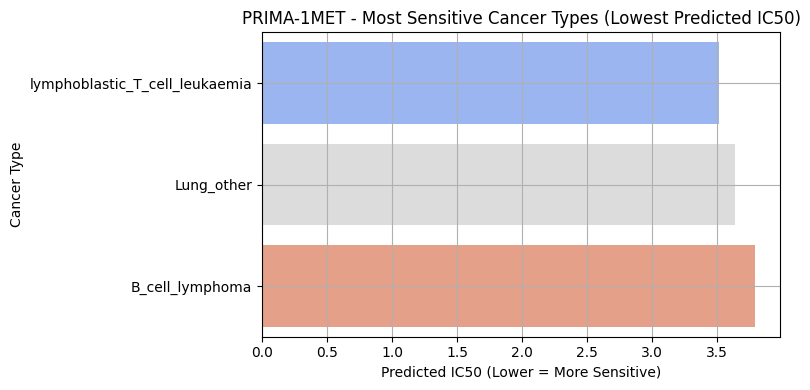

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


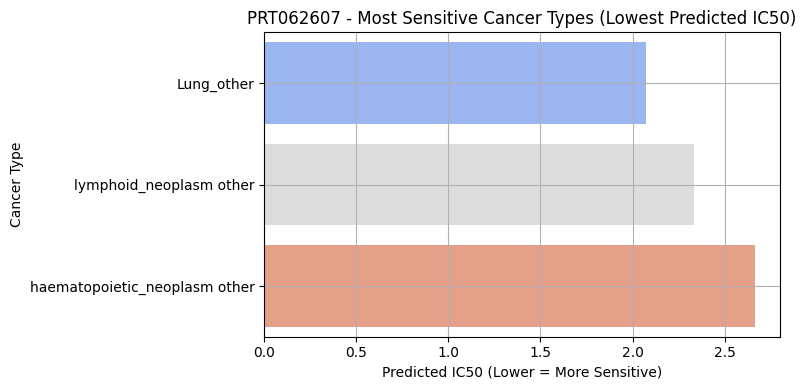

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


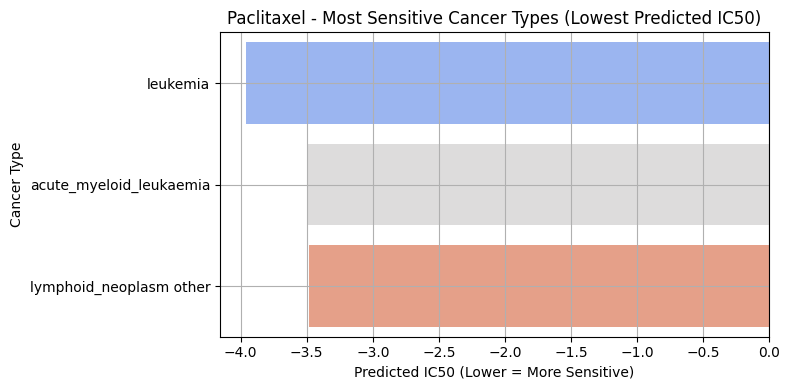

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


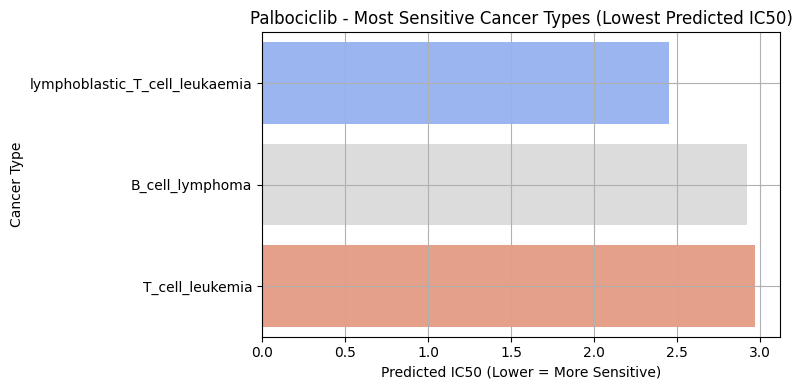

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


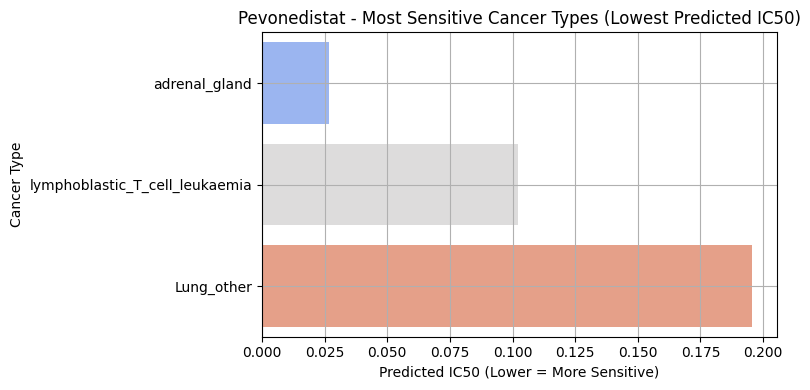

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


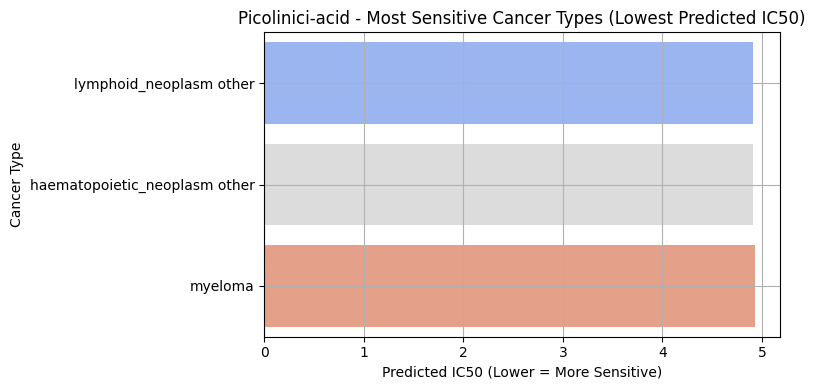

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


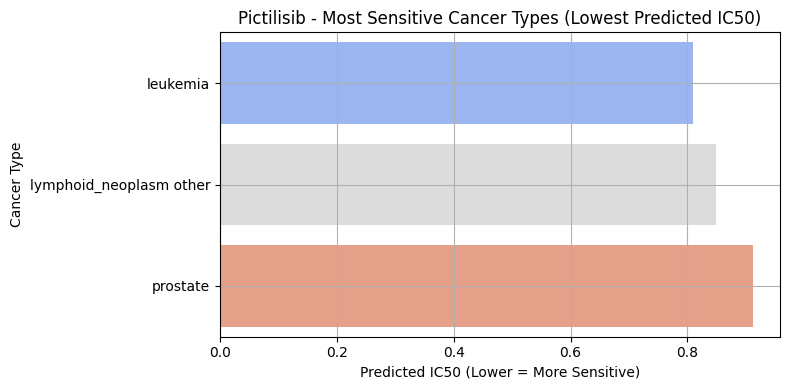

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


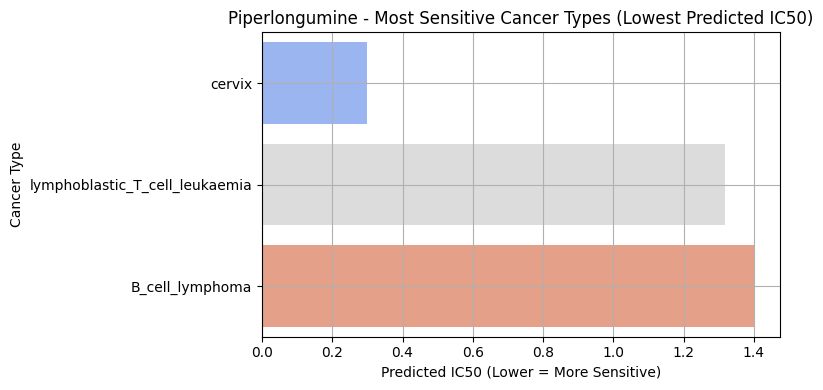

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


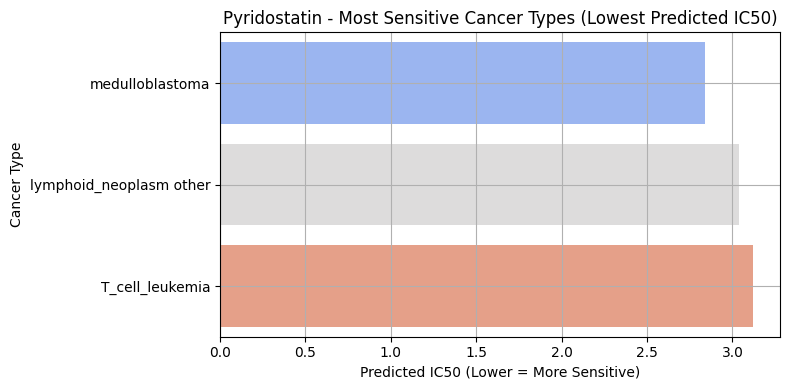

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


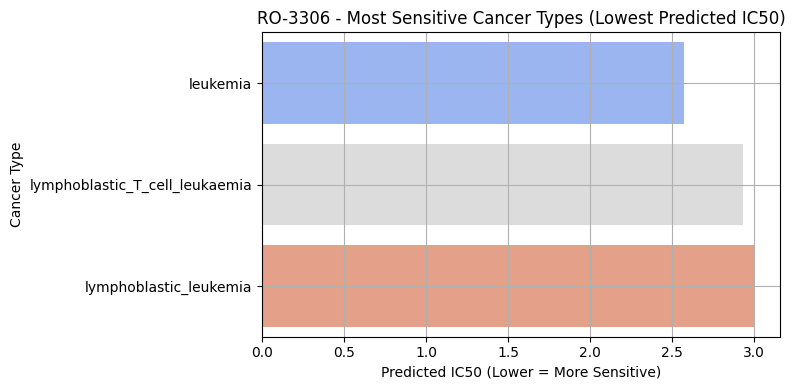

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


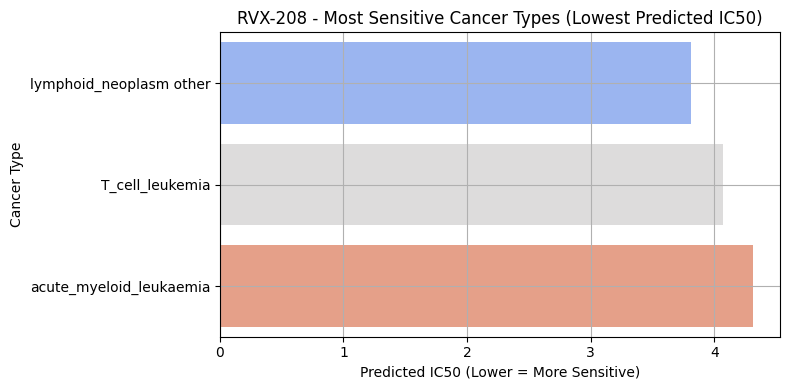

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


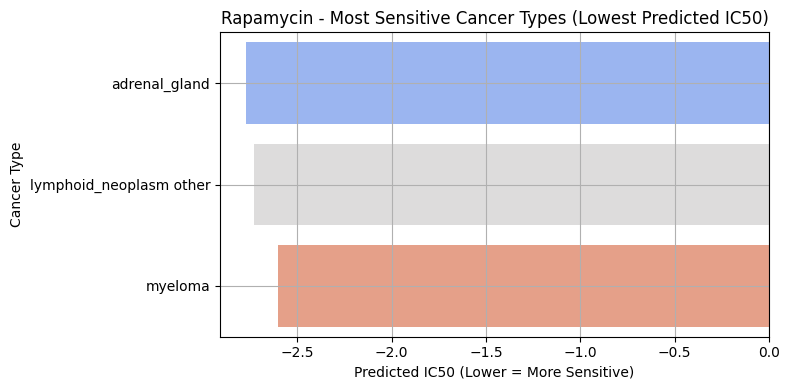

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


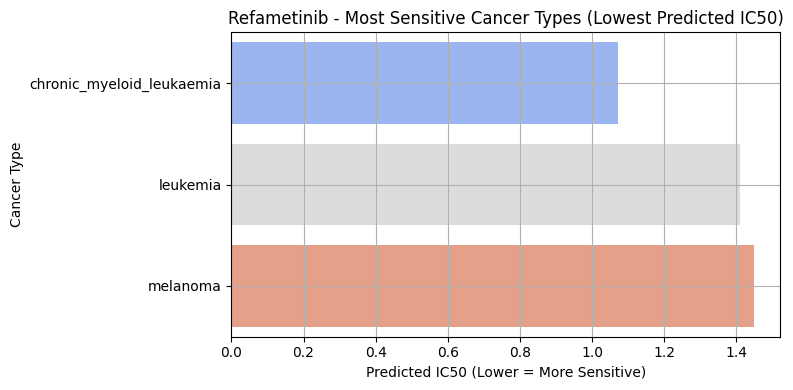

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


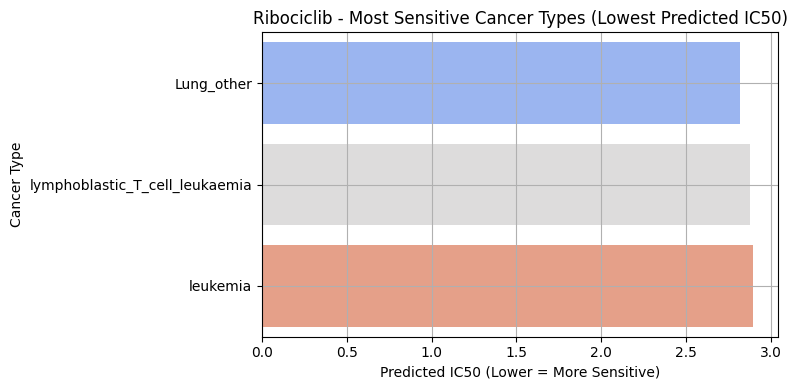

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


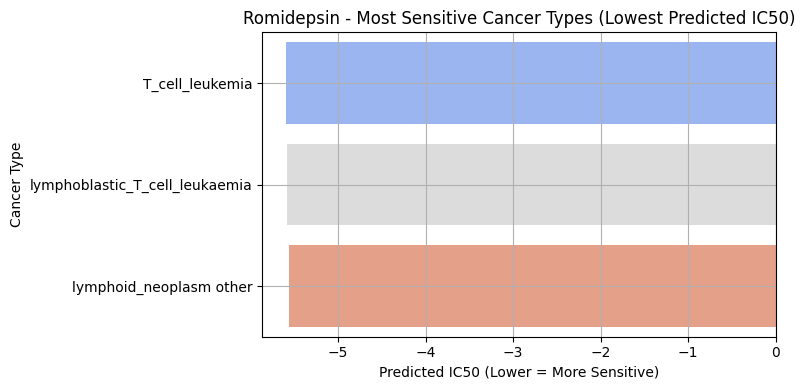

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


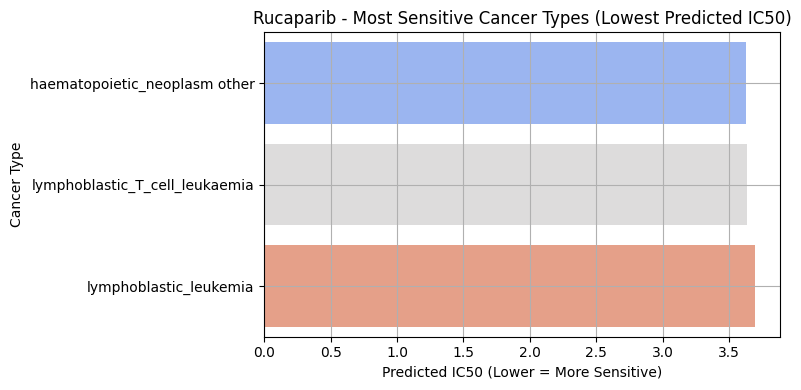

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


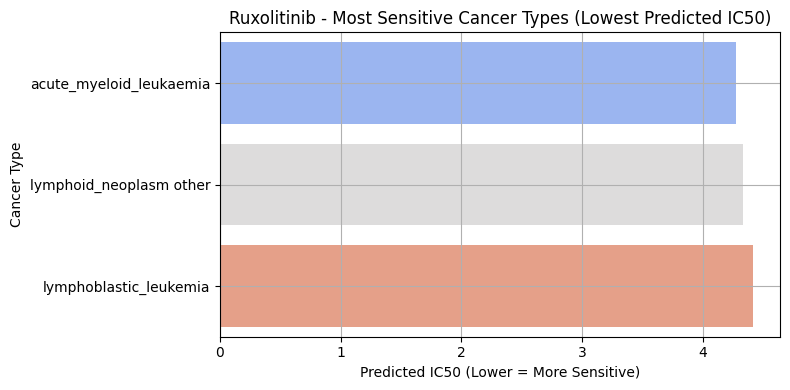

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


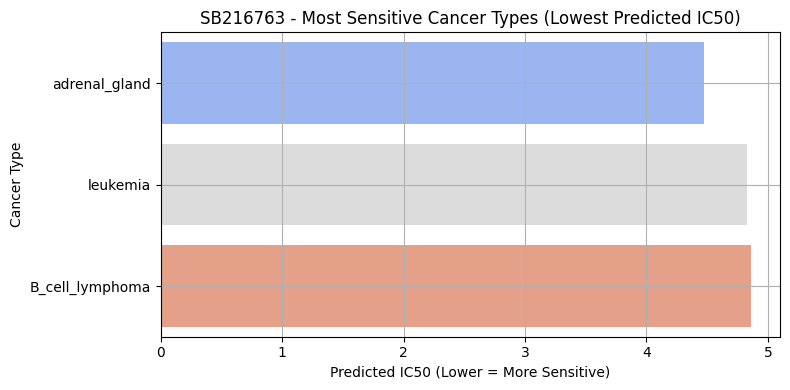

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


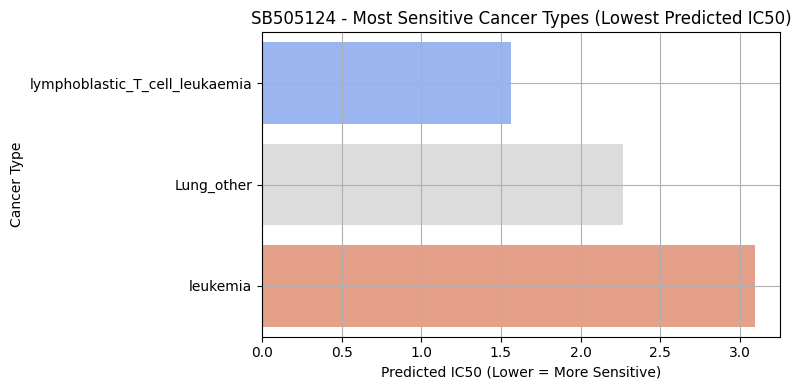

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


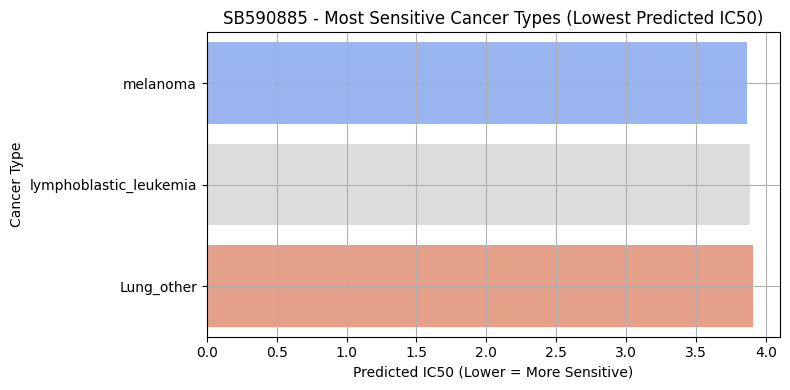

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


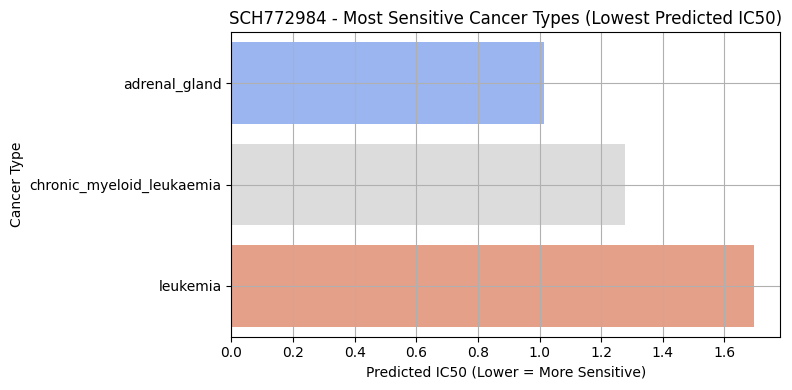

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


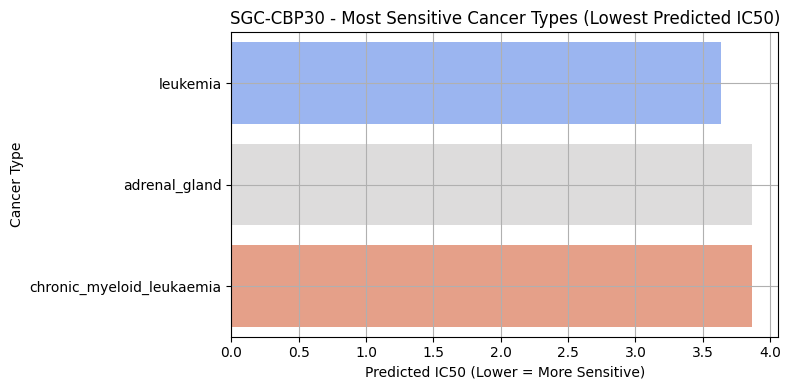

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


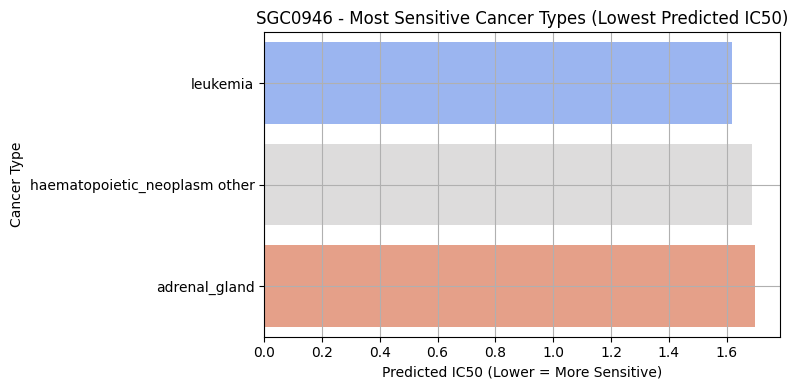

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


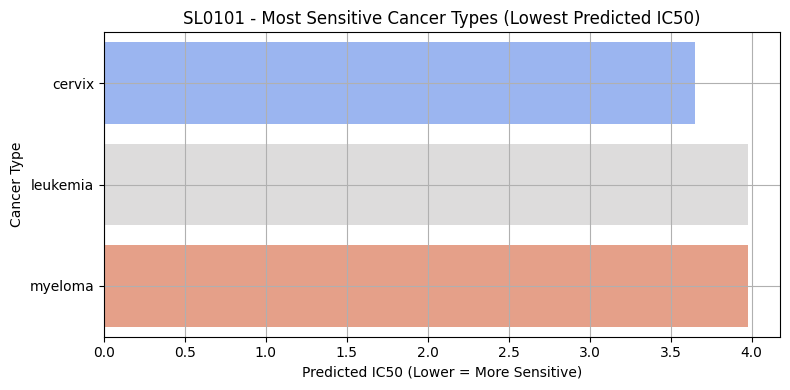

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


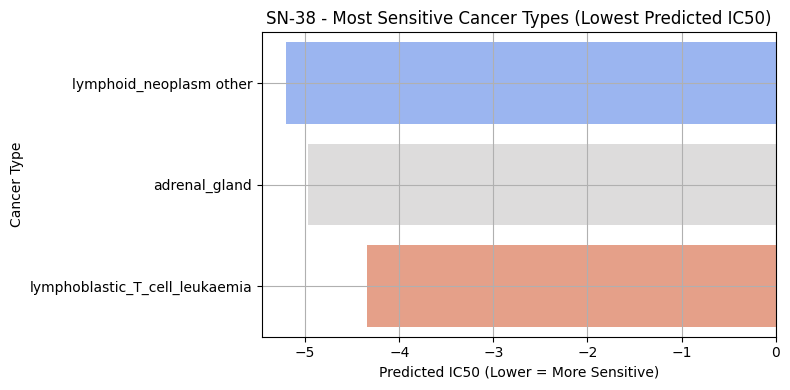

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


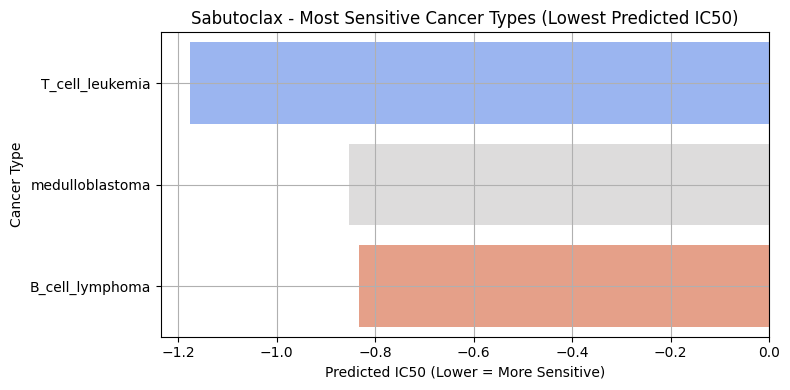

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


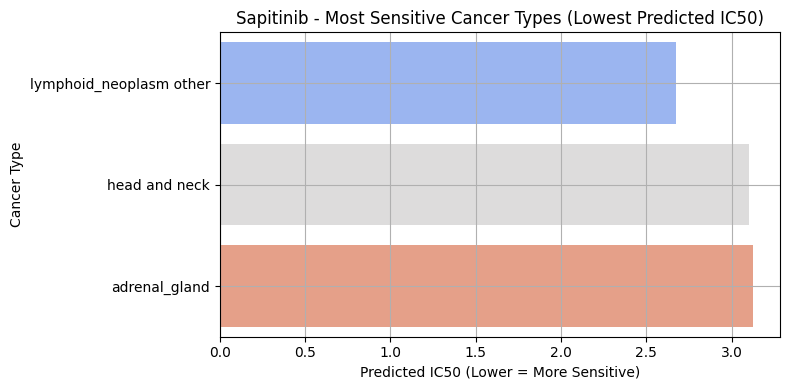

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


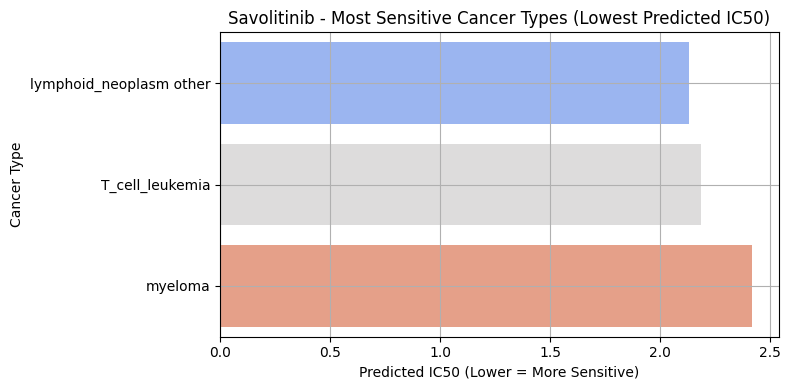

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


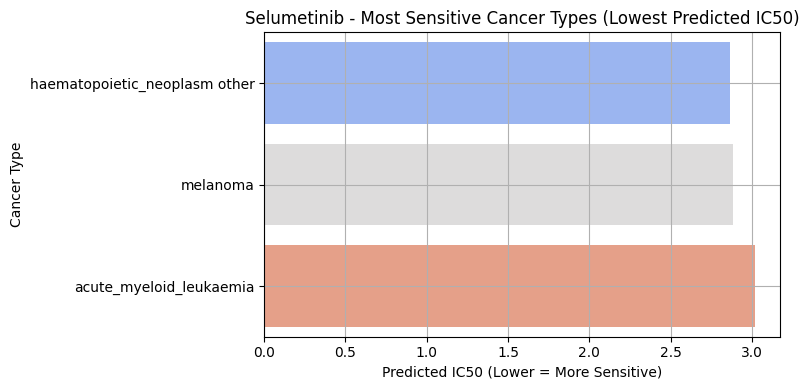

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


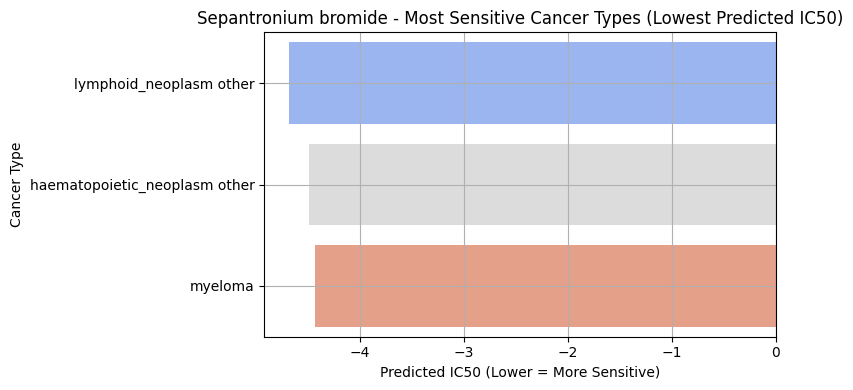

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


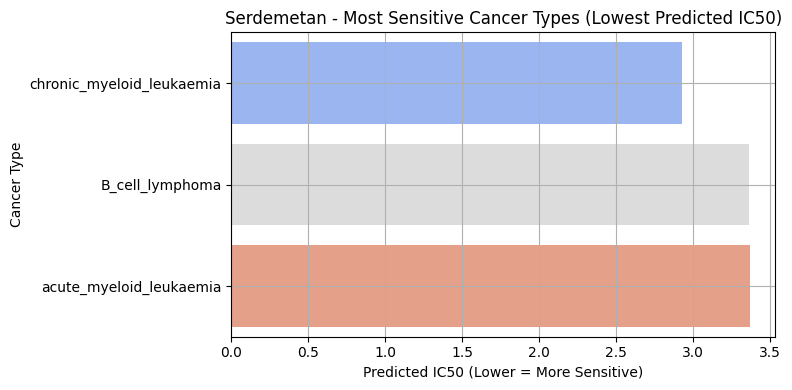

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


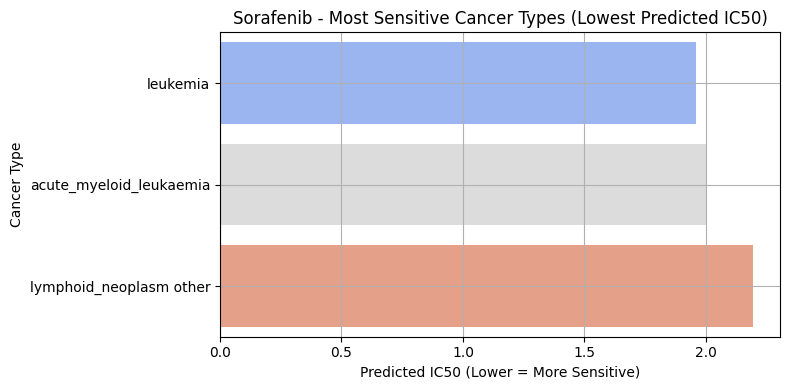

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


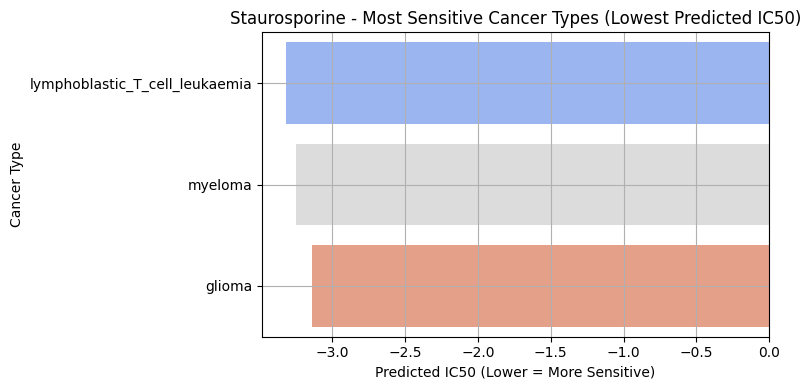

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


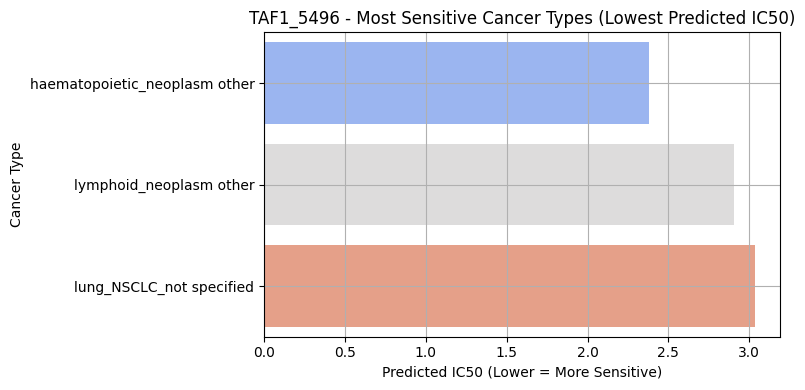

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


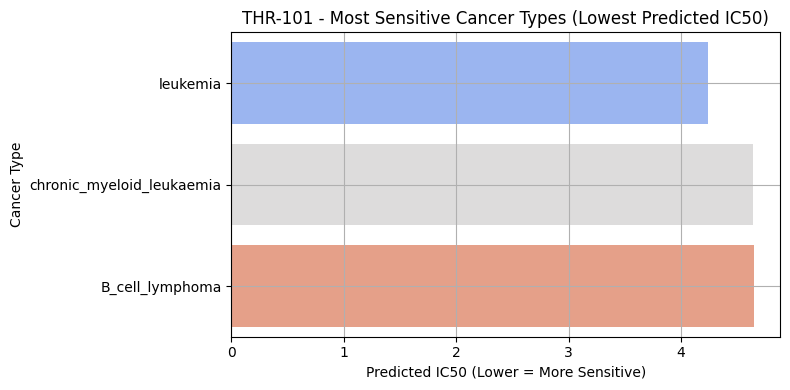

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


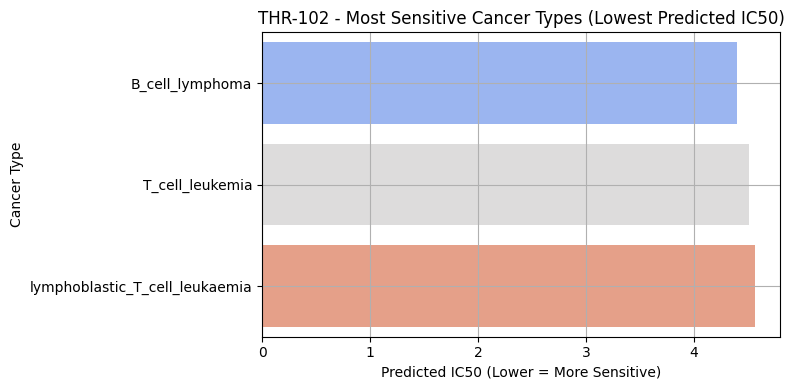

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


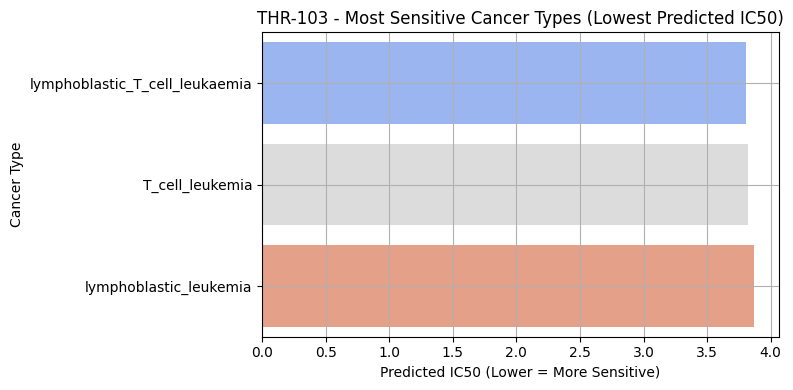

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


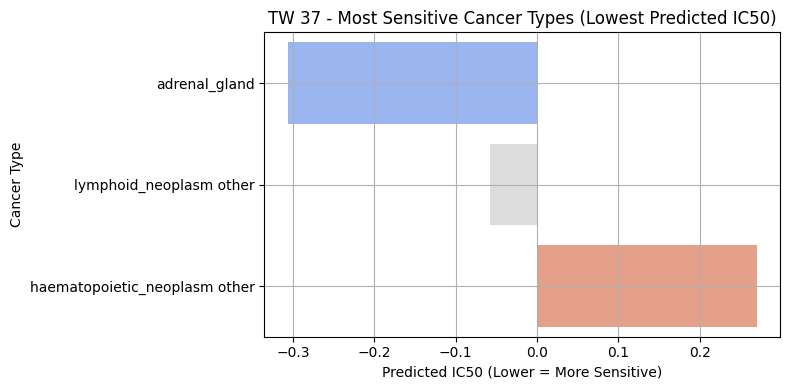

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


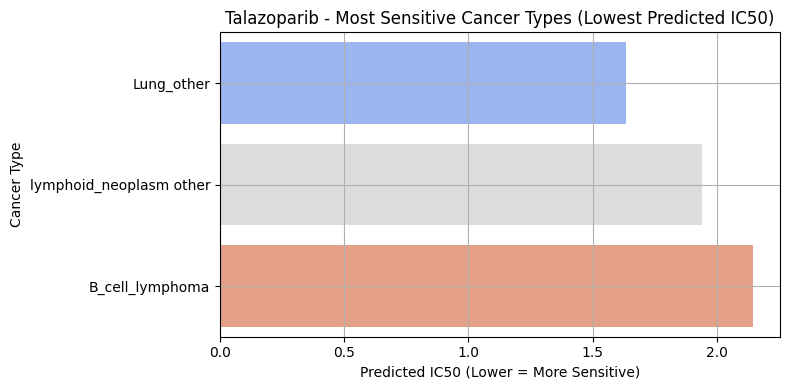

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


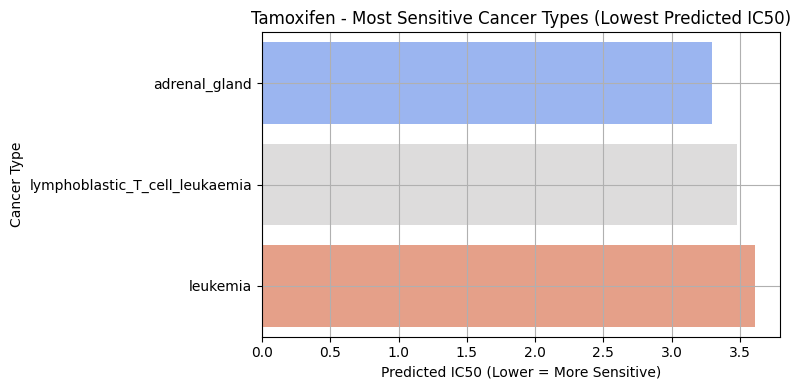

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


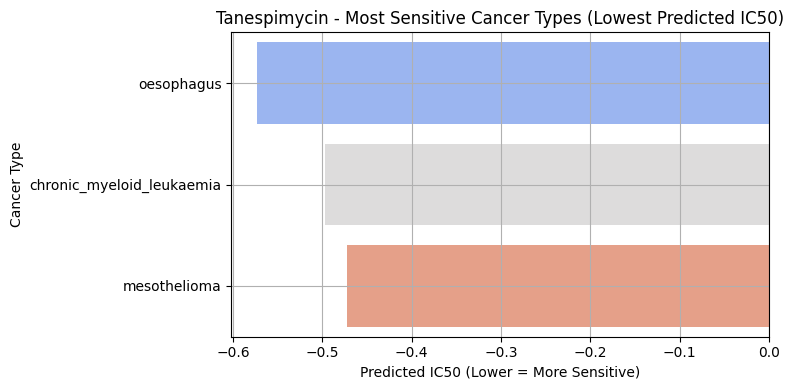

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


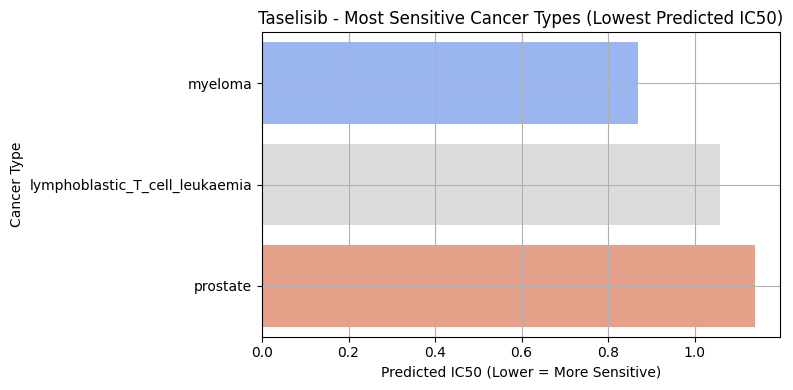

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


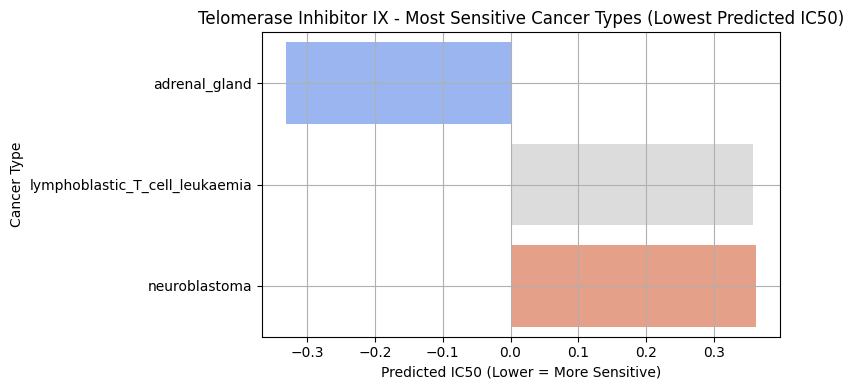

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


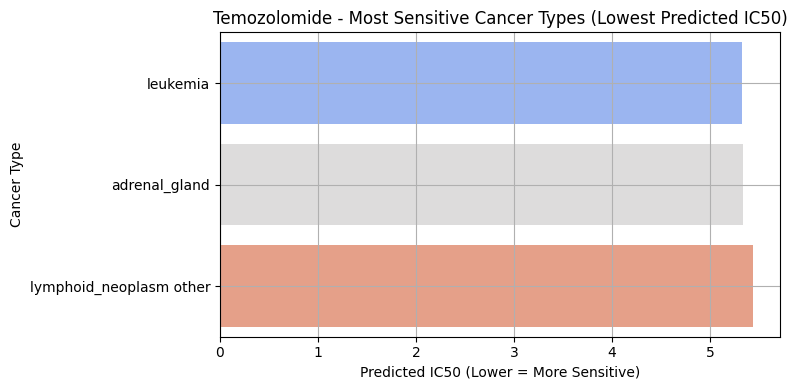

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


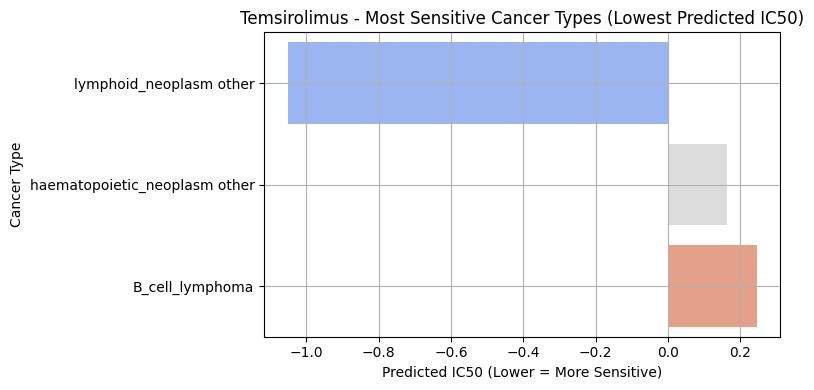

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


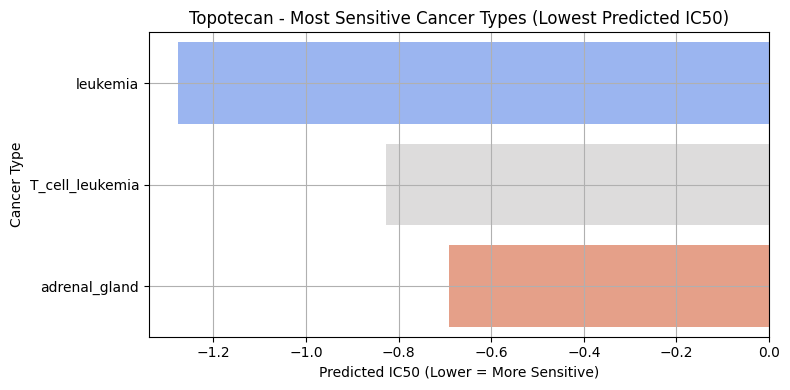

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


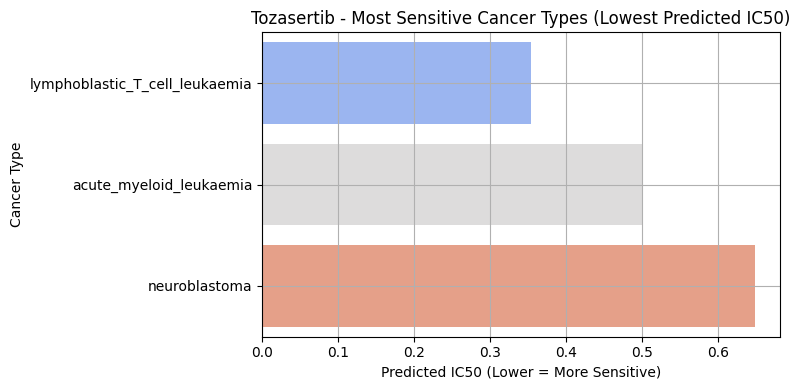

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


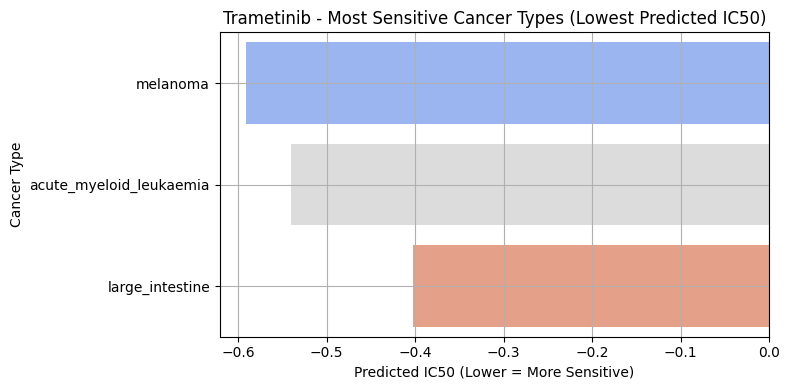

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


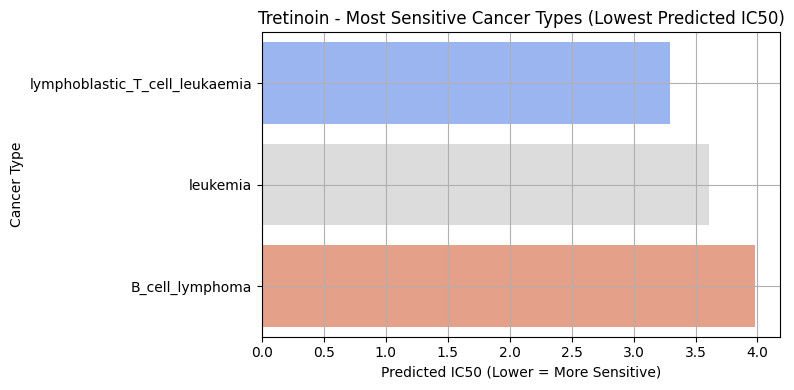

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


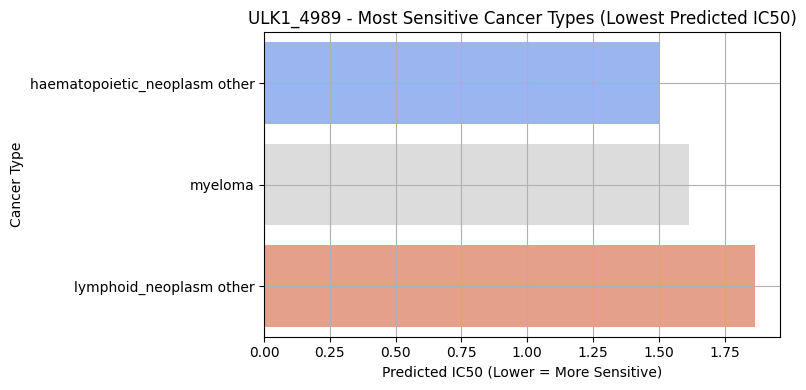

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


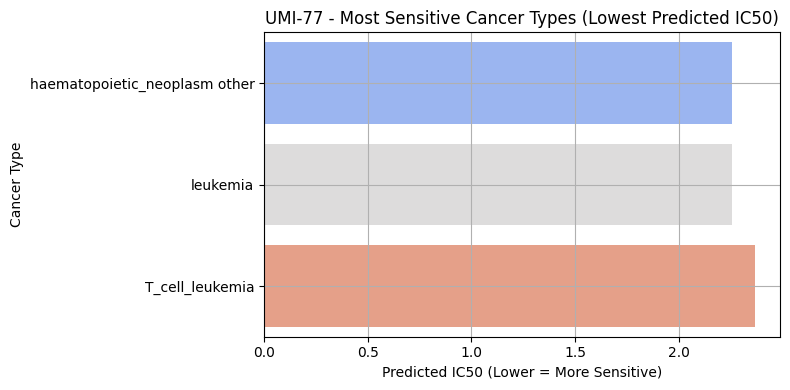

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


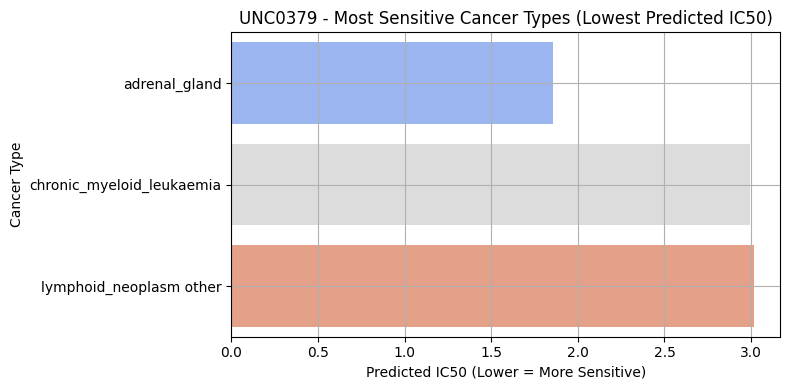

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


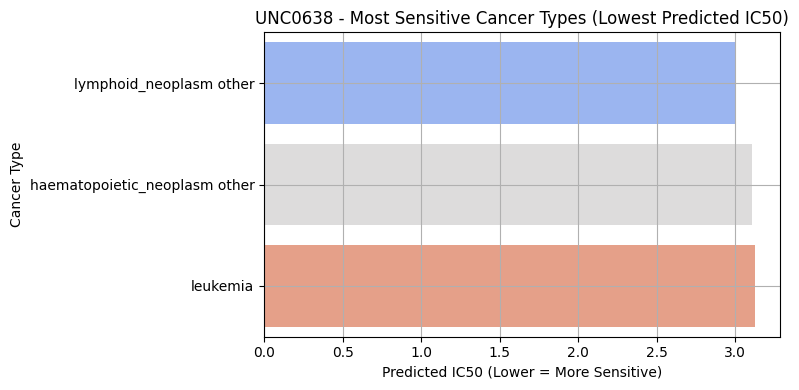

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


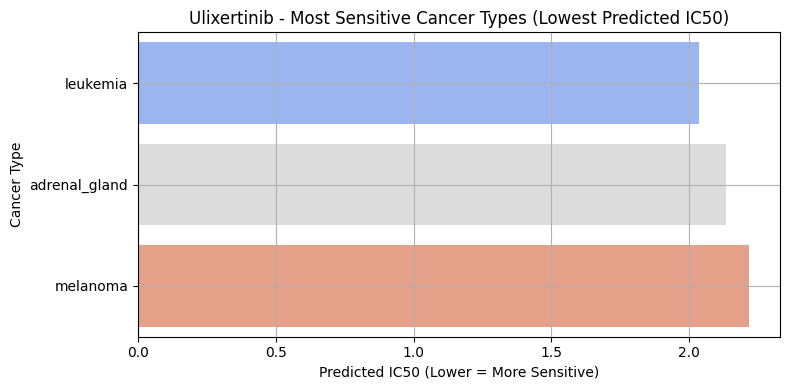

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


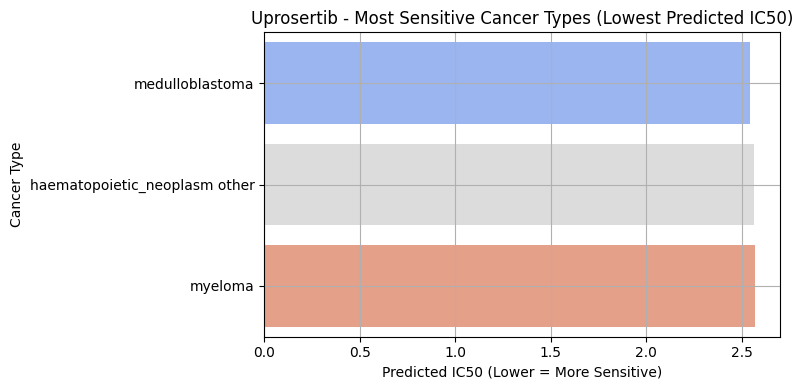

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


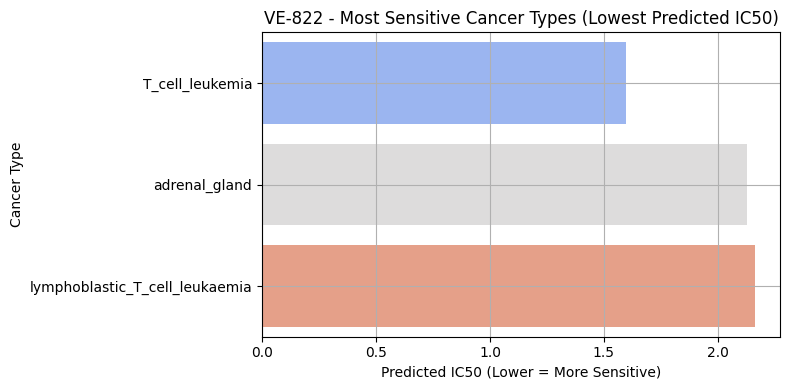

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


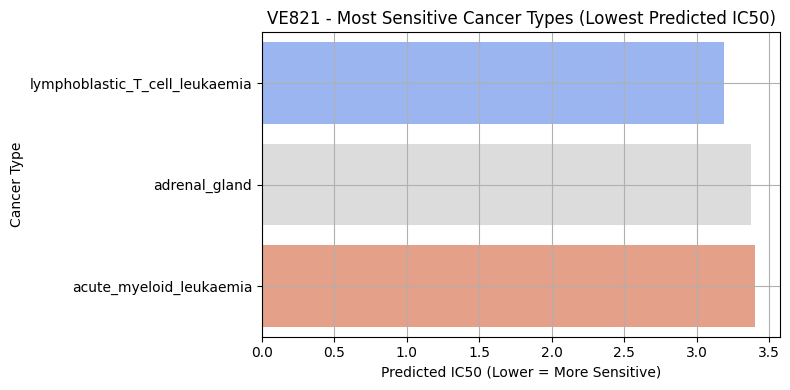

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


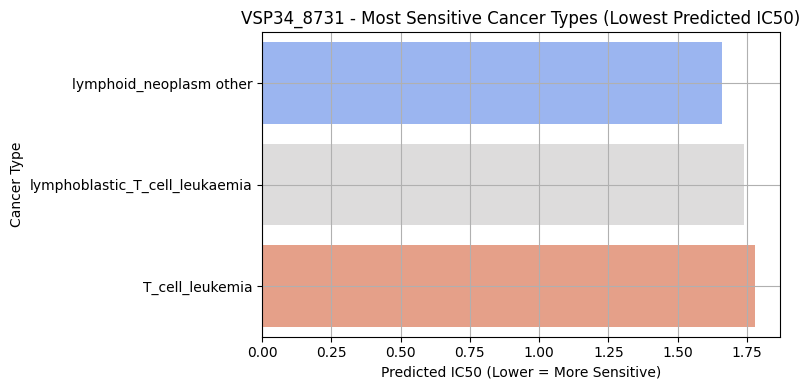

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


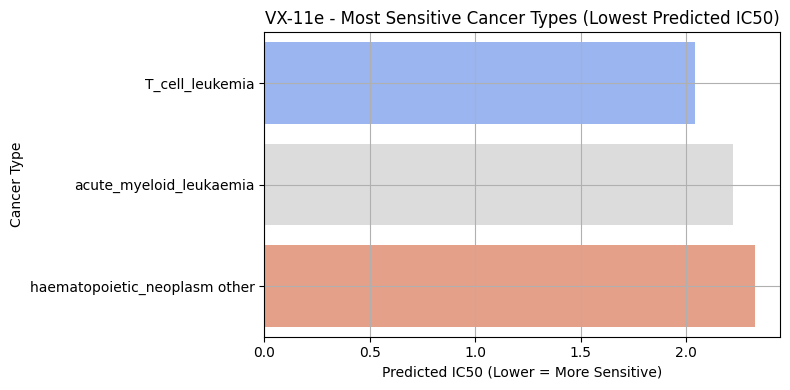

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


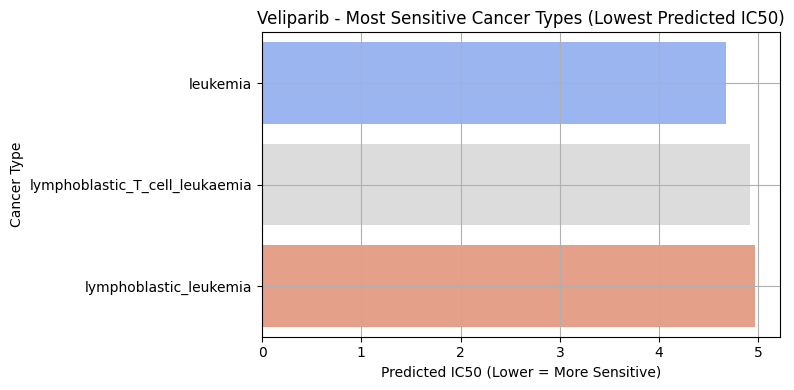

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


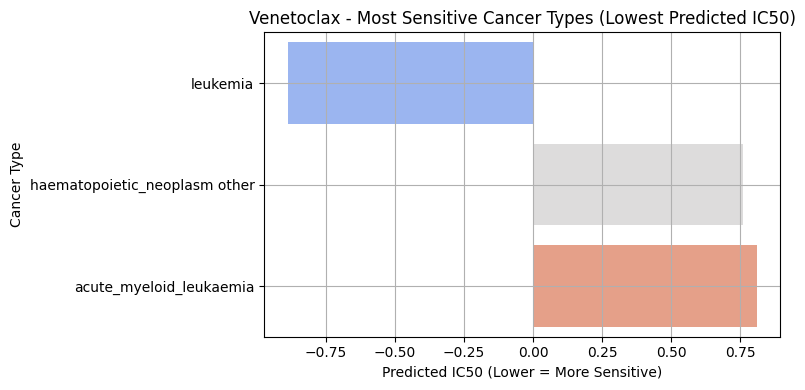

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


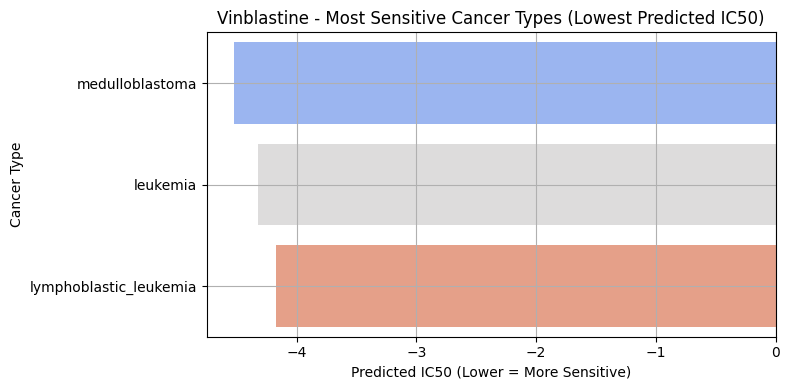

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


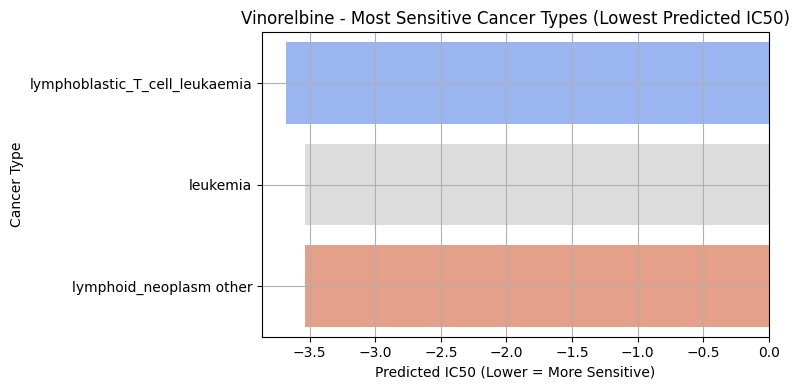

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


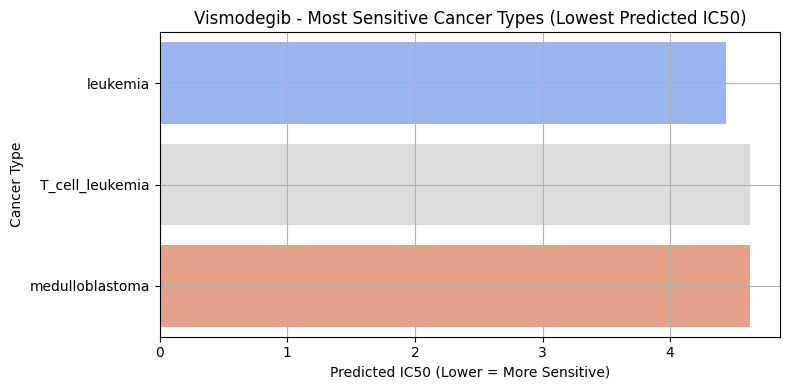

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


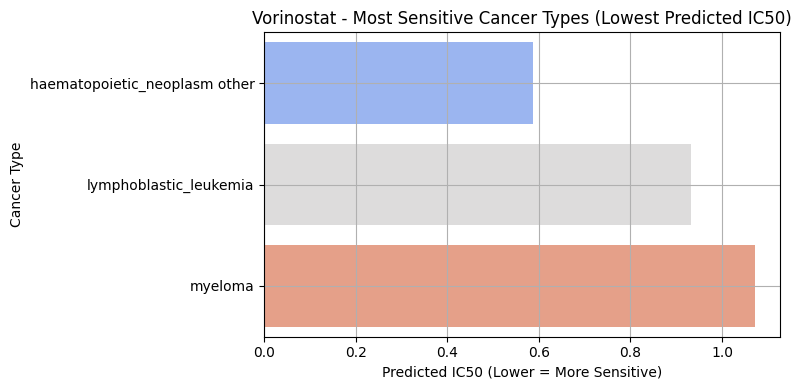

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


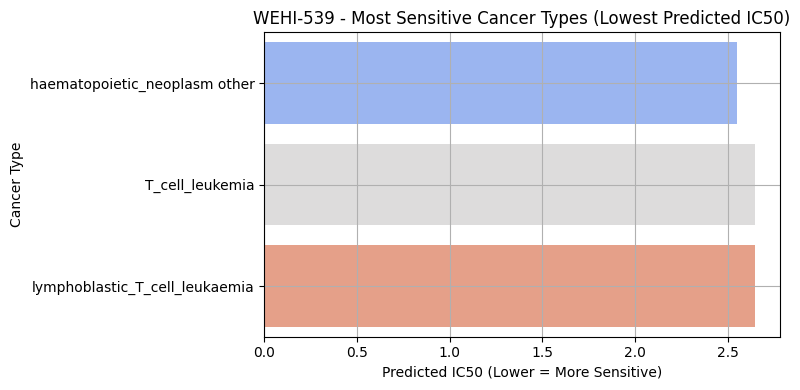

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


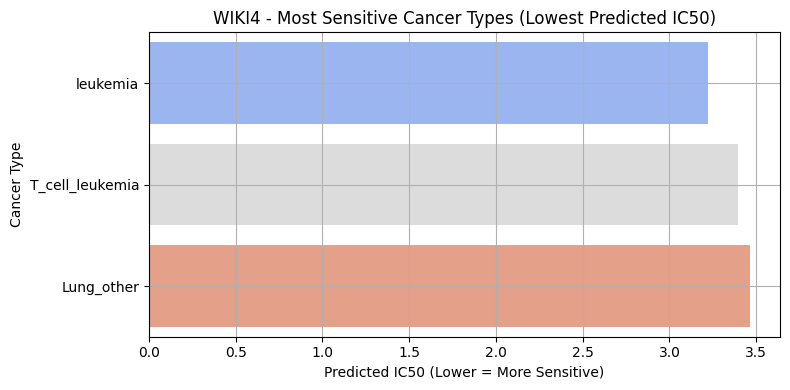

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


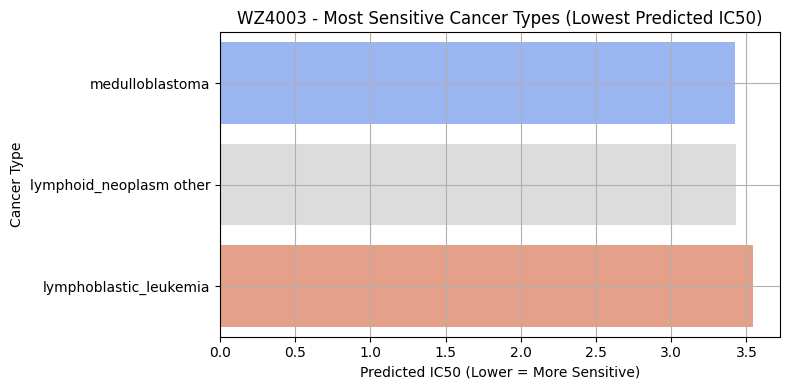

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


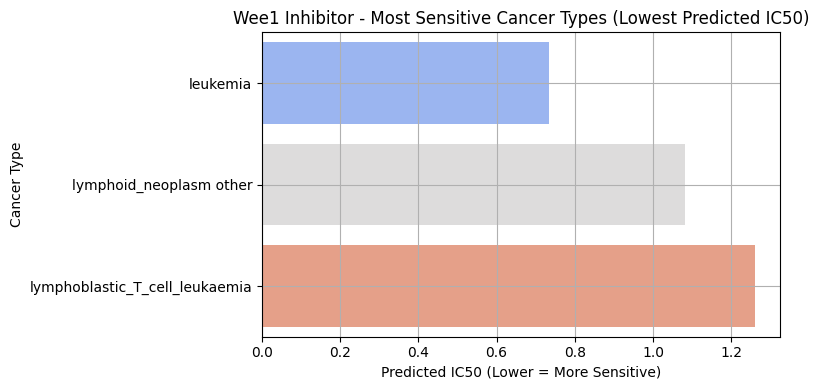

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


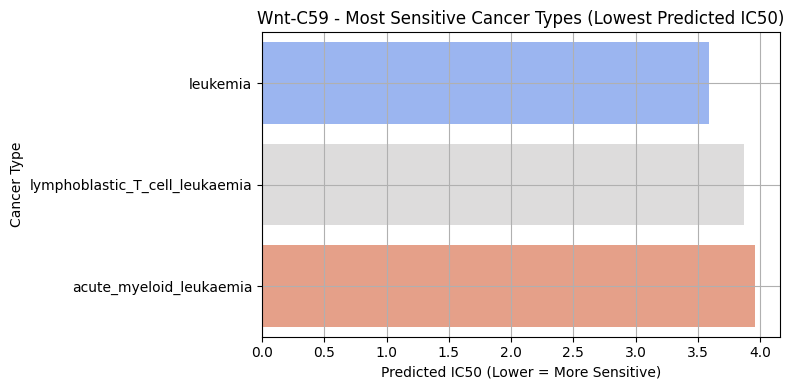

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


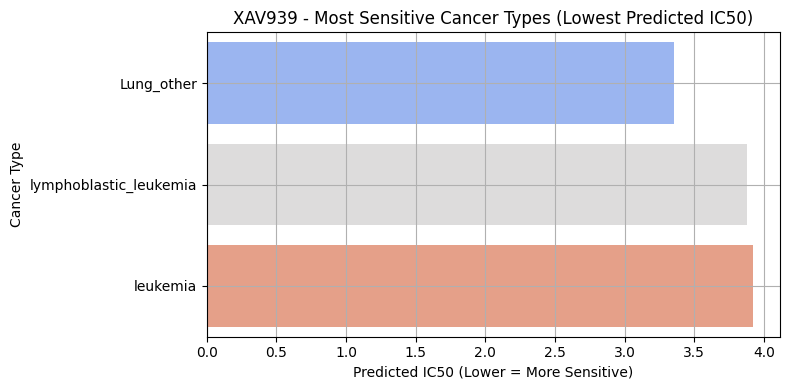

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


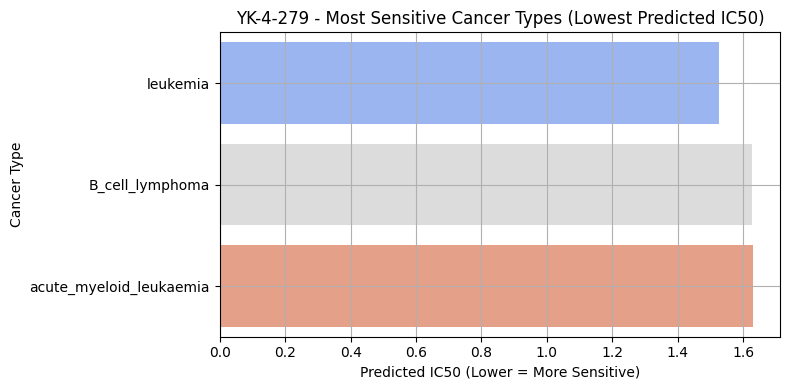

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


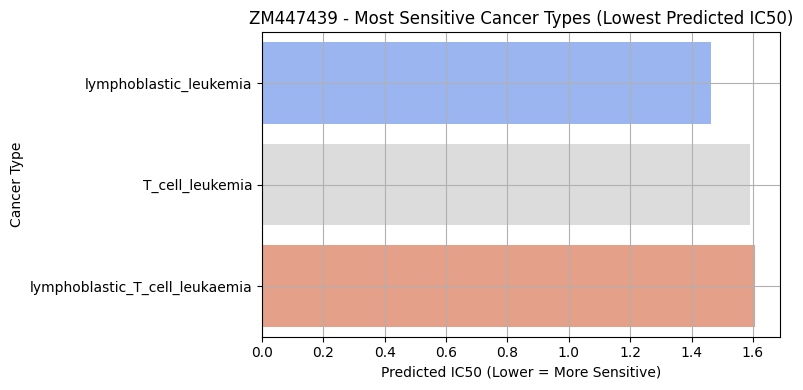

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


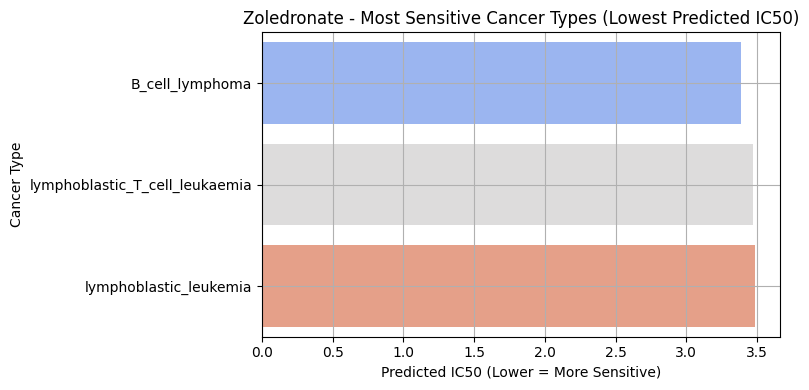

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


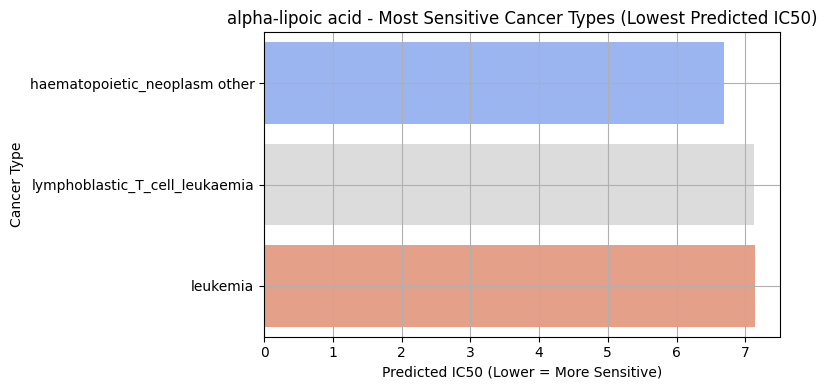

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


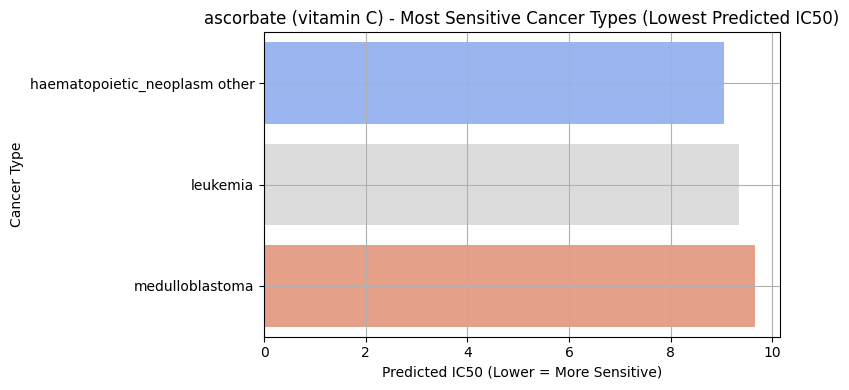

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\3116593406.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


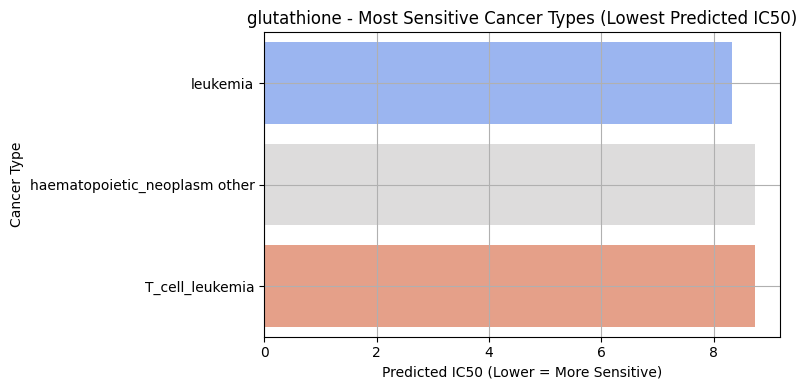

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot top cancer types (lowest IC50) for each drug
for drug in top_by_drug['DRUG_NAME'].unique():
    drug_df = top_by_drug[top_by_drug['DRUG_NAME'] == drug]

    plt.figure(figsize=(8, 4))
    sns.barplot(
        data=drug_df,
        x='Predicted_IC50',
        y='GDSC Tissue descriptor 2',
        palette='coolwarm',
        orient='h'
    )

    plt.title(f"{drug} - Most Sensitive Cancer Types (Lowest Predicted IC50)")
    plt.xlabel("Predicted IC50 (Lower = More Sensitive)")
    plt.ylabel("Cancer Type")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


📘 N-acetyl cysteine:
   R² Score (IC50 prediction): 0.001
   Selected Genes: 57


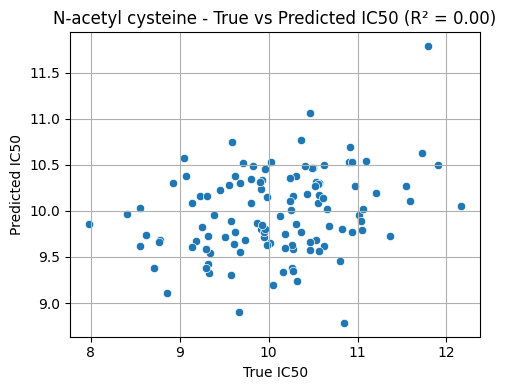

In [12]:
from sklearn.metrics import r2_score

# Calculate R² on test set
r2 = r2_score(y_test, model.predict(X_test))

# Print model performance
print(f"📘 {drug}:")
print(f"   R² Score (IC50 prediction): {r2:.3f}")
print(f"   Selected Genes: {len(selected_genes)}")

# Scatter plot: True vs Predicted IC50
plt.figure(figsize=(5, 4))
sns.scatterplot(x=y_test, y=model.predict(X_test))
plt.title(f"{drug} - True vs Predicted IC50 (R² = {r2:.2f})")
plt.xlabel("True IC50")
plt.ylabel("Predicted IC50")
plt.grid(True)
plt.tight_layout()
plt.show()


In [20]:
# 📊 Final interpretation: Which drug is best for which cancer type?
summary_table = top_by_drug.sort_values("Predicted_IC50").reset_index(drop=True)

print("\n🔬 Final Summary: Most Effective Drugs by Cancer Type (Lowest Predicted IC50)\n")
for idx, row in summary_table.iterrows():
    print(f"👉 {row['DRUG_NAME']} is most effective for '{row['GDSC Tissue descriptor 2']}' (Predicted IC50: {row['Predicted_IC50']:.2f})")





🔬 Final Summary: Most Effective Drugs by Cancer Type (Lowest Predicted IC50)

👉 Romidepsin is most effective for 'T_cell_leukemia' (Predicted IC50: -5.59)
👉 Romidepsin is most effective for 'lymphoblastic_T_cell_leukaemia' (Predicted IC50: -5.58)
👉 Romidepsin is most effective for 'lymphoid_neoplasm other' (Predicted IC50: -5.57)
👉 Bortezomib is most effective for 'adrenal_gland' (Predicted IC50: -5.38)
👉 Bortezomib is most effective for 'medulloblastoma' (Predicted IC50: -5.20)
👉 SN-38 is most effective for 'lymphoid_neoplasm other' (Predicted IC50: -5.20)
👉 Bortezomib is most effective for 'leukemia' (Predicted IC50: -5.16)
👉 SN-38 is most effective for 'adrenal_gland' (Predicted IC50: -4.97)
👉 Docetaxel is most effective for 'adrenal_gland' (Predicted IC50: -4.79)
👉 Daporinad is most effective for 'adrenal_gland' (Predicted IC50: -4.76)
👉 Daporinad is most effective for 'lymphoblastic_T_cell_leukaemia' (Predicted IC50: -4.76)
👉 Sepantronium bromide is most effective for 'lymphoid_n

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\4203840067.py:23: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\4203840067.py:23: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
C:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


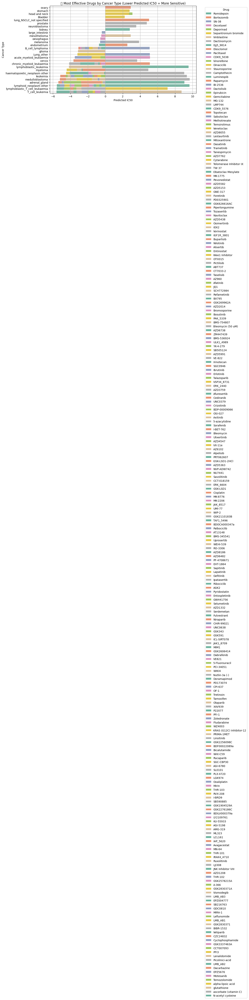

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort for clarity
summary_table = top_by_drug.sort_values("Predicted_IC50").reset_index(drop=True)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(
    data=summary_table,
    x="Predicted_IC50",
    y="GDSC Tissue descriptor 2",
    hue="DRUG_NAME",
    dodge=False,
    palette="Set2"
)

plt.title("🔬 Most Effective Drugs by Cancer Type (Lower Predicted IC50 = More Sensitive)")
plt.xlabel("Predicted IC50")
plt.ylabel("Cancer Type")
plt.gca().invert_yaxis()  # Most sensitive at top
plt.legend(title="Drug", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(True)
plt.show()


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\1839421483.py:26: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_6104\1839421483.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
C:\Users\ADMIN\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


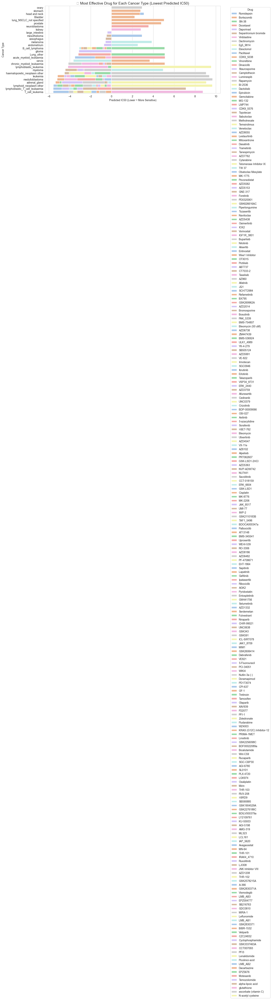

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort by lowest predicted IC50 for easy reading
summary_table = top_by_drug.sort_values("Predicted_IC50").reset_index(drop=True)

# Plot a clean horizontal bar chart
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

sns.barplot(
    data=summary_table,
    x="Predicted_IC50",
    y="GDSC Tissue descriptor 2",
    hue="DRUG_NAME",
    dodge=False,
    palette="pastel"
)

# Chart labels
plt.title("🔬 Most Effective Drug for Each Cancer Type (Lowest Predicted IC50)", fontsize=14)
plt.xlabel("Predicted IC50 (Lower = More Sensitive)")
plt.ylabel("Cancer Type")
plt.gca().invert_yaxis()  # Show most sensitive at top
plt.legend(title="Drug", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

